Idea generated with AI

# Hospital Workload Optimization Project

This project implements a hospital workload optimization system that focuses on patient admission scheduling and balanced workload allocation across hospital wards. The aim is to optimize both operational costs (like admission delays and operating theater utilization) and the fairness of workload distribution (balancing workloads spatially across wards and temporally over days).

## Class Overview

### Hospital
- **Attributes:**
  - `wards`: List of `Ward` objects in the hospital.
  - `operating_theaters`: List of `OperatingTheater` objects in the hospital.
- **Description:**  
  Represents the hospital entity and provides methods to add wards, operating theaters, and schedule patients based on the available resources.

### Ward
- **Attributes:**
  - `name`: Unique identifier or name of the ward.
  - `specialization`: The medical specialization of the ward (e.g., Cardiology, Surgery).
  - `capacity`: Maximum number of patients that can be admitted.
  - `current_load`: Current number of patients (workload) in the ward.
- **Description:**  
  Models a hospital ward that tracks its capacity and workload. It is responsible for checking admission feasibility and updating the workload when a patient is admitted.

### Patient
- **Attributes:**
  - `name`: Identifier for the patient.
  - `required_specialization`: The medical specialty needed for the patient’s treatment.
  - `required_procedure`: The surgical procedure the patient requires.
  - `admission_window`: Tuple indicating the earliest and latest acceptable admission dates.
  - `workload_impact`: A numeric measure representing the impact of the patient on the ward’s workload.
- **Description:**  
  Represents a patient with specific admission requirements, including time windows for admission and workload considerations.

### OperatingTheater
- **Attributes:**
  - `name`: Identifier for the operating theater.
  - `available_slots`: List of available time slots for scheduling surgeries.
  - `schedule`: Dictionary mapping time slots to the patient scheduled at that slot.
- **Description:**  
  Manages the scheduling of surgeries by maintaining available time slots and ensuring that only one patient is scheduled per slot.

### OptimizationModel
- **Attributes:**
  - `hospital`: The `Hospital` object containing wards and operating theaters.
  - `patients`: List of `Patient` objects to be scheduled.
  - `model`: The underlying MILP model (to be built using a solver like Gurobi, PuLP, etc.).
  - `decision_variables`: A container (e.g., dictionary) for storing decision variables for the model.
- **Description:**  
  Implements the integer programming formulation of the patient admission scheduling problem. It defines decision variables, constraints (such as ward capacity, time window, and specialization matching), and objective functions for both cost minimization and workload balance.

### SolutionApproach
- **Attributes:**
  - `optimization_model`: The `OptimizationModel` instance that encapsulates the MILP formulation.
  - `pareto_solutions`: List to store non-dominated solutions from the bi-objective optimization.
- **Description:**  
  Implements the Balanced Box Method to solve the bi-objective optimization problem. This class manages the search for Pareto optimal solutions that trade off between operational costs and workload balance.


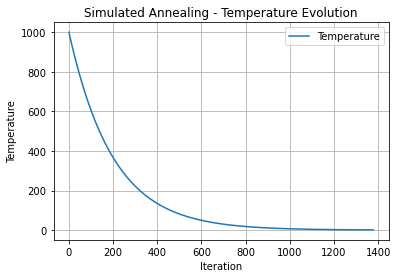

In [15]:
import random
import math
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os

# -------------------------------
# Step 1: Parsing the Instance Files
# -------------------------------

def parse_instance_file(filepath):
    """Parse a problem instance file and return the data as a structured dictionary."""
    with open(filepath, 'r') as file:
        lines = [line.strip() for line in file if line.strip()]

    instance_data = {}
    current_line = 0

    # Parse seed and minor specializations
    instance_data['seed'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['minor_specializations_per_ward'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse weights
    instance_data['weight_overtime'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['weight_undertime'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['weight_delay'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse planning period
    instance_data['days'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse specializations
    specialization_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    specializations = {}
    for _ in range(specialization_count):
        parts = lines[current_line].split()
        spec_id = parts[0]
        scaling_factor = float(parts[1])
        available_ot = [float(t) for t in parts[2].split(';')]
        specializations[spec_id] = {
            'scaling_factor': scaling_factor,
            'available_ot': available_ot
        }
        current_line += 1
    instance_data['specializations'] = specializations

    # Parse wards
    ward_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    wards = {}
    for _ in range(ward_count):
        parts = lines[current_line].split()
        ward_id = parts[0]
        bed_capacity = int(parts[1])
        workload_capacity = float(parts[2])
        major_spec = parts[3]
        minor_specs = [] if parts[4] == "NONE" else parts[4].split(',')
        carryover_patients = [int(x) for x in parts[5].split(';')]
        carryover_workload = [float(x) for x in parts[6].split(';')]
        wards[ward_id] = {
            'bed_capacity': bed_capacity,
            'workload_capacity': workload_capacity,
            'major_specialization': major_spec,
            'minor_specializations': minor_specs,
            'carryover_patients': carryover_patients,
            'carryover_workload': carryover_workload
        }
        current_line += 1
    instance_data['wards'] = wards

    # Parse patients
    patient_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    patients = {}
    for _ in range(patient_count):
        parts = lines[current_line].split()
        patient_id = parts[0]
        spec = parts[1]
        earliest = int(parts[2])
        latest = int(parts[3])
        length_of_stay = int(parts[4])
        surgery_duration = int(parts[5])
        workload = [float(x) for x in parts[6].split(';')]
        patients[patient_id] = {
            'specialization': spec,
            'earliest_admission': earliest,
            'latest_admission': latest,
            'length_of_stay': length_of_stay,
            'surgery_duration': surgery_duration,
            'workload': workload
        }
        current_line += 1
    instance_data['patients'] = patients

    return instance_data

# -------------------------------
# Step 2: Simulated Annealing Setup
# -------------------------------

class SimulatedAnnealingScheduler:
    def __init__(self, instance_data, initial_temp=1000, cooling_rate=0.995, min_temp=1):
        self.instance_data = instance_data
        self.temperature = initial_temp
        self.cooling_rate = cooling_rate
        self.min_temp = min_temp
        self.current_solution = self.generate_initial_solution()
        self.best_solution = self.current_solution.copy()

        # Statistics tracking
        self.temperature_history = []
        self.cost_history = []
        self.vacant_beds_history = []

    def generate_initial_solution(self):
        """Generate a random initial solution where patients are assigned to wards."""
        solution = {}
        wards = list(self.instance_data['wards'].keys())
        for patient in self.instance_data['patients']:
            assigned_ward = random.choice(wards)
            assigned_day = random.randint(self.instance_data['patients'][patient]['earliest_admission'],
                                          self.instance_data['patients'][patient]['latest_admission'])
            solution[patient] = {'ward': assigned_ward, 'day': assigned_day}
        return solution

    def calculate_cost(self, solution):
        """Evaluate the solution by computing a cost function."""
        cost = 0
        ward_loads = {ward: 0 for ward in self.instance_data['wards']}
        for patient, data in solution.items():
            ward_loads[data['ward']] += 1
        for ward, load in ward_loads.items():
            if load > self.instance_data['wards'][ward]['bed_capacity']:
                cost += (load - self.instance_data['wards'][ward]['bed_capacity']) * 10
        return cost

    def run(self):
        """Run Simulated Annealing with statistics tracking."""
        while self.temperature > self.min_temp:
            new_solution = self.generate_initial_solution()
            current_cost = self.calculate_cost(self.current_solution)
            new_cost = self.calculate_cost(new_solution)
            if new_cost < current_cost or random.uniform(0, 1) < math.exp((current_cost - new_cost) / self.temperature):
                self.current_solution = new_solution
                if new_cost < self.calculate_cost(self.best_solution):
                    self.best_solution = new_solution
            self.temperature_history.append(self.temperature)
            self.cost_history.append(new_cost)
            self.temperature *= self.cooling_rate
        return self.best_solution

# -------------------------------
# Step 3: Running Simulated Annealing on One Instance
# -------------------------------

instance_files = './data/instances/s0m0.dat'
instance_data = parse_instance_file(instance_files)
sa_scheduler = SimulatedAnnealingScheduler(instance_data)
best_schedule = sa_scheduler.run()

# Plot Results
plt.plot(sa_scheduler.temperature_history, label="Temperature")
plt.xlabel("Iteration")
plt.ylabel("Temperature")
plt.title("Simulated Annealing - Temperature Evolution")
plt.legend()
plt.grid()
plt.show()


In [1]:
import re

# -------------------------------
# Class Definitions
# -------------------------------

class Hospital:
    """Represents a hospital with multiple wards and operating theaters for scheduling patient admissions."""
    
    def __init__(self):
        """
        Initialize a new Hospital.
        
        Attributes:
            wards (list of Ward): List of wards in the hospital.
            operating_theaters (list of OperatingTheater): List of operating theaters in the hospital.
        """
        self.wards = []
        self.operating_theaters = []
    
    def add_ward(self, ward):
        """
        Add a new ward to the hospital.
        
        Args:
            ward (Ward): The Ward instance to add.
        """
        self.wards.append(ward)
    
    def add_operating_theater(self, theater):
        """
        Add a new operating theater to the hospital.
        
        Args:
            theater (OperatingTheater): The OperatingTheater instance to add.
        """
        self.operating_theaters.append(theater)
    
    def schedule_patient(self, patient):
        """
        Schedule a patient for admission and surgery.
        
        This method attempts to assign the patient to an appropriate ward and an available 
        operating theater slot. It checks ward specialization and capacity and finds a matching 
        operating theater time slot within the patient's admission time window.
        
        Args:
            patient (Patient): The patient to schedule.
        
        Returns:
            bool: True if scheduling was successful, False otherwise.
        """
        for ward in self.wards:
            if ward.specialization == patient.required_specialization and ward.can_admit(patient):
                for theater in self.operating_theaters:
                    slot = patient.find_feasible_surgery_slot(theater.available_slots)
                    if slot is not None:
                        # Reserve the ward and theater slot for the patient
                        ward.admit_patient(patient)
                        theater.schedule_surgery(patient, slot)
                        patient.assigned_ward = ward
                        patient.assigned_theater_slot = (theater, slot)
                        return True
        return False

class Ward:
    """Represents a ward in the hospital, with a specialization, capacity, and workload tracking."""
    
    def __init__(self, name, specialization, capacity):
        """
        Initialize a Ward.
        
        Args:
            name (str): Name or identifier for the ward.
            specialization (str): Medical specialization of the ward (e.g., "Cardiology").
            capacity (int): Maximum number of patients that can be accommodated at once.
        
        Attributes:
            current_load (int): Current number of patients admitted in this ward.
        """
        self.name = name
        self.specialization = specialization
        self.capacity = capacity
        self.current_load = 0  # Track how many patients are currently assigned
    
    def can_admit(self, patient):
        """
        Determine if the ward can admit the given patient.
        
        Checks if there is available capacity and if the ward's specialization matches 
        the patient's required specialization.
        
        Args:
            patient (Patient): The patient to check.
        
        Returns:
            bool: True if the ward can admit the patient, False otherwise.
        """
        return self.current_load < self.capacity and patient.required_specialization == self.specialization
    
    def admit_patient(self, patient):
        """
        Admit a patient to this ward, incrementing the current workload.
        
        Args:
            patient (Patient): The patient to admit to the ward.
        
        Raises:
            Exception: If the ward is at full capacity or specialization does not match.
        """
        if not self.can_admit(patient):
            raise Exception(f"Ward {self.name} cannot admit patient {patient.name}.")
        self.current_load += 1

class Patient:
    """Represents a patient needing admission, including their scheduling requirements and impact on workload."""
    
    def __init__(self, name, required_specialization, required_procedure, admission_window, workload_impact):
        """
        Initialize a Patient.
        
        Args:
            name (str): Name or identifier for the patient.
            required_specialization (str): The ward specialization required for this patient (based on their condition).
            required_procedure (str): The surgical procedure required for the patient.
            admission_window (tuple): A tuple (start_date, end_date) indicating the acceptable admission date range.
            workload_impact (int or float): A measure of the patient's impact on workload.
        
        Attributes:
            assigned_ward (Ward or None): The ward to which the patient is assigned (after scheduling).
            assigned_theater_slot (tuple or None): The assigned operating theater and time slot for surgery, if any.
        """
        self.name = name
        self.required_specialization = required_specialization
        self.required_procedure = required_procedure
        self.admission_window = admission_window  # e.g., (earliest, latest)
        self.workload_impact = workload_impact
        self.assigned_ward = None
        self.assigned_theater_slot = None
    
    def find_feasible_surgery_slot(self, available_slots):
        """
        Find a feasible surgery slot from a list of available slots that falls within the patient's admission window.
        
        Args:
            available_slots (list): List of available time slots (could be date/time objects or other representations).
        
        Returns:
            slot: An available slot that falls within the admission window, or None if no suitable slot is found.
        """
        for slot in available_slots:
            if self.admission_window[0] <= slot <= self.admission_window[1]:
                return slot
        return None

class OperatingTheater:
    """Represents an operating theater with available time slots and scheduling constraints for surgeries."""
    
    def __init__(self, name, available_slots):
        """
        Initialize an OperatingTheater.
        
        Args:
            name (str): Name or identifier for the operating theater.
            available_slots (list): List of available time slots for surgeries.
        
        Attributes:
            schedule (dict): Dictionary mapping time slots to the patient scheduled at that slot (None if free).
        """
        self.name = name
        self.available_slots = list(available_slots)
        self.schedule = {slot: None for slot in self.available_slots}
    
    def is_slot_available(self, slot):
        """
        Check if a given time slot is available.
        
        Args:
            slot: The time slot to check.
        
        Returns:
            bool: True if the slot is available, False otherwise.
        """
        return slot in self.schedule and self.schedule[slot] is None
    
    def schedule_surgery(self, patient, slot):
        """
        Schedule a surgery for a patient at a given time slot.
        
        Args:
            patient (Patient): The patient to schedule.
            slot: The time slot for the surgery.
        
        Returns:
            bool: True if scheduling was successful, False otherwise.
        """
        if self.is_slot_available(slot):
            self.schedule[slot] = patient
            if slot in self.available_slots:
                self.available_slots.remove(slot)
            return True
        return False

class OptimizationModel:
    """Defines the optimization model (MILP) for patient admission scheduling with workload balancing and cost minimization."""
    
    def __init__(self, hospital, patients):
        """
        Initialize the optimization model with hospital data and patients.
        
        Args:
            hospital (Hospital): The hospital instance containing wards and theaters.
            patients (list of Patient): List of patients to be scheduled.
        """
        self.hospital = hospital
        self.patients = patients
        self.model = None  # Replace with an actual ILP model instance if using a solver
        self.decision_variables = {}
    
    def build_model(self):
        """
        Build the integer programming model with decision variables, constraints, and objectives.
        
        The model includes:
         - Ward assignment constraints.
         - Operating theater scheduling within admission windows.
         - Workload balancing constraints.
         - Two objectives: operational cost and workload imbalance.
        """
        self.model = "Constructed MILP model with variables, constraints, and objectives"
    
    def solve(self):
        """
        Solve the optimization model using an ILP solver.
        
        Returns:
            object: The solver's solution (or status) for the optimization problem.
        """
        solution = "Optimal solution from solver"
        return solution
    
    def get_solution(self):
        """
        Extract the solution from the model in a user-friendly format.
        
        Returns:
            dict: Mapping of patients to their assigned ward and operating theater slot.
        """
        result = {}
        for patient in self.patients:
            result[patient.name] = (
                patient.assigned_ward.name if patient.assigned_ward else None,
                patient.assigned_theater_slot[0].name if patient.assigned_theater_slot else None,
                patient.assigned_theater_slot[1] if patient.assigned_theater_slot else None
            )
        return result

class SolutionApproach:
    """Implements the Balanced Box Method for the bi-objective optimization problem."""
    
    def __init__(self, optimization_model):
        """
        Initialize with the given optimization model.
        
        Args:
            optimization_model (OptimizationModel): The optimization model instance.
        """
        self.optimization_model = optimization_model
        self.pareto_solutions = []
    
    def solve_bi_objective(self):
        """
        Solve the bi-objective optimization problem using the Balanced Box Method.
        
        Returns:
            list: Non-dominated solutions from the Pareto front.
        """
        solution = self.optimization_model.solve()
        self.pareto_solutions.append(solution)
        return self.pareto_solutions
    
    def get_pareto_front(self):
        """
        Get the Pareto front solutions.
        
        Returns:
            list: A list of mappings from patients to assignments representing non-dominated solutions.
        """
        pareto_front = []
        for sol in self.pareto_solutions:
            solution_mapping = self.optimization_model.get_solution()
            pareto_front.append(solution_mapping)
        return pareto_front

# -------------------------------
# Parser Function
# -------------------------------

def parse_instance_file(filepath):
    """
    Parse a problem instance file and return the data as a dictionary.
    
    The file format is as follows:
    1. Line 1: Seed value.
    2. Line 2: Number of minor specializations per ward.
    3. Lines 3-5: Weights for OT overtime, OT undertime, and admission delay.
    4. Line 6: Number of days in the planning period.
    5. Line 7: Total number of specializations (S).
    6. Next S lines: [Specialization id] [Workload scaling factor] [Available OT time per day (semicolon separated)]
    7. Next line: "Wards: <number>"
    8. Next lines: For each ward: 
       [Ward id] [Bed capacity] [Workload capacity] [Major specialization] [Minor specializations or NONE] [Carryover patients] [Carryover workload]
    9. Next line: "Patients: <number>"
    10. Remaining lines: For each patient:
        [Patient id] [Specialization] [Earliest admission] [Latest admission] [Length of stay] [Surgery duration] [Workload per day (semicolon separated)]
    """
    with open(filepath, 'r') as file:
        lines = [line.strip() for line in file if line.strip()]
    
    instance_data = {}
    current_line = 0

    # Parse seed and minor specializations (lines 1-2)
    instance_data['seed'] = int(re.search(r'\d+', lines[current_line]).group())
    current_line += 1
    instance_data['minor_specializations_per_ward'] = int(re.search(r'\d+', lines[current_line]).group())
    current_line += 1

    # Parse weights (lines 3-5)
    instance_data['weight_overtime'] = float(re.search(r'[\d\.]+', lines[current_line]).group())
    current_line += 1
    instance_data['weight_undertime'] = float(re.search(r'[\d\.]+', lines[current_line]).group())
    current_line += 1
    instance_data['weight_delay'] = float(re.search(r'[\d\.]+', lines[current_line]).group())
    current_line += 1

    # Parse planning period (line 6)
    instance_data['days'] = int(re.search(r'\d+', lines[current_line]).group())
    current_line += 1

    # Parse specializations (line 7 and next S lines)
    specialization_count = int(re.search(r'\d+', lines[current_line]).group())
    current_line += 1
    specializations = {}
    for _ in range(specialization_count):
        parts = lines[current_line].split()
        spec_id = parts[0]
        scaling_factor = float(parts[1])
        available_ot = [float(t) for t in parts[2].split(';')]
        specializations[spec_id] = {
            'scaling_factor': scaling_factor,
            'available_ot': available_ot
        }
        current_line += 1
    instance_data['specializations'] = specializations

    # Parse wards: Look for a line starting with "Wards:"
    ward_line_match = re.match(r'Wards:\s*(\d+)', lines[current_line])
    if ward_line_match:
        ward_count = int(ward_line_match.group(1))
        current_line += 1
    else:
        raise ValueError("Could not find ward count.")
    
    wards = {}
    for _ in range(ward_count):
        parts = lines[current_line].split()
        ward_id = parts[0]
        bed_capacity = int(parts[1])
        workload_capacity = float(parts[2])
        major_spec = parts[3]
        minor_specs = [] if parts[4] == "NONE" else parts[4].split(',')
        carryover_patients = [int(x) for x in parts[5].split(';')]
        carryover_workload = [float(x) for x in parts[6].split(';')]
        wards[ward_id] = {
            'bed_capacity': bed_capacity,
            'workload_capacity': workload_capacity,
            'major_specialization': major_spec,
            'minor_specializations': minor_specs,
            'carryover_patients': carryover_patients,
            'carryover_workload': carryover_workload
        }
        current_line += 1
    instance_data['wards'] = wards

    # Parse patients: Look for a line starting with "Patients:"
    patient_line_match = re.match(r'Patients:\s*(\d+)', lines[current_line])
    if patient_line_match:
        patient_count = int(patient_line_match.group(1))
        current_line += 1
    else:
        raise ValueError("Could not find patient count.")
    
    patients = {}
    for _ in range(patient_count):
        parts = lines[current_line].split()
        patient_id = parts[0]
        spec = parts[1]
        earliest = int(parts[2])
        latest = int(parts[3])
        length_of_stay = int(parts[4])
        surgery_duration = int(parts[5])
        workload = [float(x) for x in parts[6].split(';')]
        patients[patient_id] = {
            'specialization': spec,
            'earliest_admission': earliest,
            'latest_admission': latest,
            'length_of_stay': length_of_stay,
            'surgery_duration': surgery_duration,
            'workload': workload
        }
        current_line += 1
    instance_data['patients'] = patients

    return instance_data

# -------------------------------
# Example: Build Objects from Parsed Data
# -------------------------------

def build_hospital_instance(instance_data):
    """
    Build a Hospital object and related entities (Wards, Operating Theaters, Patients)
    from the parsed instance data.
    
    Returns:
        hospital (Hospital): The constructed Hospital object.
        patients (list of Patient): List of Patient objects.
    """
    hospital = Hospital()
    
    # Create Wards from instance_data
    for ward_id, data in instance_data['wards'].items():
        ward = Ward(name=ward_id,
                    specialization=data['major_specialization'],
                    capacity=data['bed_capacity'])
        hospital.add_ward(ward)
    
    # For this example, we create a single Operating Theater for all specializations.
    # We use the OT time available from the first specialization (or you can design more complex logic).
    first_spec = next(iter(instance_data['specializations'].values()))
    available_slots = first_spec['available_ot']  # List of OT time slots
    theater = OperatingTheater(name="OT1", available_slots=available_slots)
    hospital.add_operating_theater(theater)
    
    # Create Patient objects
    patients = []
    for patient_id, data in instance_data['patients'].items():
        patient = Patient(name=patient_id,
                          required_specialization=data['specialization'],
                          required_procedure="Procedure_" + data['specialization'],  # placeholder procedure
                          admission_window=(data['earliest_admission'], data['latest_admission']),
                          workload_impact=data['workload'][0])  # using the first workload value as an example
        patients.append(patient)
    
    return hospital, patients

# -------------------------------
# Putting It All Together
# -------------------------------

# Example usage:
# Replace 'instance_file.txt' with the path to your instance file.
# filepath = "instance_file.txt"
# instance_data = parse_instance_file(filepath)
# hospital, patients = build_hospital_instance(instance_data)
# 
# # Optionally, schedule patients one by one:
# for patient in patients:
#     scheduled = hospital.schedule_patient(patient)
#     print(f"Patient {patient.name} scheduling status: {scheduled}")
#
# # Build and solve the optimization model (if using a solver)
# opt_model = OptimizationModel(hospital, patients)
# opt_model.build_model()
# solution = opt_model.solve()
# print(opt_model.get_solution())
#
# # Use the SolutionApproach if exploring Pareto solutions:
# sol_approach = SolutionApproach(opt_model)
# pareto_solutions = sol_approach.solve_bi_objective()
# print(sol_approach.get_pareto_front())


In [4]:
import glob
import os

# Get list of instance files from the specified directory
instance_files = glob.glob('./data/instances/*.dat')
print(f"Found {len(instance_files)} instance files.")

if instance_files:
    # Loop over each instance file
    for filepath in instance_files:
        print(f"\nTesting file: {filepath}")
        
        # Parse the instance file
        instance_data = parse_instance_file(filepath)
        
        # Build Hospital instance and Patient objects from the parsed data
        hospital, patients = build_hospital_instance(instance_data)
        
        # Display parsed wards from the Hospital
        print("Hospital Wards:")
        for ward in hospital.wards:
            print(f"  Ward: {ward.name}, Specialization: {ward.specialization}, Capacity: {ward.capacity}")
        
        # Display parsed theaters with their available slots
        print("Operating Theaters:")
        for theater in hospital.operating_theaters:
            print(f"  Theater: {theater.name}, Available Slots: {theater.available_slots}")
        
        # Display parsed patients along with admission windows
        print("Patients:")
        for patient in patients:
            print(f"  Patient: {patient.name}, Specialization: {patient.required_specialization}, Admission Window: {patient.admission_window}")
        
        # -------------------------------
        # Use the Optimization Model
        # -------------------------------
        # Clear previous assignments
        for patient in patients:
            patient.assigned_ward = None
            patient.assigned_theater_slot = None
        
        # Create the optimization model using the hospital and patients
        opt_model = OptimizationModel(hospital, patients)
        opt_model.build_model()
        solution = opt_model.solve()
        print("\nOptimization Model Solution:")
        print(solution)
        
        # --------------------------------------------------
        # Debug: Show available slots before scheduling each patient
        # --------------------------------------------------
        print("\nDebug Info Before Scheduling:")
        for theater in hospital.operating_theaters:
            print(f"  Theater {theater.name} slots: {theater.available_slots}")
        for patient in patients:
            print(f"  Patient {patient.name} admission window: {patient.admission_window}")
        
        # Actively schedule patients
        print("\nScheduling Patients:")
        for patient in patients:
            if patient.assigned_ward is None:
                scheduled = hospital.schedule_patient(patient)
                if scheduled:
                    print(f"  Patient {patient.name} scheduled successfully.")
                else:
                    print(f"  Patient {patient.name} could NOT be scheduled.")
                    # Debug: check potential reasons
                    for theater in hospital.operating_theaters:
                        print(f"    Theater {theater.name} remaining slots: {theater.available_slots}")
                    print(f"    Patient {patient.name} admission window: {patient.admission_window}")
        
        # Display final allocations from the optimization model
        allocations = opt_model.get_solution()
        print("\nFinal Allocations from Optimization Model:")
        for patient_name, allocation in allocations.items():
            ward_name, theater_name, slot = allocation
            print(f"  Patient {patient_name}: Ward {ward_name}, Theater {theater_name}, Slot {slot}")
        
        # -------------------------------
        # Use the SolutionApproach for Pareto Front
        # -------------------------------
        sol_approach = SolutionApproach(opt_model)
        pareto_solutions = sol_approach.solve_bi_objective()
        print("\nPareto Front Solutions:")
        for idx, pareto in enumerate(sol_approach.get_pareto_front()):
            print(f"  Solution {idx+1}:")
            for patient_name, allocation in pareto.items():
                ward_name, theater_name, slot = allocation
                print(f"    Patient {patient_name}: Ward {ward_name}, Theater {theater_name}, Slot {slot}")
else:
    print("No instance files found in './data/instances/*.dat'.")


Found 1000 instance files.

Testing file: ./data/instances\s0m0.dat
Hospital Wards:
  Ward: THO, Specialization: THO, Capacity: 40
  Ward: RHK, Specialization: RHK, Capacity: 28
  Ward: ABD, Specialization: ABD, Capacity: 38
  Ward: TRH, Specialization: TRH, Capacity: 35
Operating Theaters:
  Theater: OT1, Available Slots: [371.0, 929.0, 731.0, 959.0, 679.0, 271.0, 315.0]
Patients:
  Patient: patient0, Specialization: THO, Admission Window: (0, 0)
  Patient: patient1, Specialization: THO, Admission Window: (0, 5)
  Patient: patient2, Specialization: THO, Admission Window: (0, 0)
  Patient: patient3, Specialization: THO, Admission Window: (0, 0)
  Patient: patient4, Specialization: THO, Admission Window: (1, 1)
  Patient: patient5, Specialization: THO, Admission Window: (2, 2)
  Patient: patient6, Specialization: THO, Admission Window: (3, 4)
  Patient: patient7, Specialization: THO, Admission Window: (3, 3)
  Patient: patient8, Specialization: THO, Admission Window: (3, 3)
  Patient: p

KeyboardInterrupt: 

In [3]:
import os
import random
import math
import time
import pandas as pd

# -------------------------------
# Step 1: Parsing the Instance Files
# -------------------------------

def parse_instance_file(filepath):
    """Parse a problem instance file and return the data as a structured dictionary."""
    with open(filepath, 'r') as file:
        lines = [line.strip() for line in file if line.strip()]

    instance_data = {}
    current_line = 0

    # Parse seed and minor specializations
    instance_data['seed'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['minor_specializations_per_ward'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse weights
    instance_data['weight_overtime'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['weight_undertime'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['weight_delay'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse planning period
    instance_data['days'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse specializations
    specialization_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    specializations = {}
    for _ in range(specialization_count):
        parts = lines[current_line].split()
        spec_id = parts[0]
        scaling_factor = float(parts[1])
        available_ot = [float(t) for t in parts[2].split(';')]
        specializations[spec_id] = {
            'scaling_factor': scaling_factor,
            'available_ot': available_ot
        }
        current_line += 1
    instance_data['specializations'] = specializations

    # Parse wards
    ward_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    wards = {}
    for _ in range(ward_count):
        parts = lines[current_line].split()
        ward_id = parts[0]
        bed_capacity = int(parts[1])
        workload_capacity = float(parts[2])
        major_spec = parts[3]
        minor_specs = [] if parts[4] == "NONE" else parts[4].split(',')
        carryover_patients = [int(x) for x in parts[5].split(';')]
        carryover_workload = [float(x) for x in parts[6].split(';')]
        wards[ward_id] = {
            'bed_capacity': bed_capacity,
            'workload_capacity': workload_capacity,
            'major_specialization': major_spec,
            'minor_specializations': minor_specs,
            'carryover_patients': carryover_patients,
            'carryover_workload': carryover_workload
        }
        current_line += 1
    instance_data['wards'] = wards

    # Parse patients
    patient_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    patients = {}
    for _ in range(patient_count):
        parts = lines[current_line].split()
        patient_id = parts[0]
        spec = parts[1]
        earliest = int(parts[2])
        latest = int(parts[3])
        length_of_stay = int(parts[4])
        surgery_duration = int(parts[5])
        workload = [float(x) for x in parts[6].split(';')]
        patients[patient_id] = {
            'specialization': spec,
            'earliest_admission': earliest,
            'latest_admission': latest,
            'length_of_stay': length_of_stay,
            'surgery_duration': surgery_duration,
            'workload': workload
        }
        current_line += 1
    instance_data['patients'] = patients

    return instance_data


# -------------------------------
# Step 2: Simulated Annealing Setup with Métricas de Eficiência
# -------------------------------

class SimulatedAnnealingScheduler:
    def __init__(self, instance_data, initial_temp=1000, cooling_rate=0.995, min_temp=1):
        self.instance_data = instance_data
        self.temperature = initial_temp
        self.cooling_rate = cooling_rate
        self.min_temp = min_temp
        self.current_solution = self.generate_initial_solution()
        self.best_solution = self.current_solution.copy()
        self.initial_cost = self.calculate_cost(self.current_solution)
        self.iterations = 0
        self.runtime = 0
        self.final_cost = None

    def generate_initial_solution(self):
        """Generate a random initial solution where patients are assigned to wards."""
        solution = {}
        wards = list(self.instance_data['wards'].keys())
        for patient in self.instance_data['patients']:
            assigned_ward = random.choice(wards)
            assigned_day = random.randint(self.instance_data['patients'][patient]['earliest_admission'],
                                          self.instance_data['patients'][patient]['latest_admission'])
            solution[patient] = {'ward': assigned_ward, 'day': assigned_day}
        return solution

    def calculate_cost(self, solution):
        """Evaluate the solution by computing a cost function."""
        cost = 0
        # Penalize ward overloads
        ward_loads = {ward: 0 for ward in self.instance_data['wards']}
        for patient, data in solution.items():
            ward_loads[data['ward']] += 1

        for ward, load in ward_loads.items():
            if load > self.instance_data['wards'][ward]['bed_capacity']:
                cost += (load - self.instance_data['wards'][ward]['bed_capacity']) * 10

        # Penalize surgery scheduling conflicts
        surgery_conflicts = 0
        scheduled_surgeries = {}
        for patient, data in solution.items():
            surgery_day = data['day']
            if surgery_day in scheduled_surgeries:
                scheduled_surgeries[surgery_day] += 1
            else:
                scheduled_surgeries[surgery_day] = 1

        for day, count in scheduled_surgeries.items():
            if count > len(self.instance_data['specializations']):
                surgery_conflicts += (count - len(self.instance_data['specializations'])) * 5

        cost += surgery_conflicts

        return cost

    def make_neighbor_solution(self):
        """Create a neighboring solution by randomly changing a patient's assignment."""
        new_solution = self.current_solution.copy()
        patient = random.choice(list(new_solution.keys()))
        new_solution[patient]['ward'] = random.choice(list(self.instance_data['wards'].keys()))
        new_solution[patient]['day'] = random.randint(self.instance_data['patients'][patient]['earliest_admission'],
                                                      self.instance_data['patients'][patient]['latest_admission'])
        return new_solution

    def run(self):
        """Run Simulated Annealing to find an optimal scheduling solution."""
        start_time = time.time()
        iteration_count = 0

        while self.temperature > self.min_temp:
            iteration_count += 1
            new_solution = self.make_neighbor_solution()
            current_cost = self.calculate_cost(self.current_solution)
            new_cost = self.calculate_cost(new_solution)

            # Accept new solution if it's better or with probability based on temperature
            if new_cost < current_cost or random.uniform(0, 1) < math.exp((current_cost - new_cost) / self.temperature):
                self.current_solution = new_solution
                if new_cost < self.calculate_cost(self.best_solution):
                    self.best_solution = new_solution

            # Cool down
            self.temperature *= self.cooling_rate

        self.iterations = iteration_count
        self.runtime = time.time() - start_time
        self.final_cost = self.calculate_cost(self.best_solution)
        return self.best_solution


# -------------------------------
# Step 3: Executar Simulated Annealing para todas as instâncias no diretório e Salvar Resultados
# -------------------------------

instance_dir = "./data/instances"
schedule_results = []   # Lista para armazenar o DataFrame com o agendamento de cada instância
metrics_list = []       # Lista para armazenar as métricas de cada instância

# Itera por todos os arquivos .dat no diretório
for filename in os.listdir(instance_dir):
    if filename.endswith(".dat"):
        filepath = os.path.join(instance_dir, filename)
        print(f"Processando o arquivo de instância: {filename}")
        instance_data = parse_instance_file(filepath)
        sa_scheduler = SimulatedAnnealingScheduler(instance_data)
        best_schedule = sa_scheduler.run()

        # Converter a melhor solução para DataFrame e adicionar uma coluna com o nome da instância
        df_results = pd.DataFrame(best_schedule).T.reset_index()
        df_results.rename(columns={'index': 'patient'}, inplace=True)
        df_results['instance'] = filename
        schedule_results.append(df_results)

        # Armazenar as métricas de eficiência
        instance_metrics = {
            "instance": filename,
            "iterations": sa_scheduler.iterations,
            "runtime_seconds": sa_scheduler.runtime,
            "initial_cost": sa_scheduler.initial_cost,
            "final_cost": sa_scheduler.final_cost,
            "improvement": sa_scheduler.initial_cost - sa_scheduler.final_cost
        }
        metrics_list.append(instance_metrics)

        # Imprime os resultados da instância atual
        print(df_results)
        print("\n" + "="*50 + "\n")

# Combina todos os DataFrames de agendamento em um único DataFrame
all_schedules_df = pd.concat(schedule_results, ignore_index=True)
# Salva os agendamentos combinados em um CSV
all_schedules_df.to_csv("best_schedules.csv", index=False)

# Converte a lista de métricas em DataFrame e salva em CSV
metrics_df = pd.DataFrame(metrics_list)
metrics_df.to_csv("metrics_results.csv", index=False)

print("Processamento concluído. Os resultados foram salvos em 'best_schedules.csv' e 'metrics_results.csv'.")


Processando o arquivo de instância: s0m0.dat
        patient ward day  instance
0      patient0  TRH   0  s0m0.dat
1      patient1  RHK   4  s0m0.dat
2      patient2  RHK   0  s0m0.dat
3      patient3  RHK   0  s0m0.dat
4      patient4  TRH   1  s0m0.dat
..          ...  ...  ..       ...
112  patient112  TRH   6  s0m0.dat
113  patient113  RHK   5  s0m0.dat
114  patient114  RHK   6  s0m0.dat
115  patient115  TRH   6  s0m0.dat
116  patient116  THO   6  s0m0.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s0m1.dat
        patient ward day  instance
0      patient0  ABD   0  s0m1.dat
1      patient1  TRH   4  s0m1.dat
2      patient2  ABD   0  s0m1.dat
3      patient3  THO   0  s0m1.dat
4      patient4  TRH   1  s0m1.dat
..          ...  ...  ..       ...
112  patient112  TRH   5  s0m1.dat
113  patient113  THO   5  s0m1.dat
114  patient114  TRH   6  s0m1.dat
115  patient115  TRH   6  s0m1.dat
116  patient116  TRH   6  s0m1.dat

[117 rows x 4 columns]


Processando o arqu

      patient ward day    instance
0    patient0  ONC   0  s103m1.dat
1    patient1  NKO   2  s103m1.dat
2    patient2  NKO   2  s103m1.dat
3    patient3  MKA   2  s103m1.dat
4    patient4  ONC   2  s103m1.dat
..        ...  ...  ..         ...
59  patient59  ONC   6  s103m1.dat
60  patient60  ONC   5  s103m1.dat
61  patient61  ONC   6  s103m1.dat
62  patient62  MKA   6  s103m1.dat
63  patient63  ONC   6  s103m1.dat

[64 rows x 4 columns]


Processando o arquivo de instância: s103m2.dat
      patient ward day    instance
0    patient0  NKO   1  s103m2.dat
1    patient1  NKO   0  s103m2.dat
2    patient2  NKO   2  s103m2.dat
3    patient3  MKA   1  s103m2.dat
4    patient4  ONC   2  s103m2.dat
..        ...  ...  ..         ...
59  patient59  ORT   5  s103m2.dat
60  patient60  ORT   5  s103m2.dat
61  patient61  MKA   6  s103m2.dat
62  patient62  NKO   6  s103m2.dat
63  patient63  MKA   6  s103m2.dat

[64 rows x 4 columns]


Processando o arquivo de instância: s103m3.dat
      patient wa

        patient ward day    instance
0      patient0  ONC   2  s107m0.dat
1      patient1  RHK   1  s107m0.dat
2      patient2  TRA   2  s107m0.dat
3      patient3  TRA   0  s107m0.dat
4      patient4  ONC   3  s107m0.dat
..          ...  ...  ..         ...
106  patient106  TRA   6  s107m0.dat
107  patient107  URO   6  s107m0.dat
108  patient108  URO   6  s107m0.dat
109  patient109  URO   6  s107m0.dat
110  patient110  URO   6  s107m0.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s107m1.dat
        patient ward day    instance
0      patient0  ONC   2  s107m1.dat
1      patient1  URO   1  s107m1.dat
2      patient2  RHK   1  s107m1.dat
3      patient3  TRA   0  s107m1.dat
4      patient4  RHK   3  s107m1.dat
..          ...  ...  ..         ...
106  patient106  URO   6  s107m1.dat
107  patient107  TRA   6  s107m1.dat
108  patient108  ONC   6  s107m1.dat
109  patient109  RHK   6  s107m1.dat
110  patient110  TRA   6  s107m1.dat

[111 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ORT   0  s110m0.dat
1    patient1  VAT   0  s110m0.dat
2    patient2  ORT   1  s110m0.dat
3    patient3  ORT   0  s110m0.dat
4    patient4  ORT   0  s110m0.dat
..        ...  ...  ..         ...
87  patient87  ORT   4  s110m0.dat
88  patient88  VAT   4  s110m0.dat
89  patient89  VAT   4  s110m0.dat
90  patient90  TRH   5  s110m0.dat
91  patient91  ORT   5  s110m0.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s110m1.dat
      patient ward day    instance
0    patient0  ORT   0  s110m1.dat
1    patient1  GYN   0  s110m1.dat
2    patient2  GYN   1  s110m1.dat
3    patient3  TRH   1  s110m1.dat
4    patient4  GYN   0  s110m1.dat
..        ...  ...  ..         ...
87  patient87  VAT   4  s110m1.dat
88  patient88  GYN   4  s110m1.dat
89  patient89  VAT   5  s110m1.dat
90  patient90  GYN   5  s110m1.dat
91  patient91  TRH   5  s110m1.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s110m2.dat
      patient wa

        patient ward day    instance
0      patient0  GYN   0  s113m3.dat
1      patient1  ORT   0  s113m3.dat
2      patient2  GYN   3  s113m3.dat
3      patient3  TRH   1  s113m3.dat
4      patient4  NCH   4  s113m3.dat
..          ...  ...  ..         ...
98    patient98  GYN   4  s113m3.dat
99    patient99  GYN   4  s113m3.dat
100  patient100  ORT   5  s113m3.dat
101  patient101  ORT   5  s113m3.dat
102  patient102  GYN   6  s113m3.dat

[103 rows x 4 columns]


Processando o arquivo de instância: s114m0.dat
        patient ward day    instance
0      patient0  ONC   0  s114m0.dat
1      patient1  URO   0  s114m0.dat
2      patient2  MKA   1  s114m0.dat
3      patient3  TRA   0  s114m0.dat
4      patient4  MKA   0  s114m0.dat
..          ...  ...  ..         ...
101  patient101  URO   4  s114m0.dat
102  patient102  ONC   5  s114m0.dat
103  patient103  MKA   6  s114m0.dat
104  patient104  URO   5  s114m0.dat
105  patient105  ONC   6  s114m0.dat

[106 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  GYN   0  s117m2.dat
1      patient1  VAT   0  s117m2.dat
2      patient2  ONC   0  s117m2.dat
3      patient3  ONC   1  s117m2.dat
4      patient4  THO   0  s117m2.dat
..          ...  ...  ..         ...
107  patient107  ONC   5  s117m2.dat
108  patient108  GYN   5  s117m2.dat
109  patient109  THO   6  s117m2.dat
110  patient110  GYN   6  s117m2.dat
111  patient111  ONC   6  s117m2.dat

[112 rows x 4 columns]


Processando o arquivo de instância: s117m3.dat
        patient ward day    instance
0      patient0  GYN   0  s117m3.dat
1      patient1  ONC   0  s117m3.dat
2      patient2  VAT   0  s117m3.dat
3      patient3  ONC   5  s117m3.dat
4      patient4  THO   0  s117m3.dat
..          ...  ...  ..         ...
107  patient107  THO   5  s117m3.dat
108  patient108  VAT   5  s117m3.dat
109  patient109  THO   6  s117m3.dat
110  patient110  GYN   6  s117m3.dat
111  patient111  GYN   6  s117m3.dat

[112 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ONC   0  s120m2.dat
1    patient1  NKO   0  s120m2.dat
2    patient2  ORT   0  s120m2.dat
3    patient3  ORT   1  s120m2.dat
4    patient4  ORT   0  s120m2.dat
..        ...  ...  ..         ...
78  patient78  ONC   4  s120m2.dat
79  patient79  NKO   4  s120m2.dat
80  patient80  MKA   5  s120m2.dat
81  patient81  MKA   5  s120m2.dat
82  patient82  ORT   6  s120m2.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s120m3.dat
      patient ward day    instance
0    patient0  ONC   0  s120m3.dat
1    patient1  MKA   0  s120m3.dat
2    patient2  MKA   0  s120m3.dat
3    patient3  MKA   0  s120m3.dat
4    patient4  MKA   0  s120m3.dat
..        ...  ...  ..         ...
78  patient78  NKO   5  s120m3.dat
79  patient79  ONC   4  s120m3.dat
80  patient80  ONC   5  s120m3.dat
81  patient81  ORT   5  s120m3.dat
82  patient82  ORT   6  s120m3.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s121m0.dat
      patient wa

        patient ward day    instance
0      patient0  VAT   0  s124m2.dat
1      patient1  VAT   0  s124m2.dat
2      patient2  VAT   2  s124m2.dat
3      patient3  VAT   0  s124m2.dat
4      patient4  VAT   0  s124m2.dat
..          ...  ...  ..         ...
112  patient112  RHK   6  s124m2.dat
113  patient113  NKO   6  s124m2.dat
114  patient114  NCH   6  s124m2.dat
115  patient115  NCH   6  s124m2.dat
116  patient116  NKO   6  s124m2.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s124m3.dat
        patient ward day    instance
0      patient0  NKO   0  s124m3.dat
1      patient1  NCH   0  s124m3.dat
2      patient2  NKO   1  s124m3.dat
3      patient3  VAT   0  s124m3.dat
4      patient4  NKO   0  s124m3.dat
..          ...  ...  ..         ...
112  patient112  NCH   6  s124m3.dat
113  patient113  NKO   6  s124m3.dat
114  patient114  VAT   6  s124m3.dat
115  patient115  NCH   6  s124m3.dat
116  patient116  NKO   6  s124m3.dat

[117 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ABD   0  s128m2.dat
1    patient1  ABD   0  s128m2.dat
2    patient2  MKA   0  s128m2.dat
3    patient3  RHK   2  s128m2.dat
4    patient4  MKA   1  s128m2.dat
..        ...  ...  ..         ...
78  patient78  RHK   5  s128m2.dat
79  patient79  ABD   5  s128m2.dat
80  patient80  ABD   5  s128m2.dat
81  patient81  ABD   5  s128m2.dat
82  patient82  ABD   6  s128m2.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s128m3.dat
      patient ward day    instance
0    patient0  MKA   0  s128m3.dat
1    patient1  MKA   0  s128m3.dat
2    patient2  MKA   0  s128m3.dat
3    patient3  GYN   3  s128m3.dat
4    patient4  ABD   2  s128m3.dat
..        ...  ...  ..         ...
78  patient78  RHK   5  s128m3.dat
79  patient79  ABD   5  s128m3.dat
80  patient80  GYN   5  s128m3.dat
81  patient81  MKA   5  s128m3.dat
82  patient82  RHK   6  s128m3.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s129m0.dat
        patient 

      patient ward day    instance
0    patient0  MKA   3  s131m1.dat
1    patient1  MKA   1  s131m1.dat
2    patient2  GYN   1  s131m1.dat
3    patient3  ONC   2  s131m1.dat
4    patient4  ABD   3  s131m1.dat
..        ...  ...  ..         ...
89  patient89  ONC   5  s131m1.dat
90  patient90  ONC   5  s131m1.dat
91  patient91  GYN   5  s131m1.dat
92  patient92  GYN   6  s131m1.dat
93  patient93  MKA   6  s131m1.dat

[94 rows x 4 columns]


Processando o arquivo de instância: s131m2.dat
      patient ward day    instance
0    patient0  ABD   5  s131m2.dat
1    patient1  ONC   5  s131m2.dat
2    patient2  GYN   3  s131m2.dat
3    patient3  ONC   3  s131m2.dat
4    patient4  ONC   3  s131m2.dat
..        ...  ...  ..         ...
89  patient89  GYN   5  s131m2.dat
90  patient90  GYN   5  s131m2.dat
91  patient91  ONC   5  s131m2.dat
92  patient92  MKA   6  s131m2.dat
93  patient93  ABD   6  s131m2.dat

[94 rows x 4 columns]


Processando o arquivo de instância: s131m3.dat
      patient wa

        patient ward day    instance
0      patient0  URO   2  s135m1.dat
1      patient1  TRA   1  s135m1.dat
2      patient2  URO   0  s135m1.dat
3      patient3  TRA   0  s135m1.dat
4      patient4  URO   1  s135m1.dat
..          ...  ...  ..         ...
107  patient107  TRA   6  s135m1.dat
108  patient108  URO   6  s135m1.dat
109  patient109  TRA   6  s135m1.dat
110  patient110  TRA   6  s135m1.dat
111  patient111  URO   6  s135m1.dat

[112 rows x 4 columns]


Processando o arquivo de instância: s135m2.dat
        patient ward day    instance
0      patient0  ABD   1  s135m2.dat
1      patient1  TRA   0  s135m2.dat
2      patient2  VAT   0  s135m2.dat
3      patient3  ABD   0  s135m2.dat
4      patient4  ABD   1  s135m2.dat
..          ...  ...  ..         ...
107  patient107  TRA   6  s135m2.dat
108  patient108  ABD   6  s135m2.dat
109  patient109  TRA   6  s135m2.dat
110  patient110  URO   6  s135m2.dat
111  patient111  TRA   6  s135m2.dat

[112 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  NCH   5  s139m0.dat
1      patient1  NCH   1  s139m0.dat
2      patient2  NCH   0  s139m0.dat
3      patient3  URO   1  s139m0.dat
4      patient4  URO   1  s139m0.dat
..          ...  ...  ..         ...
112  patient112  TRH   6  s139m0.dat
113  patient113  NCH   6  s139m0.dat
114  patient114  TRH   6  s139m0.dat
115  patient115  URO   6  s139m0.dat
116  patient116  URO   6  s139m0.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s139m1.dat
        patient ward day    instance
0      patient0  TRH   1  s139m1.dat
1      patient1  TRH   1  s139m1.dat
2      patient2  URO   1  s139m1.dat
3      patient3  URO   1  s139m1.dat
4      patient4  VAT   3  s139m1.dat
..          ...  ...  ..         ...
112  patient112  VAT   6  s139m1.dat
113  patient113  VAT   6  s139m1.dat
114  patient114  VAT   6  s139m1.dat
115  patient115  VAT   6  s139m1.dat
116  patient116  VAT   6  s139m1.dat

[117 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  RHK   1  s142m1.dat
1    patient1  URO   2  s142m1.dat
2    patient2  ONC   5  s142m1.dat
3    patient3  URO   5  s142m1.dat
4    patient4  ONC   6  s142m1.dat
..        ...  ...  ..         ...
84  patient84  RHK   6  s142m1.dat
85  patient85  TRA   6  s142m1.dat
86  patient86  ONC   6  s142m1.dat
87  patient87  TRA   6  s142m1.dat
88  patient88  RHK   6  s142m1.dat

[89 rows x 4 columns]


Processando o arquivo de instância: s142m2.dat
      patient ward day    instance
0    patient0  RHK   1  s142m2.dat
1    patient1  TRA   2  s142m2.dat
2    patient2  URO   5  s142m2.dat
3    patient3  URO   5  s142m2.dat
4    patient4  RHK   6  s142m2.dat
..        ...  ...  ..         ...
84  patient84  URO   6  s142m2.dat
85  patient85  RHK   6  s142m2.dat
86  patient86  URO   6  s142m2.dat
87  patient87  ONC   6  s142m2.dat
88  patient88  RHK   6  s142m2.dat

[89 rows x 4 columns]


Processando o arquivo de instância: s142m3.dat
      patient wa

      patient ward day    instance
0    patient0  VAT   2  s146m1.dat
1    patient1  TRH   0  s146m1.dat
2    patient2  VAT   1  s146m1.dat
3    patient3  TRH   1  s146m1.dat
4    patient4  TRH   1  s146m1.dat
..        ...  ...  ..         ...
88  patient88  VAT   4  s146m1.dat
89  patient89  VAT   5  s146m1.dat
90  patient90  VAT   5  s146m1.dat
91  patient91  RHK   6  s146m1.dat
92  patient92  TRH   6  s146m1.dat

[93 rows x 4 columns]


Processando o arquivo de instância: s146m2.dat
      patient ward day    instance
0    patient0  THO   3  s146m2.dat
1    patient1  RHK   0  s146m2.dat
2    patient2  VAT   1  s146m2.dat
3    patient3  TRH   1  s146m2.dat
4    patient4  VAT   1  s146m2.dat
..        ...  ...  ..         ...
88  patient88  THO   4  s146m2.dat
89  patient89  TRH   5  s146m2.dat
90  patient90  RHK   5  s146m2.dat
91  patient91  TRH   6  s146m2.dat
92  patient92  THO   6  s146m2.dat

[93 rows x 4 columns]


Processando o arquivo de instância: s146m3.dat
      patient wa

        patient ward day   instance
0      patient0  ABD   0  s14m1.dat
1      patient1  VAT   0  s14m1.dat
2      patient2  ABD   0  s14m1.dat
3      patient3  NCH   0  s14m1.dat
4      patient4  ABD   1  s14m1.dat
..          ...  ...  ..        ...
101  patient101  GYN   5  s14m1.dat
102  patient102  ABD   6  s14m1.dat
103  patient103  ABD   6  s14m1.dat
104  patient104  VAT   6  s14m1.dat
105  patient105  NCH   6  s14m1.dat

[106 rows x 4 columns]


Processando o arquivo de instância: s14m2.dat
        patient ward day   instance
0      patient0  VAT   0  s14m2.dat
1      patient1  VAT   0  s14m2.dat
2      patient2  VAT   0  s14m2.dat
3      patient3  VAT   0  s14m2.dat
4      patient4  ABD   0  s14m2.dat
..          ...  ...  ..        ...
101  patient101  ABD   5  s14m2.dat
102  patient102  GYN   6  s14m2.dat
103  patient103  NCH   6  s14m2.dat
104  patient104  ABD   6  s14m2.dat
105  patient105  NCH   6  s14m2.dat

[106 rows x 4 columns]


Processando o arquivo de instância: s1

      patient ward day    instance
0    patient0  ONC   0  s153m1.dat
1    patient1  RHK   0  s153m1.dat
2    patient2  ONC   0  s153m1.dat
3    patient3  NCH   0  s153m1.dat
4    patient4  ABD   0  s153m1.dat
..        ...  ...  ..         ...
93  patient93  NCH   5  s153m1.dat
94  patient94  RHK   5  s153m1.dat
95  patient95  RHK   5  s153m1.dat
96  patient96  ABD   5  s153m1.dat
97  patient97  NCH   6  s153m1.dat

[98 rows x 4 columns]


Processando o arquivo de instância: s153m2.dat
      patient ward day    instance
0    patient0  ABD   0  s153m2.dat
1    patient1  ONC   0  s153m2.dat
2    patient2  RHK   0  s153m2.dat
3    patient3  NCH   0  s153m2.dat
4    patient4  ONC   1  s153m2.dat
..        ...  ...  ..         ...
93  patient93  RHK   5  s153m2.dat
94  patient94  NCH   5  s153m2.dat
95  patient95  ONC   5  s153m2.dat
96  patient96  RHK   5  s153m2.dat
97  patient97  RHK   6  s153m2.dat

[98 rows x 4 columns]


Processando o arquivo de instância: s153m3.dat
      patient wa

      patient ward day    instance
0    patient0  TRA   0  s155m2.dat
1    patient1  TRA   0  s155m2.dat
2    patient2  GYN   1  s155m2.dat
3    patient3  MKA   1  s155m2.dat
4    patient4  ONC   3  s155m2.dat
5    patient5  ONC   3  s155m2.dat
6    patient6  MKA   3  s155m2.dat
7    patient7  TRA   3  s155m2.dat
8    patient8  ONC   5  s155m2.dat
9    patient9  GYN   5  s155m2.dat
10  patient10  GYN   5  s155m2.dat
11  patient11  ONC   6  s155m2.dat
12  patient12  GYN   6  s155m2.dat
13  patient13  ONC   6  s155m2.dat
14  patient14  MKA   6  s155m2.dat
15  patient15  MKA   2  s155m2.dat
16  patient16  GYN   3  s155m2.dat
17  patient17  ONC   2  s155m2.dat
18  patient18  GYN   1  s155m2.dat
19  patient19  TRA   6  s155m2.dat
20  patient20  GYN   1  s155m2.dat
21  patient21  GYN   2  s155m2.dat
22  patient22  MKA   2  s155m2.dat
23  patient23  MKA   2  s155m2.dat
24  patient24  GYN   4  s155m2.dat
25  patient25  ONC   6  s155m2.dat
26  patient26  GYN   3  s155m2.dat
27  patient27  ONC  

      patient ward day    instance
0    patient0  MKA   3  s157m3.dat
1    patient1  ONC   0  s157m3.dat
2    patient2  RHK   1  s157m3.dat
3    patient3  MKA   2  s157m3.dat
4    patient4  MKA   5  s157m3.dat
..        ...  ...  ..         ...
80  patient80  MKA   5  s157m3.dat
81  patient81  THO   6  s157m3.dat
82  patient82  MKA   6  s157m3.dat
83  patient83  THO   6  s157m3.dat
84  patient84  MKA   6  s157m3.dat

[85 rows x 4 columns]


Processando o arquivo de instância: s158m0.dat
      patient ward day    instance
0    patient0  RHK   0  s158m0.dat
1    patient1  NKO   1  s158m0.dat
2    patient2  ABD   4  s158m0.dat
3    patient3  ABD   3  s158m0.dat
4    patient4  ABD   1  s158m0.dat
..        ...  ...  ..         ...
82  patient82  ABD   6  s158m0.dat
83  patient83  ABD   4  s158m0.dat
84  patient84  ORT   5  s158m0.dat
85  patient85  RHK   6  s158m0.dat
86  patient86  RHK   6  s158m0.dat

[87 rows x 4 columns]


Processando o arquivo de instância: s158m1.dat
      patient wa

      patient ward day    instance
0    patient0  GYN   0  s160m2.dat
1    patient1  RHK   0  s160m2.dat
2    patient2  URO   1  s160m2.dat
3    patient3  VAT   2  s160m2.dat
4    patient4  RHK   3  s160m2.dat
..        ...  ...  ..         ...
93  patient93  RHK   3  s160m2.dat
94  patient94  GYN   4  s160m2.dat
95  patient95  RHK   5  s160m2.dat
96  patient96  RHK   5  s160m2.dat
97  patient97  GYN   6  s160m2.dat

[98 rows x 4 columns]


Processando o arquivo de instância: s160m3.dat
      patient ward day    instance
0    patient0  RHK   0  s160m3.dat
1    patient1  URO   0  s160m3.dat
2    patient2  GYN   1  s160m3.dat
3    patient3  URO   1  s160m3.dat
4    patient4  URO   2  s160m3.dat
..        ...  ...  ..         ...
93  patient93  URO   3  s160m3.dat
94  patient94  RHK   4  s160m3.dat
95  patient95  RHK   5  s160m3.dat
96  patient96  GYN   5  s160m3.dat
97  patient97  GYN   6  s160m3.dat

[98 rows x 4 columns]


Processando o arquivo de instância: s161m0.dat
        patient 

      patient ward day    instance
0    patient0  NCH   3  s164m2.dat
1    patient1  NCH   0  s164m2.dat
2    patient2  TRH   0  s164m2.dat
3    patient3  NCH   1  s164m2.dat
4    patient4  TRH   0  s164m2.dat
..        ...  ...  ..         ...
89  patient89  NCH   0  s164m2.dat
90  patient90  ONC   2  s164m2.dat
91  patient91  TRH   6  s164m2.dat
92  patient92  NCH   6  s164m2.dat
93  patient93  ONC   6  s164m2.dat

[94 rows x 4 columns]


Processando o arquivo de instância: s164m3.dat
      patient ward day    instance
0    patient0  ONC   1  s164m3.dat
1    patient1  TRH   0  s164m3.dat
2    patient2  TRH   0  s164m3.dat
3    patient3  TRH   0  s164m3.dat
4    patient4  TRH   0  s164m3.dat
..        ...  ...  ..         ...
89  patient89  TRA   0  s164m3.dat
90  patient90  TRH   2  s164m3.dat
91  patient91  ONC   5  s164m3.dat
92  patient92  NCH   6  s164m3.dat
93  patient93  NCH   6  s164m3.dat

[94 rows x 4 columns]


Processando o arquivo de instância: s165m0.dat
      patient wa

        patient ward day    instance
0      patient0  URO   0  s168m1.dat
1      patient1  ONC   2  s168m1.dat
2      patient2  RHK   1  s168m1.dat
3      patient3  RHK   1  s168m1.dat
4      patient4  THO   2  s168m1.dat
..          ...  ...  ..         ...
135  patient135  ONC   6  s168m1.dat
136  patient136  RHK   6  s168m1.dat
137  patient137  THO   6  s168m1.dat
138  patient138  ONC   6  s168m1.dat
139  patient139  URO   6  s168m1.dat

[140 rows x 4 columns]


Processando o arquivo de instância: s168m2.dat
        patient ward day    instance
0      patient0  URO   1  s168m2.dat
1      patient1  ONC   2  s168m2.dat
2      patient2  RHK   3  s168m2.dat
3      patient3  THO   1  s168m2.dat
4      patient4  ONC   2  s168m2.dat
..          ...  ...  ..         ...
135  patient135  THO   6  s168m2.dat
136  patient136  URO   6  s168m2.dat
137  patient137  ONC   6  s168m2.dat
138  patient138  THO   6  s168m2.dat
139  patient139  ONC   6  s168m2.dat

[140 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ONC   0  s171m1.dat
1    patient1  TRA   1  s171m1.dat
2    patient2  ONC   1  s171m1.dat
3    patient3  ONC   2  s171m1.dat
4    patient4  MKA   2  s171m1.dat
..        ...  ...  ..         ...
72  patient72  TRA   6  s171m1.dat
73  patient73  RHK   6  s171m1.dat
74  patient74  ONC   6  s171m1.dat
75  patient75  MKA   6  s171m1.dat
76  patient76  RHK   6  s171m1.dat

[77 rows x 4 columns]


Processando o arquivo de instância: s171m2.dat
      patient ward day    instance
0    patient0  ONC   0  s171m2.dat
1    patient1  ONC   1  s171m2.dat
2    patient2  RHK   1  s171m2.dat
3    patient3  RHK   2  s171m2.dat
4    patient4  MKA   2  s171m2.dat
..        ...  ...  ..         ...
72  patient72  MKA   6  s171m2.dat
73  patient73  TRA   6  s171m2.dat
74  patient74  MKA   6  s171m2.dat
75  patient75  RHK   6  s171m2.dat
76  patient76  TRA   6  s171m2.dat

[77 rows x 4 columns]


Processando o arquivo de instância: s171m3.dat
      patient wa

      patient ward day    instance
0    patient0  ONC   1  s173m1.dat
1    patient1  MKA   0  s173m1.dat
2    patient2  MKA   1  s173m1.dat
3    patient3  GYN   4  s173m1.dat
4    patient4  GYN   4  s173m1.dat
..        ...  ...  ..         ...
73  patient73  MKA   6  s173m1.dat
74  patient74  MKA   6  s173m1.dat
75  patient75  MKA   6  s173m1.dat
76  patient76  NKO   6  s173m1.dat
77  patient77  GYN   6  s173m1.dat

[78 rows x 4 columns]


Processando o arquivo de instância: s173m2.dat
      patient ward day    instance
0    patient0  ONC   3  s173m2.dat
1    patient1  GYN   3  s173m2.dat
2    patient2  NKO   1  s173m2.dat
3    patient3  NKO   2  s173m2.dat
4    patient4  ONC   4  s173m2.dat
..        ...  ...  ..         ...
73  patient73  NKO   6  s173m2.dat
74  patient74  ONC   6  s173m2.dat
75  patient75  MKA   6  s173m2.dat
76  patient76  NKO   6  s173m2.dat
77  patient77  MKA   6  s173m2.dat

[78 rows x 4 columns]


Processando o arquivo de instância: s173m3.dat
      patient wa

      patient ward day    instance
0    patient0  NKO   0  s177m3.dat
1    patient1  THO   3  s177m3.dat
2    patient2  MKA   5  s177m3.dat
3    patient3  NKO   3  s177m3.dat
4    patient4  NKO   0  s177m3.dat
..        ...  ...  ..         ...
84  patient84  MKA   6  s177m3.dat
85  patient85  MKA   6  s177m3.dat
86  patient86  NCH   6  s177m3.dat
87  patient87  NKO   6  s177m3.dat
88  patient88  NCH   6  s177m3.dat

[89 rows x 4 columns]


Processando o arquivo de instância: s178m0.dat
      patient ward day    instance
0    patient0  TRA   1  s178m0.dat
1    patient1  TRA   0  s178m0.dat
2    patient2  URO   1  s178m0.dat
3    patient3  TRA   1  s178m0.dat
4    patient4  ONC   1  s178m0.dat
..        ...  ...  ..         ...
90  patient90  TRA   3  s178m0.dat
91  patient91  NKO   3  s178m0.dat
92  patient92  NKO   3  s178m0.dat
93  patient93  ONC   6  s178m0.dat
94  patient94  TRA   6  s178m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s178m1.dat
      patient wa

      patient ward day    instance
0    patient0  TRA   1  s180m0.dat
1    patient1  NKO   0  s180m0.dat
2    patient2  URO   2  s180m0.dat
3    patient3  TRA   0  s180m0.dat
4    patient4  NKO   1  s180m0.dat
..        ...  ...  ..         ...
90  patient90  GYN   4  s180m0.dat
91  patient91  GYN   5  s180m0.dat
92  patient92  GYN   6  s180m0.dat
93  patient93  TRA   6  s180m0.dat
94  patient94  URO   6  s180m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s180m1.dat
      patient ward day    instance
0    patient0  NKO   5  s180m1.dat
1    patient1  NKO   1  s180m1.dat
2    patient2  TRA   0  s180m1.dat
3    patient3  URO   0  s180m1.dat
4    patient4  TRA   1  s180m1.dat
..        ...  ...  ..         ...
90  patient90  URO   4  s180m1.dat
91  patient91  GYN   4  s180m1.dat
92  patient92  NKO   6  s180m1.dat
93  patient93  TRA   6  s180m1.dat
94  patient94  URO   6  s180m1.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s180m2.dat
      patient wa

      patient ward day    instance
0    patient0  ORT   0  s184m0.dat
1    patient1  URO   0  s184m0.dat
2    patient2  MKA   1  s184m0.dat
3    patient3  MKA   1  s184m0.dat
4    patient4  MKA   3  s184m0.dat
..        ...  ...  ..         ...
92  patient92  MKA   5  s184m0.dat
93  patient93  GYN   5  s184m0.dat
94  patient94  GYN   6  s184m0.dat
95  patient95  GYN   6  s184m0.dat
96  patient96  URO   6  s184m0.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s184m1.dat
      patient ward day    instance
0    patient0  GYN   0  s184m1.dat
1    patient1  GYN   0  s184m1.dat
2    patient2  GYN   1  s184m1.dat
3    patient3  GYN   1  s184m1.dat
4    patient4  GYN   3  s184m1.dat
..        ...  ...  ..         ...
92  patient92  GYN   5  s184m1.dat
93  patient93  GYN   5  s184m1.dat
94  patient94  URO   5  s184m1.dat
95  patient95  MKA   6  s184m1.dat
96  patient96  MKA   6  s184m1.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s184m2.dat
      patient wa

      patient ward day    instance
0    patient0  MKA   2  s188m0.dat
1    patient1  THO   1  s188m0.dat
2    patient2  ONC   1  s188m0.dat
3    patient3  TRA   5  s188m0.dat
4    patient4  THO   5  s188m0.dat
..        ...  ...  ..         ...
78  patient78  THO   4  s188m0.dat
79  patient79  THO   4  s188m0.dat
80  patient80  THO   4  s188m0.dat
81  patient81  TRA   6  s188m0.dat
82  patient82  MKA   6  s188m0.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s188m1.dat
      patient ward day    instance
0    patient0  TRA   4  s188m1.dat
1    patient1  TRA   1  s188m1.dat
2    patient2  TRA   1  s188m1.dat
3    patient3  ONC   4  s188m1.dat
4    patient4  ONC   4  s188m1.dat
..        ...  ...  ..         ...
78  patient78  TRA   4  s188m1.dat
79  patient79  THO   4  s188m1.dat
80  patient80  THO   5  s188m1.dat
81  patient81  ONC   6  s188m1.dat
82  patient82  MKA   6  s188m1.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s188m2.dat
      patient wa

      patient ward day    instance
0    patient0  NCH   1  s190m3.dat
1    patient1  VAT   0  s190m3.dat
2    patient2  URO   4  s190m3.dat
3    patient3  MKA   6  s190m3.dat
4    patient4  URO   5  s190m3.dat
..        ...  ...  ..         ...
90  patient90  VAT   5  s190m3.dat
91  patient91  MKA   4  s190m3.dat
92  patient92  URO   4  s190m3.dat
93  patient93  NCH   5  s190m3.dat
94  patient94  MKA   6  s190m3.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s191m0.dat
        patient ward day    instance
0      patient0  TRH   0  s191m0.dat
1      patient1  VAT   2  s191m0.dat
2      patient2  ABD   2  s191m0.dat
3      patient3  MKA   5  s191m0.dat
4      patient4  TRH   2  s191m0.dat
..          ...  ...  ..         ...
106  patient106  TRH   6  s191m0.dat
107  patient107  MKA   6  s191m0.dat
108  patient108  VAT   6  s191m0.dat
109  patient109  VAT   6  s191m0.dat
110  patient110  TRH   6  s191m0.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s1

        patient ward day    instance
0      patient0  URO   1  s194m3.dat
1      patient1  NCH   1  s194m3.dat
2      patient2  URO   0  s194m3.dat
3      patient3  NCH   2  s194m3.dat
4      patient4  ONC   4  s194m3.dat
..          ...  ...  ..         ...
104  patient104  ONC   5  s194m3.dat
105  patient105  URO   5  s194m3.dat
106  patient106  NCH   6  s194m3.dat
107  patient107  URO   6  s194m3.dat
108  patient108  RHK   6  s194m3.dat

[109 rows x 4 columns]


Processando o arquivo de instância: s195m0.dat
        patient ward day    instance
0      patient0  URO   0  s195m0.dat
1      patient1  URO   2  s195m0.dat
2      patient2  ABD   1  s195m0.dat
3      patient3  ONC   2  s195m0.dat
4      patient4  URO   3  s195m0.dat
..          ...  ...  ..         ...
144  patient144  ABD   5  s195m0.dat
145  patient145  URO   5  s195m0.dat
146  patient146  VAT   6  s195m0.dat
147  patient147  VAT   6  s195m0.dat
148  patient148  URO   6  s195m0.dat

[149 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  TRH   0  s198m3.dat
1    patient1  TRH   2  s198m3.dat
2    patient2  URO   3  s198m3.dat
3    patient3  TRH   3  s198m3.dat
4    patient4  TRA   3  s198m3.dat
..        ...  ...  ..         ...
92  patient92  ORT   6  s198m3.dat
93  patient93  TRA   6  s198m3.dat
94  patient94  TRH   6  s198m3.dat
95  patient95  ORT   6  s198m3.dat
96  patient96  URO   6  s198m3.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s199m0.dat
      patient ward day    instance
0    patient0  TRA   0  s199m0.dat
1    patient1  NCH   0  s199m0.dat
2    patient2  NKO   0  s199m0.dat
3    patient3  NCH   0  s199m0.dat
4    patient4  NCH   2  s199m0.dat
..        ...  ...  ..         ...
71  patient71  NKO   5  s199m0.dat
72  patient72  TRA   6  s199m0.dat
73  patient73  TRA   6  s199m0.dat
74  patient74  TRA   6  s199m0.dat
75  patient75  NKO   6  s199m0.dat

[76 rows x 4 columns]


Processando o arquivo de instância: s199m1.dat
      patient wa

        patient ward day    instance
0      patient0  VAT   0  s200m3.dat
1      patient1  TRA   0  s200m3.dat
2      patient2  URO   0  s200m3.dat
3      patient3  VAT   0  s200m3.dat
4      patient4  URO   1  s200m3.dat
..          ...  ...  ..         ...
104  patient104  VAT   4  s200m3.dat
105  patient105  VAT   5  s200m3.dat
106  patient106  ONC   6  s200m3.dat
107  patient107  URO   6  s200m3.dat
108  patient108  ONC   6  s200m3.dat

[109 rows x 4 columns]


Processando o arquivo de instância: s201m0.dat
      patient ward day    instance
0    patient0  ONC   1  s201m0.dat
1    patient1  ORT   0  s201m0.dat
2    patient2  ORT   0  s201m0.dat
3    patient3  ORT   1  s201m0.dat
4    patient4  ORT   2  s201m0.dat
..        ...  ...  ..         ...
92  patient92  ONC   5  s201m0.dat
93  patient93  THO   5  s201m0.dat
94  patient94  ONC   5  s201m0.dat
95  patient95  ORT   6  s201m0.dat
96  patient96  ONC   6  s201m0.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s2

        patient ward day    instance
0      patient0  VAT   5  s205m0.dat
1      patient1  VAT   0  s205m0.dat
2      patient2  GYN   1  s205m0.dat
3      patient3  GYN   2  s205m0.dat
4      patient4  GYN   2  s205m0.dat
..          ...  ...  ..         ...
117  patient117  GYN   6  s205m0.dat
118  patient118  RHK   6  s205m0.dat
119  patient119  URO   6  s205m0.dat
120  patient120  RHK   6  s205m0.dat
121  patient121  VAT   6  s205m0.dat

[122 rows x 4 columns]


Processando o arquivo de instância: s205m1.dat
        patient ward day    instance
0      patient0  URO   5  s205m1.dat
1      patient1  URO   0  s205m1.dat
2      patient2  URO   2  s205m1.dat
3      patient3  GYN   2  s205m1.dat
4      patient4  VAT   2  s205m1.dat
..          ...  ...  ..         ...
117  patient117  RHK   6  s205m1.dat
118  patient118  RHK   6  s205m1.dat
119  patient119  GYN   6  s205m1.dat
120  patient120  RHK   6  s205m1.dat
121  patient121  GYN   6  s205m1.dat

[122 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ONC   1  s208m3.dat
1    patient1  NCH   1  s208m3.dat
2    patient2  RHK   1  s208m3.dat
3    patient3  NCH   1  s208m3.dat
4    patient4  ONC   1  s208m3.dat
..        ...  ...  ..         ...
75  patient75  RHK   2  s208m3.dat
76  patient76  RHK   3  s208m3.dat
77  patient77  NCH   6  s208m3.dat
78  patient78  NCH   6  s208m3.dat
79  patient79  NCH   6  s208m3.dat

[80 rows x 4 columns]


Processando o arquivo de instância: s209m0.dat
      patient ward day    instance
0    patient0  TRH   1  s209m0.dat
1    patient1  GYN   0  s209m0.dat
2    patient2  TRH   0  s209m0.dat
3    patient3  TRA   1  s209m0.dat
4    patient4  ORT   1  s209m0.dat
..        ...  ...  ..         ...
65  patient65  ORT   3  s209m0.dat
66  patient66  GYN   4  s209m0.dat
67  patient67  GYN   4  s209m0.dat
68  patient68  GYN   5  s209m0.dat
69  patient69  GYN   6  s209m0.dat

[70 rows x 4 columns]


Processando o arquivo de instância: s209m1.dat
      patient wa

      patient ward day    instance
0    patient0  TRA   0  s211m2.dat
1    patient1  NCH   2  s211m2.dat
2    patient2  TRA   0  s211m2.dat
3    patient3  TRA   1  s211m2.dat
4    patient4  MKA   1  s211m2.dat
..        ...  ...  ..         ...
58  patient58  NCH   5  s211m2.dat
59  patient59  GYN   6  s211m2.dat
60  patient60  GYN   6  s211m2.dat
61  patient61  MKA   6  s211m2.dat
62  patient62  GYN   6  s211m2.dat

[63 rows x 4 columns]


Processando o arquivo de instância: s211m3.dat
      patient ward day    instance
0    patient0  MKA   1  s211m3.dat
1    patient1  TRA   4  s211m3.dat
2    patient2  NCH   0  s211m3.dat
3    patient3  TRA   1  s211m3.dat
4    patient4  GYN   1  s211m3.dat
..        ...  ...  ..         ...
58  patient58  GYN   5  s211m3.dat
59  patient59  GYN   6  s211m3.dat
60  patient60  TRA   6  s211m3.dat
61  patient61  NCH   6  s211m3.dat
62  patient62  GYN   6  s211m3.dat

[63 rows x 4 columns]


Processando o arquivo de instância: s212m0.dat
        patient 

        patient ward day    instance
0      patient0  MKA   1  s215m2.dat
1      patient1  NKO   0  s215m2.dat
2      patient2  ABD   0  s215m2.dat
3      patient3  MKA   1  s215m2.dat
4      patient4  NKO   1  s215m2.dat
..          ...  ...  ..         ...
97    patient97  NKO   6  s215m2.dat
98    patient98  NCH   6  s215m2.dat
99    patient99  MKA   6  s215m2.dat
100  patient100  ABD   6  s215m2.dat
101  patient101  NKO   6  s215m2.dat

[102 rows x 4 columns]


Processando o arquivo de instância: s215m3.dat
        patient ward day    instance
0      patient0  NCH   1  s215m3.dat
1      patient1  MKA   0  s215m3.dat
2      patient2  NKO   0  s215m3.dat
3      patient3  ABD   1  s215m3.dat
4      patient4  ABD   1  s215m3.dat
..          ...  ...  ..         ...
97    patient97  ABD   6  s215m3.dat
98    patient98  MKA   6  s215m3.dat
99    patient99  NKO   6  s215m3.dat
100  patient100  NCH   6  s215m3.dat
101  patient101  MKA   6  s215m3.dat

[102 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  URO   1  s219m2.dat
1      patient1  TRH   2  s219m2.dat
2      patient2  NCH   3  s219m2.dat
3      patient3  NCH   4  s219m2.dat
4      patient4  TRH   5  s219m2.dat
..          ...  ...  ..         ...
125  patient125  NCH   6  s219m2.dat
126  patient126  NCH   6  s219m2.dat
127  patient127  NCH   6  s219m2.dat
128  patient128  TRH   6  s219m2.dat
129  patient129  NCH   6  s219m2.dat

[130 rows x 4 columns]


Processando o arquivo de instância: s219m3.dat
        patient ward day    instance
0      patient0  TRH   1  s219m3.dat
1      patient1  MKA   2  s219m3.dat
2      patient2  URO   3  s219m3.dat
3      patient3  MKA   3  s219m3.dat
4      patient4  MKA   3  s219m3.dat
..          ...  ...  ..         ...
125  patient125  TRH   6  s219m3.dat
126  patient126  MKA   6  s219m3.dat
127  patient127  TRH   6  s219m3.dat
128  patient128  TRH   6  s219m3.dat
129  patient129  TRH   6  s219m3.dat

[130 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  URO   0  s222m1.dat
1      patient1  THO   0  s222m1.dat
2      patient2  RHK   3  s222m1.dat
3      patient3  THO   1  s222m1.dat
4      patient4  RHK   2  s222m1.dat
..          ...  ...  ..         ...
111  patient111  THO   6  s222m1.dat
112  patient112  RHK   6  s222m1.dat
113  patient113  URO   6  s222m1.dat
114  patient114  ORT   6  s222m1.dat
115  patient115  URO   6  s222m1.dat

[116 rows x 4 columns]


Processando o arquivo de instância: s222m2.dat
        patient ward day    instance
0      patient0  ORT   0  s222m2.dat
1      patient1  RHK   0  s222m2.dat
2      patient2  ORT   3  s222m2.dat
3      patient3  URO   1  s222m2.dat
4      patient4  ORT   2  s222m2.dat
..          ...  ...  ..         ...
111  patient111  RHK   6  s222m2.dat
112  patient112  URO   6  s222m2.dat
113  patient113  URO   6  s222m2.dat
114  patient114  URO   6  s222m2.dat
115  patient115  ORT   6  s222m2.dat

[116 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  TRH   0  s226m0.dat
1      patient1  URO   0  s226m0.dat
2      patient2  URO   0  s226m0.dat
3      patient3  URO   0  s226m0.dat
4      patient4  URO   3  s226m0.dat
..          ...  ...  ..         ...
108  patient108  GYN   3  s226m0.dat
109  patient109  GYN   3  s226m0.dat
110  patient110  TRH   4  s226m0.dat
111  patient111  URO   6  s226m0.dat
112  patient112  URO   6  s226m0.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s226m1.dat
        patient ward day    instance
0      patient0  GYN   0  s226m1.dat
1      patient1  GYN   0  s226m1.dat
2      patient2  TRH   0  s226m1.dat
3      patient3  TRH   0  s226m1.dat
4      patient4  ORT   0  s226m1.dat
..          ...  ...  ..         ...
108  patient108  URO   3  s226m1.dat
109  patient109  URO   3  s226m1.dat
110  patient110  TRH   4  s226m1.dat
111  patient111  TRH   6  s226m1.dat
112  patient112  GYN   6  s226m1.dat

[113 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  RHK   3  s229m3.dat
1      patient1  RHK   0  s229m3.dat
2      patient2  ONC   0  s229m3.dat
3      patient3  ORT   0  s229m3.dat
4      patient4  RHK   1  s229m3.dat
..          ...  ...  ..         ...
98    patient98  RHK   4  s229m3.dat
99    patient99  RHK   5  s229m3.dat
100  patient100  URO   5  s229m3.dat
101  patient101  ORT   6  s229m3.dat
102  patient102  RHK   6  s229m3.dat

[103 rows x 4 columns]


Processando o arquivo de instância: s22m0.dat
      patient ward day   instance
0    patient0  ORT   5  s22m0.dat
1    patient1  ORT   1  s22m0.dat
2    patient2  ORT   2  s22m0.dat
3    patient3  NKO   6  s22m0.dat
4    patient4  ORT   2  s22m0.dat
..        ...  ...  ..        ...
60  patient60  ORT   5  s22m0.dat
61  patient61  NCH   6  s22m0.dat
62  patient62  ORT   6  s22m0.dat
63  patient63  MKA   6  s22m0.dat
64  patient64  MKA   6  s22m0.dat

[65 rows x 4 columns]


Processando o arquivo de instância: s22m1.dat
     

      patient ward day    instance
0    patient0  NCH   0  s233m0.dat
1    patient1  THO   0  s233m0.dat
2    patient2  GYN   1  s233m0.dat
3    patient3  GYN   0  s233m0.dat
4    patient4  TRH   2  s233m0.dat
..        ...  ...  ..         ...
90  patient90  GYN   6  s233m0.dat
91  patient91  THO   6  s233m0.dat
92  patient92  NCH   6  s233m0.dat
93  patient93  THO   6  s233m0.dat
94  patient94  NCH   6  s233m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s233m1.dat
      patient ward day    instance
0    patient0  TRH   0  s233m1.dat
1    patient1  TRH   1  s233m1.dat
2    patient2  TRH   3  s233m1.dat
3    patient3  THO   0  s233m1.dat
4    patient4  GYN   1  s233m1.dat
..        ...  ...  ..         ...
90  patient90  GYN   6  s233m1.dat
91  patient91  NCH   6  s233m1.dat
92  patient92  TRH   6  s233m1.dat
93  patient93  NCH   6  s233m1.dat
94  patient94  NCH   6  s233m1.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s233m2.dat
      patient wa

        patient ward day    instance
0      patient0  TRA   0  s237m0.dat
1      patient1  ABD   2  s237m0.dat
2      patient2  ABD   1  s237m0.dat
3      patient3  RHK   0  s237m0.dat
4      patient4  THO   0  s237m0.dat
..          ...  ...  ..         ...
98    patient98  THO   6  s237m0.dat
99    patient99  TRA   6  s237m0.dat
100  patient100  TRA   6  s237m0.dat
101  patient101  THO   6  s237m0.dat
102  patient102  ABD   6  s237m0.dat

[103 rows x 4 columns]


Processando o arquivo de instância: s237m1.dat
        patient ward day    instance
0      patient0  ABD   0  s237m1.dat
1      patient1  TRA   2  s237m1.dat
2      patient2  THO   1  s237m1.dat
3      patient3  TRA   0  s237m1.dat
4      patient4  TRA   0  s237m1.dat
..          ...  ...  ..         ...
98    patient98  TRA   6  s237m1.dat
99    patient99  THO   6  s237m1.dat
100  patient100  THO   6  s237m1.dat
101  patient101  ABD   6  s237m1.dat
102  patient102  TRA   6  s237m1.dat

[103 rows x 4 columns]


Processando o

      patient ward day   instance
0    patient0  MKA   0  s23m3.dat
1    patient1  ORT   1  s23m3.dat
2    patient2  RHK   1  s23m3.dat
3    patient3  ORT   3  s23m3.dat
4    patient4  ORT   3  s23m3.dat
..        ...  ...  ..        ...
69  patient69  MKA   6  s23m3.dat
70  patient70  URO   6  s23m3.dat
71  patient71  URO   6  s23m3.dat
72  patient72  URO   6  s23m3.dat
73  patient73  URO   6  s23m3.dat

[74 rows x 4 columns]


Processando o arquivo de instância: s240m0.dat
        patient ward day    instance
0      patient0  TRA   2  s240m0.dat
1      patient1  ABD   2  s240m0.dat
2      patient2  TRA   3  s240m0.dat
3      patient3  VAT   4  s240m0.dat
4      patient4  ONC   0  s240m0.dat
..          ...  ...  ..         ...
108  patient108  VAT   6  s240m0.dat
109  patient109  VAT   6  s240m0.dat
110  patient110  ABD   6  s240m0.dat
111  patient111  VAT   6  s240m0.dat
112  patient112  ONC   6  s240m0.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s240m1.dat
   

        patient ward day    instance
0      patient0  VAT   1  s243m3.dat
1      patient1  GYN   0  s243m3.dat
2      patient2  TRH   1  s243m3.dat
3      patient3  GYN   1  s243m3.dat
4      patient4  TRH   3  s243m3.dat
..          ...  ...  ..         ...
120  patient120  THO   5  s243m3.dat
121  patient121  GYN   5  s243m3.dat
122  patient122  GYN   5  s243m3.dat
123  patient123  TRH   5  s243m3.dat
124  patient124  VAT   6  s243m3.dat

[125 rows x 4 columns]


Processando o arquivo de instância: s244m0.dat
        patient ward day    instance
0      patient0  NCH   3  s244m0.dat
1      patient1  MKA   1  s244m0.dat
2      patient2  MKA   1  s244m0.dat
3      patient3  RHK   1  s244m0.dat
4      patient4  RHK   3  s244m0.dat
..          ...  ...  ..         ...
100  patient100  URO   6  s244m0.dat
101  patient101  URO   6  s244m0.dat
102  patient102  NCH   6  s244m0.dat
103  patient103  URO   6  s244m0.dat
104  patient104  RHK   6  s244m0.dat

[105 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ORT   1  s247m2.dat
1    patient1  RHK   2  s247m2.dat
2    patient2  RHK   4  s247m2.dat
3    patient3  ORT   5  s247m2.dat
4    patient4  ABD   4  s247m2.dat
..        ...  ...  ..         ...
62  patient62  TRA   5  s247m2.dat
63  patient63  RHK   5  s247m2.dat
64  patient64  RHK   6  s247m2.dat
65  patient65  ABD   6  s247m2.dat
66  patient66  ABD   6  s247m2.dat

[67 rows x 4 columns]


Processando o arquivo de instância: s247m3.dat
      patient ward day    instance
0    patient0  ABD   1  s247m3.dat
1    patient1  ORT   2  s247m3.dat
2    patient2  ORT   3  s247m3.dat
3    patient3  RHK   4  s247m3.dat
4    patient4  ORT   4  s247m3.dat
..        ...  ...  ..         ...
62  patient62  ABD   5  s247m3.dat
63  patient63  RHK   5  s247m3.dat
64  patient64  RHK   6  s247m3.dat
65  patient65  RHK   6  s247m3.dat
66  patient66  ORT   6  s247m3.dat

[67 rows x 4 columns]


Processando o arquivo de instância: s248m0.dat
        patient 

        patient ward day   instance
0      patient0  ORT   0  s25m2.dat
1      patient1  ORT   0  s25m2.dat
2      patient2  VAT   1  s25m2.dat
3      patient3  VAT   0  s25m2.dat
4      patient4  RHK   0  s25m2.dat
..          ...  ...  ..        ...
96    patient96  VAT   5  s25m2.dat
97    patient97  RHK   5  s25m2.dat
98    patient98  RHK   6  s25m2.dat
99    patient99  VAT   6  s25m2.dat
100  patient100  ORT   6  s25m2.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s25m3.dat
        patient ward day   instance
0      patient0  VAT   0  s25m3.dat
1      patient1  ORT   0  s25m3.dat
2      patient2  RHK   1  s25m3.dat
3      patient3  ORT   0  s25m3.dat
4      patient4  ORT   0  s25m3.dat
..          ...  ...  ..        ...
96    patient96  ORT   6  s25m3.dat
97    patient97  URO   5  s25m3.dat
98    patient98  URO   6  s25m3.dat
99    patient99  RHK   6  s25m3.dat
100  patient100  VAT   6  s25m3.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s2

      patient ward day   instance
0    patient0  RHK   0  s29m3.dat
1    patient1  TRA   1  s29m3.dat
2    patient2  TRA   2  s29m3.dat
3    patient3  NCH   2  s29m3.dat
4    patient4  NCH   2  s29m3.dat
..        ...  ...  ..        ...
84  patient84  RHK   5  s29m3.dat
85  patient85  TRA   6  s29m3.dat
86  patient86  RHK   6  s29m3.dat
87  patient87  RHK   6  s29m3.dat
88  patient88  TRA   6  s29m3.dat

[89 rows x 4 columns]


Processando o arquivo de instância: s2m0.dat
        patient ward day  instance
0      patient0  ONC   0  s2m0.dat
1      patient1  URO   0  s2m0.dat
2      patient2  ONC   2  s2m0.dat
3      patient3  URO   1  s2m0.dat
4      patient4  URO   1  s2m0.dat
..          ...  ...  ..       ...
137  patient137  URO   5  s2m0.dat
138  patient138  ABD   6  s2m0.dat
139  patient139  ONC   6  s2m0.dat
140  patient140  ABD   6  s2m0.dat
141  patient141  ONC   6  s2m0.dat

[142 rows x 4 columns]


Processando o arquivo de instância: s2m1.dat
        patient ward day  insta

        patient ward day   instance
0      patient0  NKO   3  s32m3.dat
1      patient1  URO   0  s32m3.dat
2      patient2  VAT   2  s32m3.dat
3      patient3  VAT   4  s32m3.dat
4      patient4  NKO   3  s32m3.dat
..          ...  ...  ..        ...
105  patient105  URO   3  s32m3.dat
106  patient106  TRA   4  s32m3.dat
107  patient107  TRA   6  s32m3.dat
108  patient108  NKO   6  s32m3.dat
109  patient109  NKO   6  s32m3.dat

[110 rows x 4 columns]


Processando o arquivo de instância: s33m0.dat
        patient ward day   instance
0      patient0  TRA   1  s33m0.dat
1      patient1  URO   0  s33m0.dat
2      patient2  URO   0  s33m0.dat
3      patient3  NKO   0  s33m0.dat
4      patient4  TRA   1  s33m0.dat
..          ...  ...  ..        ...
97    patient97  TRA   5  s33m0.dat
98    patient98  URO   6  s33m0.dat
99    patient99  TRA   6  s33m0.dat
100  patient100  TRA   6  s33m0.dat
101  patient101  URO   6  s33m0.dat

[102 rows x 4 columns]


Processando o arquivo de instância: s3

        patient ward day   instance
0      patient0  NCH   2  s36m3.dat
1      patient1  GYN   1  s36m3.dat
2      patient2  NCH   2  s36m3.dat
3      patient3  RHK   3  s36m3.dat
4      patient4  ABD   2  s36m3.dat
..          ...  ...  ..        ...
104  patient104  RHK   6  s36m3.dat
105  patient105  GYN   6  s36m3.dat
106  patient106  ABD   6  s36m3.dat
107  patient107  NCH   6  s36m3.dat
108  patient108  GYN   6  s36m3.dat

[109 rows x 4 columns]


Processando o arquivo de instância: s37m0.dat
      patient ward day   instance
0    patient0  ORT   1  s37m0.dat
1    patient1  GYN   0  s37m0.dat
2    patient2  ABD   3  s37m0.dat
3    patient3  ORT   2  s37m0.dat
4    patient4  VAT   1  s37m0.dat
..        ...  ...  ..        ...
80  patient80  VAT   5  s37m0.dat
81  patient81  ABD   6  s37m0.dat
82  patient82  ORT   5  s37m0.dat
83  patient83  GYN   5  s37m0.dat
84  patient84  ABD   6  s37m0.dat

[85 rows x 4 columns]


Processando o arquivo de instância: s37m1.dat
      patient war

        patient ward day  instance
0      patient0  URO   0  s3m3.dat
1      patient1  URO   0  s3m3.dat
2      patient2  ORT   0  s3m3.dat
3      patient3  THO   0  s3m3.dat
4      patient4  ORT   1  s3m3.dat
..          ...  ...  ..       ...
108  patient108  URO   6  s3m3.dat
109  patient109  NKO   6  s3m3.dat
110  patient110  NKO   6  s3m3.dat
111  patient111  THO   6  s3m3.dat
112  patient112  URO   6  s3m3.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s40m0.dat
      patient ward day   instance
0    patient0  ABD   1  s40m0.dat
1    patient1  MKA   0  s40m0.dat
2    patient2  VAT   0  s40m0.dat
3    patient3  MKA   0  s40m0.dat
4    patient4  TRA   0  s40m0.dat
..        ...  ...  ..        ...
95  patient95  MKA   4  s40m0.dat
96  patient96  VAT   5  s40m0.dat
97  patient97  TRA   5  s40m0.dat
98  patient98  ABD   5  s40m0.dat
99  patient99  ABD   6  s40m0.dat

[100 rows x 4 columns]


Processando o arquivo de instância: s40m1.dat
      patient ward day   ins

      patient ward day   instance
0    patient0  RHK   2  s44m0.dat
1    patient1  GYN   2  s44m0.dat
2    patient2  MKA   2  s44m0.dat
3    patient3  GYN   4  s44m0.dat
4    patient4  MKA   6  s44m0.dat
..        ...  ...  ..        ...
81  patient81  GYN   6  s44m0.dat
82  patient82  GYN   6  s44m0.dat
83  patient83  RHK   6  s44m0.dat
84  patient84  RHK   6  s44m0.dat
85  patient85  URO   6  s44m0.dat

[86 rows x 4 columns]


Processando o arquivo de instância: s44m1.dat
      patient ward day   instance
0    patient0  RHK   1  s44m1.dat
1    patient1  GYN   3  s44m1.dat
2    patient2  RHK   2  s44m1.dat
3    patient3  RHK   4  s44m1.dat
4    patient4  URO   6  s44m1.dat
..        ...  ...  ..        ...
81  patient81  RHK   6  s44m1.dat
82  patient82  GYN   6  s44m1.dat
83  patient83  RHK   6  s44m1.dat
84  patient84  RHK   6  s44m1.dat
85  patient85  RHK   6  s44m1.dat

[86 rows x 4 columns]


Processando o arquivo de instância: s44m2.dat
      patient ward day   instance
0    pat

      patient ward day   instance
0    patient0  ABD   3  s48m2.dat
1    patient1  RHK   1  s48m2.dat
2    patient2  RHK   1  s48m2.dat
3    patient3  MKA   2  s48m2.dat
4    patient4  ABD   2  s48m2.dat
..        ...  ...  ..        ...
74  patient74  MKA   5  s48m2.dat
75  patient75  ABD   5  s48m2.dat
76  patient76  NCH   6  s48m2.dat
77  patient77  NCH   6  s48m2.dat
78  patient78  ABD   6  s48m2.dat

[79 rows x 4 columns]


Processando o arquivo de instância: s48m3.dat
      patient ward day   instance
0    patient0  RHK   0  s48m3.dat
1    patient1  NCH   1  s48m3.dat
2    patient2  RHK   1  s48m3.dat
3    patient3  RHK   3  s48m3.dat
4    patient4  RHK   2  s48m3.dat
..        ...  ...  ..        ...
74  patient74  ABD   5  s48m3.dat
75  patient75  ABD   5  s48m3.dat
76  patient76  NCH   6  s48m3.dat
77  patient77  NCH   6  s48m3.dat
78  patient78  RHK   6  s48m3.dat

[79 rows x 4 columns]


Processando o arquivo de instância: s49m0.dat
      patient ward day   instance
0    pat

      patient ward day   instance
0    patient0  ONC   0  s51m3.dat
1    patient1  ONC   2  s51m3.dat
2    patient2  ABD   4  s51m3.dat
3    patient3  ABD   1  s51m3.dat
4    patient4  GYN   5  s51m3.dat
..        ...  ...  ..        ...
74  patient74  ONC   6  s51m3.dat
75  patient75  ABD   6  s51m3.dat
76  patient76  ABD   6  s51m3.dat
77  patient77  MKA   6  s51m3.dat
78  patient78  GYN   6  s51m3.dat

[79 rows x 4 columns]


Processando o arquivo de instância: s52m0.dat
        patient ward day   instance
0      patient0  RHK   0  s52m0.dat
1      patient1  TRH   2  s52m0.dat
2      patient2  TRH   0  s52m0.dat
3      patient3  RHK   0  s52m0.dat
4      patient4  RHK   0  s52m0.dat
..          ...  ...  ..        ...
111  patient111  RHK   5  s52m0.dat
112  patient112  VAT   5  s52m0.dat
113  patient113  RHK   6  s52m0.dat
114  patient114  VAT   6  s52m0.dat
115  patient115  TRH   6  s52m0.dat

[116 rows x 4 columns]


Processando o arquivo de instância: s52m1.dat
        patient w

        patient ward day   instance
0      patient0  URO   3  s56m0.dat
1      patient1  ABD   2  s56m0.dat
2      patient2  URO   0  s56m0.dat
3      patient3  ABD   5  s56m0.dat
4      patient4  URO   1  s56m0.dat
..          ...  ...  ..        ...
129  patient129  MKA   6  s56m0.dat
130  patient130  URO   6  s56m0.dat
131  patient131  URO   6  s56m0.dat
132  patient132  URO   6  s56m0.dat
133  patient133  URO   6  s56m0.dat

[134 rows x 4 columns]


Processando o arquivo de instância: s56m1.dat
        patient ward day   instance
0      patient0  ABD   3  s56m1.dat
1      patient1  MKA   1  s56m1.dat
2      patient2  TRH   0  s56m1.dat
3      patient3  MKA   4  s56m1.dat
4      patient4  URO   1  s56m1.dat
..          ...  ...  ..        ...
129  patient129  URO   6  s56m1.dat
130  patient130  TRH   6  s56m1.dat
131  patient131  MKA   6  s56m1.dat
132  patient132  ABD   6  s56m1.dat
133  patient133  ABD   6  s56m1.dat

[134 rows x 4 columns]


Processando o arquivo de instância: s5

        patient ward day  instance
0      patient0  NCH   0  s5m0.dat
1      patient1  ABD   0  s5m0.dat
2      patient2  ONC   0  s5m0.dat
3      patient3  ONC   1  s5m0.dat
4      patient4  ABD   1  s5m0.dat
..          ...  ...  ..       ...
110  patient110  NCH   4  s5m0.dat
111  patient111  THO   5  s5m0.dat
112  patient112  ONC   5  s5m0.dat
113  patient113  ABD   5  s5m0.dat
114  patient114  NCH   6  s5m0.dat

[115 rows x 4 columns]


Processando o arquivo de instância: s5m1.dat
        patient ward day  instance
0      patient0  NCH   0  s5m1.dat
1      patient1  NCH   0  s5m1.dat
2      patient2  THO   0  s5m1.dat
3      patient3  THO   1  s5m1.dat
4      patient4  ONC   1  s5m1.dat
..          ...  ...  ..       ...
110  patient110  THO   4  s5m1.dat
111  patient111  ONC   5  s5m1.dat
112  patient112  THO   5  s5m1.dat
113  patient113  ONC   5  s5m1.dat
114  patient114  THO   6  s5m1.dat

[115 rows x 4 columns]


Processando o arquivo de instância: s5m2.dat
        patient wa

      patient ward day   instance
0    patient0  THO   2  s63m0.dat
1    patient1  ORT   1  s63m0.dat
2    patient2  TRH   1  s63m0.dat
3    patient3  THO   1  s63m0.dat
4    patient4  NKO   1  s63m0.dat
..        ...  ...  ..        ...
66  patient66  ORT   4  s63m0.dat
67  patient67  THO   4  s63m0.dat
68  patient68  TRH   6  s63m0.dat
69  patient69  ORT   6  s63m0.dat
70  patient70  THO   6  s63m0.dat

[71 rows x 4 columns]


Processando o arquivo de instância: s63m1.dat
      patient ward day   instance
0    patient0  TRH   2  s63m1.dat
1    patient1  NKO   1  s63m1.dat
2    patient2  ORT   1  s63m1.dat
3    patient3  TRH   1  s63m1.dat
4    patient4  NKO   2  s63m1.dat
..        ...  ...  ..        ...
66  patient66  TRH   4  s63m1.dat
67  patient67  TRH   4  s63m1.dat
68  patient68  THO   6  s63m1.dat
69  patient69  TRH   6  s63m1.dat
70  patient70  THO   6  s63m1.dat

[71 rows x 4 columns]


Processando o arquivo de instância: s63m2.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  RHK   0  s67m0.dat
1      patient1  RHK   1  s67m0.dat
2      patient2  NCH   1  s67m0.dat
3      patient3  MKA   2  s67m0.dat
4      patient4  NCH   2  s67m0.dat
..          ...  ...  ..        ...
112  patient112  URO   3  s67m0.dat
113  patient113  RHK   6  s67m0.dat
114  patient114  RHK   6  s67m0.dat
115  patient115  NCH   4  s67m0.dat
116  patient116  URO   5  s67m0.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s67m1.dat
        patient ward day   instance
0      patient0  NCH   0  s67m1.dat
1      patient1  MKA   1  s67m1.dat
2      patient2  RHK   1  s67m1.dat
3      patient3  NCH   2  s67m1.dat
4      patient4  NCH   2  s67m1.dat
..          ...  ...  ..        ...
112  patient112  RHK   4  s67m1.dat
113  patient113  NCH   5  s67m1.dat
114  patient114  URO   4  s67m1.dat
115  patient115  RHK   4  s67m1.dat
116  patient116  MKA   5  s67m1.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s6

      patient ward day   instance
0    patient0  NKO   3  s70m0.dat
1    patient1  NKO   0  s70m0.dat
2    patient2  GYN   1  s70m0.dat
3    patient3  GYN   1  s70m0.dat
4    patient4  MKA   1  s70m0.dat
..        ...  ...  ..        ...
75  patient75  NKO   4  s70m0.dat
76  patient76  THO   4  s70m0.dat
77  patient77  THO   6  s70m0.dat
78  patient78  GYN   5  s70m0.dat
79  patient79  NKO   6  s70m0.dat

[80 rows x 4 columns]


Processando o arquivo de instância: s70m1.dat
      patient ward day   instance
0    patient0  MKA   4  s70m1.dat
1    patient1  MKA   1  s70m1.dat
2    patient2  THO   2  s70m1.dat
3    patient3  NKO   1  s70m1.dat
4    patient4  NKO   1  s70m1.dat
..        ...  ...  ..        ...
75  patient75  GYN   4  s70m1.dat
76  patient76  MKA   4  s70m1.dat
77  patient77  THO   6  s70m1.dat
78  patient78  MKA   5  s70m1.dat
79  patient79  GYN   6  s70m1.dat

[80 rows x 4 columns]


Processando o arquivo de instância: s70m2.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  URO   1  s74m1.dat
1      patient1  ORT   1  s74m1.dat
2      patient2  URO   1  s74m1.dat
3      patient3  URO   1  s74m1.dat
4      patient4  URO   1  s74m1.dat
..          ...  ...  ..        ...
106  patient106  ORT   5  s74m1.dat
107  patient107  URO   5  s74m1.dat
108  patient108  VAT   5  s74m1.dat
109  patient109  URO   6  s74m1.dat
110  patient110  VAT   6  s74m1.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s74m2.dat
        patient ward day   instance
0      patient0  RHK   1  s74m2.dat
1      patient1  ORT   1  s74m2.dat
2      patient2  ORT   1  s74m2.dat
3      patient3  RHK   1  s74m2.dat
4      patient4  RHK   1  s74m2.dat
..          ...  ...  ..        ...
106  patient106  URO   5  s74m2.dat
107  patient107  RHK   5  s74m2.dat
108  patient108  ORT   5  s74m2.dat
109  patient109  RHK   6  s74m2.dat
110  patient110  VAT   6  s74m2.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s7

      patient ward day   instance
0    patient0  ABD   1  s78m2.dat
1    patient1  RHK   4  s78m2.dat
2    patient2  GYN   3  s78m2.dat
3    patient3  RHK   4  s78m2.dat
4    patient4  RHK   2  s78m2.dat
..        ...  ...  ..        ...
87  patient87  TRA   6  s78m2.dat
88  patient88  GYN   6  s78m2.dat
89  patient89  GYN   6  s78m2.dat
90  patient90  TRA   6  s78m2.dat
91  patient91  RHK   6  s78m2.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s78m3.dat
      patient ward day   instance
0    patient0  TRA   1  s78m3.dat
1    patient1  GYN   4  s78m3.dat
2    patient2  TRA   3  s78m3.dat
3    patient3  TRA   5  s78m3.dat
4    patient4  TRA   2  s78m3.dat
..        ...  ...  ..        ...
87  patient87  GYN   6  s78m3.dat
88  patient88  RHK   6  s78m3.dat
89  patient89  GYN   6  s78m3.dat
90  patient90  RHK   6  s78m3.dat
91  patient91  GYN   6  s78m3.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s79m0.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  ABD   1  s81m2.dat
1      patient1  URO   0  s81m2.dat
2      patient2  URO   0  s81m2.dat
3      patient3  URO   2  s81m2.dat
4      patient4  NKO   2  s81m2.dat
..          ...  ...  ..        ...
106  patient106  TRA   5  s81m2.dat
107  patient107  NKO   5  s81m2.dat
108  patient108  URO   6  s81m2.dat
109  patient109  TRA   6  s81m2.dat
110  patient110  ABD   6  s81m2.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s81m3.dat
        patient ward day   instance
0      patient0  TRA   2  s81m3.dat
1      patient1  TRA   0  s81m3.dat
2      patient2  URO   0  s81m3.dat
3      patient3  URO   2  s81m3.dat
4      patient4  TRA   4  s81m3.dat
..          ...  ...  ..        ...
106  patient106  ABD   4  s81m3.dat
107  patient107  TRA   6  s81m3.dat
108  patient108  URO   6  s81m3.dat
109  patient109  URO   6  s81m3.dat
110  patient110  ABD   6  s81m3.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s8

        patient ward day   instance
0      patient0  THO   1  s85m2.dat
1      patient1  THO   0  s85m2.dat
2      patient2  RHK   0  s85m2.dat
3      patient3  MKA   0  s85m2.dat
4      patient4  THO   0  s85m2.dat
..          ...  ...  ..        ...
96    patient96  RHK   6  s85m2.dat
97    patient97  THO   6  s85m2.dat
98    patient98  RHK   6  s85m2.dat
99    patient99  TRH   6  s85m2.dat
100  patient100  TRH   6  s85m2.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s85m3.dat
        patient ward day   instance
0      patient0  RHK   1  s85m3.dat
1      patient1  TRH   0  s85m3.dat
2      patient2  THO   0  s85m3.dat
3      patient3  TRH   0  s85m3.dat
4      patient4  TRH   0  s85m3.dat
..          ...  ...  ..        ...
96    patient96  THO   6  s85m3.dat
97    patient97  MKA   6  s85m3.dat
98    patient98  TRH   6  s85m3.dat
99    patient99  RHK   6  s85m3.dat
100  patient100  RHK   6  s85m3.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s8

      patient ward day   instance
0    patient0  THO   0  s89m3.dat
1    patient1  NKO   2  s89m3.dat
2    patient2  THO   0  s89m3.dat
3    patient3  NKO   1  s89m3.dat
4    patient4  NKO   1  s89m3.dat
..        ...  ...  ..        ...
78  patient78  VAT   4  s89m3.dat
79  patient79  TRA   4  s89m3.dat
80  patient80  TRA   6  s89m3.dat
81  patient81  THO   5  s89m3.dat
82  patient82  TRA   6  s89m3.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s8m0.dat
      patient ward day  instance
0    patient0  TRA   1  s8m0.dat
1    patient1  TRA   0  s8m0.dat
2    patient2  NKO   1  s8m0.dat
3    patient3  GYN   1  s8m0.dat
4    patient4  GYN   2  s8m0.dat
..        ...  ...  ..       ...
71  patient71  TRA   6  s8m0.dat
72  patient72  NKO   5  s8m0.dat
73  patient73  NKO   6  s8m0.dat
74  patient74  GYN   6  s8m0.dat
75  patient75  TRA   6  s8m0.dat

[76 rows x 4 columns]


Processando o arquivo de instância: s8m1.dat
      patient ward day  instance
0    patient0  GYN   1 

        patient ward day   instance
0      patient0  GYN   0  s92m3.dat
1      patient1  ONC   0  s92m3.dat
2      patient2  TRH   1  s92m3.dat
3      patient3  GYN   1  s92m3.dat
4      patient4  TRH   1  s92m3.dat
..          ...  ...  ..        ...
100  patient100  TRH   5  s92m3.dat
101  patient101  ONC   6  s92m3.dat
102  patient102  ONC   6  s92m3.dat
103  patient103  ONC   6  s92m3.dat
104  patient104  ABD   6  s92m3.dat

[105 rows x 4 columns]


Processando o arquivo de instância: s93m0.dat
      patient ward day   instance
0    patient0  MKA   0  s93m0.dat
1    patient1  GYN   3  s93m0.dat
2    patient2  GYN   0  s93m0.dat
3    patient3  ABD   1  s93m0.dat
4    patient4  ABD   3  s93m0.dat
..        ...  ...  ..        ...
82  patient82  ABD   6  s93m0.dat
83  patient83  GYN   6  s93m0.dat
84  patient84  GYN   6  s93m0.dat
85  patient85  MKA   6  s93m0.dat
86  patient86  ABD   6  s93m0.dat

[87 rows x 4 columns]


Processando o arquivo de instância: s93m1.dat
      patient war

      patient ward day   instance
0    patient0  MKA   0  s97m0.dat
1    patient1  VAT   1  s97m0.dat
2    patient2  ABD   0  s97m0.dat
3    patient3  TRA   1  s97m0.dat
4    patient4  VAT   1  s97m0.dat
..        ...  ...  ..        ...
75  patient75  TRA   4  s97m0.dat
76  patient76  TRA   5  s97m0.dat
77  patient77  MKA   5  s97m0.dat
78  patient78  MKA   5  s97m0.dat
79  patient79  VAT   6  s97m0.dat

[80 rows x 4 columns]


Processando o arquivo de instância: s97m1.dat
      patient ward day   instance
0    patient0  VAT   0  s97m1.dat
1    patient1  VAT   0  s97m1.dat
2    patient2  ABD   0  s97m1.dat
3    patient3  VAT   1  s97m1.dat
4    patient4  TRA   1  s97m1.dat
..        ...  ...  ..        ...
75  patient75  MKA   5  s97m1.dat
76  patient76  TRA   5  s97m1.dat
77  patient77  VAT   5  s97m1.dat
78  patient78  ABD   5  s97m1.dat
79  patient79  TRA   6  s97m1.dat

[80 rows x 4 columns]


Processando o arquivo de instância: s97m2.dat
      patient ward day   instance
0    pat

Processamento concluído. Os resultados foram salvos em 'best_schedules.csv' e 'metrics_results.csv'.


           ward day
patient0    RHK   0
patient1    THO   4
patient2    TRH   0
patient3    TRH   0
patient4    THO   1
...         ...  ..
patient112  THO   5
patient113  RHK   5
patient114  TRH   6
patient115  TRH   6
patient116  THO   6

[117 rows x 2 columns]


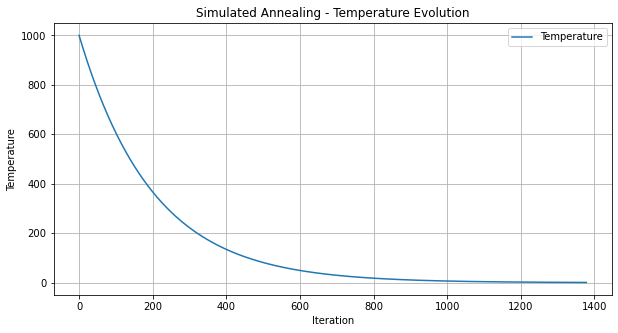

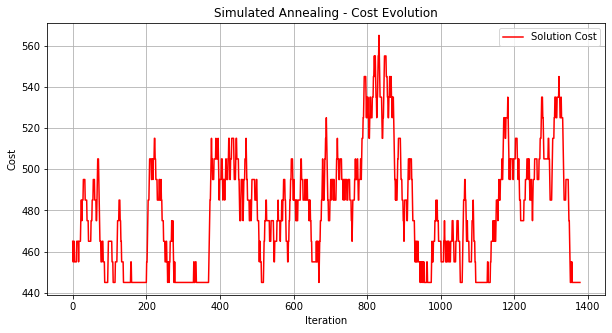

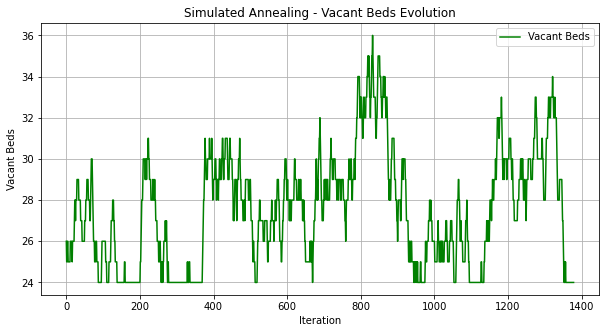

In [9]:
class SimulatedAnnealingSchedulerWithStats:
    def __init__(self, instance_data, initial_temp=1000, cooling_rate=0.995, min_temp=1):
        self.instance_data = instance_data
        self.temperature = initial_temp
        self.cooling_rate = cooling_rate
        self.min_temp = min_temp
        self.current_solution = self.generate_initial_solution()
        self.best_solution = self.current_solution.copy()

        # Statistics tracking
        self.temperature_history = []
        self.cost_history = []
        self.vacant_beds_history = []

    def generate_initial_solution(self):
        """Generate a random initial solution where patients are assigned to wards."""
        solution = {}
        wards = list(self.instance_data['wards'].keys())
        for patient in self.instance_data['patients']:
            assigned_ward = random.choice(wards)
            assigned_day = random.randint(self.instance_data['patients'][patient]['earliest_admission'],
                                          self.instance_data['patients'][patient]['latest_admission'])
            solution[patient] = {'ward': assigned_ward, 'day': assigned_day}
        return solution

    def calculate_cost(self, solution):
        """Evaluate the solution by computing a cost function."""
        cost = 0
        ward_loads = {ward: 0 for ward in self.instance_data['wards']}
        for patient, data in solution.items():
            ward_loads[data['ward']] += 1

        for ward, load in ward_loads.items():
            if load > self.instance_data['wards'][ward]['bed_capacity']:
                cost += (load - self.instance_data['wards'][ward]['bed_capacity']) * 10

        surgery_conflicts = 0
        scheduled_surgeries = {}
        for patient, data in solution.items():
            surgery_day = data['day']
            if surgery_day in scheduled_surgeries:
                scheduled_surgeries[surgery_day] += 1
            else:
                scheduled_surgeries[surgery_day] = 1

        for day, count in scheduled_surgeries.items():
            if count > len(self.instance_data['specializations']):
                surgery_conflicts += (count - len(self.instance_data['specializations'])) * 5

        cost += surgery_conflicts

        return cost

    def calculate_vacant_beds(self, solution):
        """Calculate the number of vacant beds in each ward."""
        ward_loads = {ward: 0 for ward in self.instance_data['wards']}
        for patient, data in solution.items():
            ward_loads[data['ward']] += 1

        vacant_beds = {ward: max(0, self.instance_data['wards'][ward]['bed_capacity'] - load)
                       for ward, load in ward_loads.items()}
        return sum(vacant_beds.values())

    def make_neighbor_solution(self):
        """Create a neighboring solution by randomly changing a patient's assignment."""
        new_solution = self.current_solution.copy()
        patient = random.choice(list(new_solution.keys()))
        new_solution[patient]['ward'] = random.choice(list(self.instance_data['wards'].keys()))
        new_solution[patient]['day'] = random.randint(self.instance_data['patients'][patient]['earliest_admission'],
                                                      self.instance_data['patients'][patient]['latest_admission'])
        return new_solution

    def run(self):
        """Run Simulated Annealing with statistics tracking."""
        while self.temperature > self.min_temp:
            new_solution = self.make_neighbor_solution()
            current_cost = self.calculate_cost(self.current_solution)
            new_cost = self.calculate_cost(new_solution)

            # Accept new solution if it's better or with probability based on temperature
            if new_cost < current_cost or random.uniform(0, 1) < math.exp((current_cost - new_cost) / self.temperature):
                self.current_solution = new_solution
                if new_cost < self.calculate_cost(self.best_solution):
                    self.best_solution = new_solution

            # Track statistics
            self.temperature_history.append(self.temperature)
            self.cost_history.append(new_cost)
            self.vacant_beds_history.append(self.calculate_vacant_beds(self.current_solution))

            # Cool down
            self.temperature *= self.cooling_rate

        return self.best_solution


# Run Simulated Annealing with statistics tracking
sa_scheduler_stats = SimulatedAnnealingSchedulerWithStats(instance_data)
best_schedule = sa_scheduler_stats.run()

# Prepare results for visualization
results_df = pd.DataFrame({
    "Temperature": sa_scheduler_stats.temperature_history,
    "Solution Cost": sa_scheduler_stats.cost_history,
    "Vacant Beds": sa_scheduler_stats.vacant_beds_history
})

print(df_results)
import matplotlib.pyplot as plt

# Plot Temperature Evolution
plt.figure(figsize=(10, 5))
plt.plot(sa_scheduler_stats.temperature_history, label="Temperature")
plt.xlabel("Iteration")
plt.ylabel("Temperature")
plt.title("Simulated Annealing - Temperature Evolution")
plt.legend()
plt.grid()
plt.show()

# Plot Cost Evolution
plt.figure(figsize=(10, 5))
plt.plot(sa_scheduler_stats.cost_history, label="Solution Cost", color='red')
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Simulated Annealing - Cost Evolution")
plt.legend()
plt.grid()
plt.show()

# Plot Vacant Beds Evolution
plt.figure(figsize=(10, 5))
plt.plot(sa_scheduler_stats.vacant_beds_history, label="Vacant Beds", color='green')
plt.xlabel("Iteration")
plt.ylabel("Vacant Beds")
plt.title("Simulated Annealing - Vacant Beds Evolution")
plt.legend()
plt.grid()
plt.show()


In [4]:
import os
import random
import math
import time
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------
# Step 1: Parsing the Instance Files
# -------------------------------

def parse_instance_file(filepath):
    """Parse a problem instance file and return the data as a structured dictionary."""
    with open(filepath, 'r') as file:
        lines = [line.strip() for line in file if line.strip()]

    instance_data = {}
    current_line = 0

    # Parse seed and minor specializations
    instance_data['seed'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['minor_specializations_per_ward'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse weights
    instance_data['weight_overtime'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['weight_undertime'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1
    instance_data['weight_delay'] = float(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse planning period
    instance_data['days'] = int(lines[current_line].split(":")[1].strip())
    current_line += 1

    # Parse specializations
    specialization_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    specializations = {}
    for _ in range(specialization_count):
        parts = lines[current_line].split()
        spec_id = parts[0]
        scaling_factor = float(parts[1])
        available_ot = [float(t) for t in parts[2].split(';')]
        specializations[spec_id] = {
            'scaling_factor': scaling_factor,
            'available_ot': available_ot
        }
        current_line += 1
    instance_data['specializations'] = specializations

    # Parse wards
    ward_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    wards = {}
    for _ in range(ward_count):
        parts = lines[current_line].split()
        ward_id = parts[0]
        bed_capacity = int(parts[1])
        workload_capacity = float(parts[2])
        major_spec = parts[3]
        minor_specs = [] if parts[4] == "NONE" else parts[4].split(',')
        carryover_patients = [int(x) for x in parts[5].split(';')]
        carryover_workload = [float(x) for x in parts[6].split(';')]
        wards[ward_id] = {
            'bed_capacity': bed_capacity,
            'workload_capacity': workload_capacity,
            'major_specialization': major_spec,
            'minor_specializations': minor_specs,
            'carryover_patients': carryover_patients,
            'carryover_workload': carryover_workload
        }
        current_line += 1
    instance_data['wards'] = wards

    # Parse patients
    patient_count = int(lines[current_line].split(":")[1].strip())
    current_line += 1
    patients = {}
    for _ in range(patient_count):
        parts = lines[current_line].split()
        patient_id = parts[0]
        spec = parts[1]
        earliest = int(parts[2])
        latest = int(parts[3])
        length_of_stay = int(parts[4])
        surgery_duration = int(parts[5])
        workload = [float(x) for x in parts[6].split(';')]
        patients[patient_id] = {
            'specialization': spec,
            'earliest_admission': earliest,
            'latest_admission': latest,
            'length_of_stay': length_of_stay,
            'surgery_duration': surgery_duration,
            'workload': workload
        }
        current_line += 1
    instance_data['patients'] = patients

    return instance_data


# -------------------------------
# Step 2: Simulated Annealing Setup com Estatísticas e Métricas
# -------------------------------

class SimulatedAnnealingScheduler:
    def __init__(self, instance_data, initial_temp=1000, cooling_rate=0.995, min_temp=1):
        self.instance_data = instance_data
        self.temperature = initial_temp
        self.cooling_rate = cooling_rate
        self.min_temp = min_temp
        self.current_solution = self.generate_initial_solution()
        self.best_solution = self.current_solution.copy()
        self.initial_cost = self.calculate_cost(self.current_solution)
        self.iterations = 0
        self.runtime = 0
        self.final_cost = None
        
        # Estatísticas para plotagem
        self.temperature_history = []
        self.cost_history = []

    def generate_initial_solution(self):
        """Gera uma solução inicial aleatória onde pacientes são alocados em wards."""
        solution = {}
        wards = list(self.instance_data['wards'].keys())
        for patient in self.instance_data['patients']:
            assigned_ward = random.choice(wards)
            assigned_day = random.randint(self.instance_data['patients'][patient]['earliest_admission'],
                                          self.instance_data['patients'][patient]['latest_admission'])
            solution[patient] = {'ward': assigned_ward, 'day': assigned_day}
        return solution

    def calculate_cost(self, solution):
        """Avalia a solução computando uma função de custo."""
        cost = 0
        # Penaliza sobrecarga em wards
        ward_loads = {ward: 0 for ward in self.instance_data['wards']}
        for patient, data in solution.items():
            ward_loads[data['ward']] += 1

        for ward, load in ward_loads.items():
            if load > self.instance_data['wards'][ward]['bed_capacity']:
                cost += (load - self.instance_data['wards'][ward]['bed_capacity']) * 10

        # Penaliza conflitos na agenda de cirurgias
        surgery_conflicts = 0
        scheduled_surgeries = {}
        for patient, data in solution.items():
            surgery_day = data['day']
            if surgery_day in scheduled_surgeries:
                scheduled_surgeries[surgery_day] += 1
            else:
                scheduled_surgeries[surgery_day] = 1

        for day, count in scheduled_surgeries.items():
            if count > len(self.instance_data['specializations']):
                surgery_conflicts += (count - len(self.instance_data['specializations'])) * 5

        cost += surgery_conflicts

        return cost

    def make_neighbor_solution(self):
        """Gera uma solução vizinha modificando aleatoriamente a alocação de um paciente."""
        new_solution = self.current_solution.copy()
        patient = random.choice(list(new_solution.keys()))
        new_solution[patient]['ward'] = random.choice(list(self.instance_data['wards'].keys()))
        new_solution[patient]['day'] = random.randint(
            self.instance_data['patients'][patient]['earliest_admission'],
            self.instance_data['patients'][patient]['latest_admission']
        )
        return new_solution

    def run(self):
        """Executa o Simulated Annealing para encontrar uma solução de escalonamento."""
        start_time = time.time()
        iteration_count = 0

        while self.temperature > self.min_temp:
            iteration_count += 1
            
            # Armazena estatísticas para plotagem
            self.temperature_history.append(self.temperature)
            self.cost_history.append(self.calculate_cost(self.current_solution))
            
            new_solution = self.make_neighbor_solution()
            current_cost = self.calculate_cost(self.current_solution)
            new_cost = self.calculate_cost(new_solution)

            # Aceita a nova solução se for melhor ou com probabilidade baseada na temperatura
            if new_cost < current_cost or random.uniform(0, 1) < math.exp((current_cost - new_cost) / self.temperature):
                self.current_solution = new_solution
                if new_cost < self.calculate_cost(self.best_solution):
                    self.best_solution = new_solution

            # Resfriamento
            self.temperature *= self.cooling_rate

        self.iterations = iteration_count
        self.runtime = time.time() - start_time
        self.final_cost = self.calculate_cost(self.best_solution)
        return self.best_solution


# -------------------------------
# Step 3: Executar SA para todas as instâncias, gerar plots e salvar resultados
# -------------------------------

instance_dir = "./data/instances"
schedule_results = []   # Para armazenar os DataFrames dos agendamentos
metrics_list = []       # Para armazenar as métricas de cada instância

# Certifica-se que o diretório base para imagens existe
images_base_dir = "./images"
if not os.path.exists(images_base_dir):
    os.makedirs(images_base_dir)

# Itera por todos os arquivos .dat no diretório de instâncias
for filename in os.listdir(instance_dir):
    if filename.endswith(".dat"):
        filepath = os.path.join(instance_dir, filename)
        print(f"Processando o arquivo de instância: {filename}")
        instance_data = parse_instance_file(filepath)
        sa_scheduler = SimulatedAnnealingScheduler(instance_data)
        best_schedule = sa_scheduler.run()

        # Converter a melhor solução para DataFrame e adicionar coluna com o nome da instância
        df_results = pd.DataFrame(best_schedule).T.reset_index()
        df_results.rename(columns={'index': 'patient'}, inplace=True)
        df_results['instance'] = filename
        schedule_results.append(df_results)

        # Cálculo da percentagem de pacientes alocados (aqui, todos são alocados)
        total_patients = len(instance_data['patients'])
        allocated = sum(1 for patient in best_schedule if best_schedule[patient]['ward'] is not None)
        pct_allocated = (allocated / total_patients) * 100
        pct_not_allocated = 100 - pct_allocated

        # Armazenar as métricas de eficiência
        instance_metrics = {
            "instance": filename,
            "iterations": sa_scheduler.iterations,
            "runtime_seconds": sa_scheduler.runtime,
            "initial_cost": sa_scheduler.initial_cost,
            "final_cost": sa_scheduler.final_cost,
            "improvement": sa_scheduler.initial_cost - sa_scheduler.final_cost,
            "pct_allocated": pct_allocated,
            "pct_not_allocated": pct_not_allocated
        }
        metrics_list.append(instance_metrics)

        # Cria diretório para os plots desta instância
        instance_name = os.path.splitext(filename)[0]
        instance_image_dir = os.path.join(images_base_dir, instance_name)
        if not os.path.exists(instance_image_dir):
            os.makedirs(instance_image_dir)

        # --- Gerar e salvar os plots ---
        # Plot da evolução da temperatura
        plt.figure(figsize=(10, 5))
        plt.plot(sa_scheduler.temperature_history, label="Temperature")
        plt.xlabel("Iteration")
        plt.ylabel("Temperature")
        plt.title(f"Temperature Evolution - {instance_name}")
        plt.legend()
        plt.grid()
        temperature_plot_path = os.path.join(instance_image_dir, "temperature_evolution.png")
        plt.savefig(temperature_plot_path)
        plt.close()

        # Plot da evolução do custo
        plt.figure(figsize=(10, 5))
        plt.plot(sa_scheduler.cost_history, label="Cost", color='red')
        plt.xlabel("Iteration")
        plt.ylabel("Cost")
        plt.title(f"Cost Evolution - {instance_name}")
        plt.legend()
        plt.grid()
        cost_plot_path = os.path.join(instance_image_dir, "cost_evolution.png")
        plt.savefig(cost_plot_path)
        plt.close()

        # Imprime resultados da instância atual
        print(df_results)
        print("\n" + "="*50 + "\n")

# Combina todos os DataFrames de agendamento em um único DataFrame e salva em CSV
all_schedules_df = pd.concat(schedule_results, ignore_index=True)
all_schedules_df.to_csv("best_schedules.csv", index=False)

# Converte a lista de métricas em DataFrame e salva em CSV
metrics_df = pd.DataFrame(metrics_list)
metrics_df.to_csv("metrics_results.csv", index=False)

print("Processamento concluído. Os resultados foram salvos em 'best_schedules.csv', 'metrics_results.csv' e os plots estão no diretório './images'.")


Processando o arquivo de instância: s0m0.dat
        patient ward day  instance
0      patient0  RHK   0  s0m0.dat
1      patient1  THO   3  s0m0.dat
2      patient2  THO   0  s0m0.dat
3      patient3  ABD   0  s0m0.dat
4      patient4  THO   1  s0m0.dat
..          ...  ...  ..       ...
112  patient112  THO   5  s0m0.dat
113  patient113  ABD   5  s0m0.dat
114  patient114  ABD   6  s0m0.dat
115  patient115  RHK   6  s0m0.dat
116  patient116  RHK   6  s0m0.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s0m1.dat
        patient ward day  instance
0      patient0  TRH   0  s0m1.dat
1      patient1  RHK   5  s0m1.dat
2      patient2  ABD   0  s0m1.dat
3      patient3  THO   0  s0m1.dat
4      patient4  ABD   1  s0m1.dat
..          ...  ...  ..       ...
112  patient112  ABD   6  s0m1.dat
113  patient113  ABD   5  s0m1.dat
114  patient114  ABD   6  s0m1.dat
115  patient115  RHK   6  s0m1.dat
116  patient116  THO   6  s0m1.dat

[117 rows x 4 columns]


Processando o arqu

      patient ward day    instance
0    patient0  ABD   0  s102m3.dat
1    patient1  NKO   0  s102m3.dat
2    patient2  TRA   0  s102m3.dat
3    patient3  TRA   1  s102m3.dat
4    patient4  NKO   2  s102m3.dat
..        ...  ...  ..         ...
68  patient68  NKO   6  s102m3.dat
69  patient69  ORT   6  s102m3.dat
70  patient70  NKO   6  s102m3.dat
71  patient71  ABD   6  s102m3.dat
72  patient72  TRA   6  s102m3.dat

[73 rows x 4 columns]


Processando o arquivo de instância: s103m0.dat
      patient ward day    instance
0    patient0  ONC   0  s103m0.dat
1    patient1  ONC   2  s103m0.dat
2    patient2  ONC   2  s103m0.dat
3    patient3  MKA   1  s103m0.dat
4    patient4  MKA   2  s103m0.dat
..        ...  ...  ..         ...
59  patient59  ORT   6  s103m0.dat
60  patient60  MKA   5  s103m0.dat
61  patient61  ONC   6  s103m0.dat
62  patient62  NKO   6  s103m0.dat
63  patient63  ORT   6  s103m0.dat

[64 rows x 4 columns]


Processando o arquivo de instância: s103m1.dat
      patient wa

      patient ward day    instance
0    patient0  VAT   3  s106m2.dat
1    patient1  ONC   0  s106m2.dat
2    patient2  ABD   1  s106m2.dat
3    patient3  VAT   1  s106m2.dat
4    patient4  ONC   1  s106m2.dat
..        ...  ...  ..         ...
80  patient80  VAT   5  s106m2.dat
81  patient81  VAT   6  s106m2.dat
82  patient82  VAT   6  s106m2.dat
83  patient83  ABD   6  s106m2.dat
84  patient84  ABD   6  s106m2.dat

[85 rows x 4 columns]


Processando o arquivo de instância: s106m3.dat
      patient ward day    instance
0    patient0  ABD   5  s106m3.dat
1    patient1  ONC   1  s106m3.dat
2    patient2  ABD   1  s106m3.dat
3    patient3  ABD   1  s106m3.dat
4    patient4  VAT   1  s106m3.dat
..        ...  ...  ..         ...
80  patient80  VAT   5  s106m3.dat
81  patient81  MKA   6  s106m3.dat
82  patient82  VAT   6  s106m3.dat
83  patient83  ONC   6  s106m3.dat
84  patient84  ABD   6  s106m3.dat

[85 rows x 4 columns]


Processando o arquivo de instância: s107m0.dat
        patient 

        patient ward day   instance
0      patient0  MKA   0  s10m1.dat
1      patient1  MKA   0  s10m1.dat
2      patient2  ONC   0  s10m1.dat
3      patient3  NCH   0  s10m1.dat
4      patient4  ONC   2  s10m1.dat
..          ...  ...  ..        ...
104  patient104  NCH   5  s10m1.dat
105  patient105  THO   6  s10m1.dat
106  patient106  ONC   6  s10m1.dat
107  patient107  THO   6  s10m1.dat
108  patient108  THO   6  s10m1.dat

[109 rows x 4 columns]


Processando o arquivo de instância: s10m2.dat
        patient ward day   instance
0      patient0  MKA   0  s10m2.dat
1      patient1  ONC   3  s10m2.dat
2      patient2  MKA   0  s10m2.dat
3      patient3  THO   0  s10m2.dat
4      patient4  THO   2  s10m2.dat
..          ...  ...  ..        ...
104  patient104  THO   5  s10m2.dat
105  patient105  THO   6  s10m2.dat
106  patient106  MKA   6  s10m2.dat
107  patient107  ONC   6  s10m2.dat
108  patient108  NCH   6  s10m2.dat

[109 rows x 4 columns]


Processando o arquivo de instância: s1

        patient ward day    instance
0      patient0  GYN   0  s113m0.dat
1      patient1  NCH   0  s113m0.dat
2      patient2  GYN   5  s113m0.dat
3      patient3  TRH   2  s113m0.dat
4      patient4  NCH   1  s113m0.dat
..          ...  ...  ..         ...
98    patient98  ORT   4  s113m0.dat
99    patient99  GYN   4  s113m0.dat
100  patient100  ORT   5  s113m0.dat
101  patient101  ORT   5  s113m0.dat
102  patient102  NCH   6  s113m0.dat

[103 rows x 4 columns]


Processando o arquivo de instância: s113m1.dat
        patient ward day    instance
0      patient0  TRH   0  s113m1.dat
1      patient1  NCH   0  s113m1.dat
2      patient2  TRH   6  s113m1.dat
3      patient3  ORT   1  s113m1.dat
4      patient4  ORT   2  s113m1.dat
..          ...  ...  ..         ...
98    patient98  TRH   4  s113m1.dat
99    patient99  NCH   4  s113m1.dat
100  patient100  ORT   5  s113m1.dat
101  patient101  NCH   5  s113m1.dat
102  patient102  TRH   6  s113m1.dat

[103 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  GYN   0  s116m3.dat
1    patient1  RHK   1  s116m3.dat
2    patient2  RHK   1  s116m3.dat
3    patient3  TRH   2  s116m3.dat
4    patient4  RHK   3  s116m3.dat
..        ...  ...  ..         ...
72  patient72  RHK   5  s116m3.dat
73  patient73  TRA   5  s116m3.dat
74  patient74  RHK   5  s116m3.dat
75  patient75  RHK   6  s116m3.dat
76  patient76  GYN   6  s116m3.dat

[77 rows x 4 columns]


Processando o arquivo de instância: s117m0.dat
        patient ward day    instance
0      patient0  THO   0  s117m0.dat
1      patient1  ONC   0  s117m0.dat
2      patient2  THO   0  s117m0.dat
3      patient3  VAT   0  s117m0.dat
4      patient4  GYN   0  s117m0.dat
..          ...  ...  ..         ...
107  patient107  ONC   5  s117m0.dat
108  patient108  GYN   5  s117m0.dat
109  patient109  ONC   6  s117m0.dat
110  patient110  ONC   6  s117m0.dat
111  patient111  THO   6  s117m0.dat

[112 rows x 4 columns]


Processando o arquivo de instância: s1

      patient ward day   instance
0    patient0  TRA   3  s11m2.dat
1    patient1  GYN   0  s11m2.dat
2    patient2  TRH   2  s11m2.dat
3    patient3  TRH   1  s11m2.dat
4    patient4  URO   1  s11m2.dat
..        ...  ...  ..        ...
94  patient94  TRH   3  s11m2.dat
95  patient95  URO   4  s11m2.dat
96  patient96  GYN   4  s11m2.dat
97  patient97  URO   4  s11m2.dat
98  patient98  URO   5  s11m2.dat

[99 rows x 4 columns]


Processando o arquivo de instância: s11m3.dat
      patient ward day   instance
0    patient0  TRH   0  s11m3.dat
1    patient1  GYN   2  s11m3.dat
2    patient2  TRA   3  s11m3.dat
3    patient3  TRA   1  s11m3.dat
4    patient4  TRA   1  s11m3.dat
..        ...  ...  ..        ...
94  patient94  GYN   3  s11m3.dat
95  patient95  TRH   4  s11m3.dat
96  patient96  GYN   4  s11m3.dat
97  patient97  TRH   4  s11m3.dat
98  patient98  TRH   5  s11m3.dat

[99 rows x 4 columns]


Processando o arquivo de instância: s120m0.dat
      patient ward day    instance
0    p

      patient ward day    instance
0    patient0  TRA   0  s123m2.dat
1    patient1  TRA   1  s123m2.dat
2    patient2  ONC   0  s123m2.dat
3    patient3  ORT   1  s123m2.dat
4    patient4  MKA   1  s123m2.dat
..        ...  ...  ..         ...
60  patient60  MKA   5  s123m2.dat
61  patient61  ONC   5  s123m2.dat
62  patient62  TRA   5  s123m2.dat
63  patient63  ORT   6  s123m2.dat
64  patient64  ORT   6  s123m2.dat

[65 rows x 4 columns]


Processando o arquivo de instância: s123m3.dat
      patient ward day    instance
0    patient0  TRA   0  s123m3.dat
1    patient1  TRA   1  s123m3.dat
2    patient2  ORT   0  s123m3.dat
3    patient3  ORT   0  s123m3.dat
4    patient4  ORT   3  s123m3.dat
..        ...  ...  ..         ...
60  patient60  MKA   4  s123m3.dat
61  patient61  TRA   5  s123m3.dat
62  patient62  TRA   5  s123m3.dat
63  patient63  ORT   6  s123m3.dat
64  patient64  ORT   6  s123m3.dat

[65 rows x 4 columns]


Processando o arquivo de instância: s124m0.dat
        patient 

      patient ward day    instance
0    patient0  NKO   2  s127m1.dat
1    patient1  VAT   0  s127m1.dat
2    patient2  THO   1  s127m1.dat
3    patient3  MKA   3  s127m1.dat
4    patient4  VAT   0  s127m1.dat
..        ...  ...  ..         ...
74  patient74  VAT   5  s127m1.dat
75  patient75  THO   6  s127m1.dat
76  patient76  THO   6  s127m1.dat
77  patient77  MKA   6  s127m1.dat
78  patient78  MKA   6  s127m1.dat

[79 rows x 4 columns]


Processando o arquivo de instância: s127m2.dat
      patient ward day    instance
0    patient0  NKO   3  s127m2.dat
1    patient1  NKO   0  s127m2.dat
2    patient2  VAT   3  s127m2.dat
3    patient3  VAT   2  s127m2.dat
4    patient4  THO   0  s127m2.dat
..        ...  ...  ..         ...
74  patient74  THO   5  s127m2.dat
75  patient75  NKO   6  s127m2.dat
76  patient76  NKO   6  s127m2.dat
77  patient77  NKO   6  s127m2.dat
78  patient78  NKO   6  s127m2.dat

[79 rows x 4 columns]


Processando o arquivo de instância: s127m3.dat
      patient wa

      patient ward day    instance
0    patient0  ABD   2  s130m0.dat
1    patient1  ABD   0  s130m0.dat
2    patient2  NKO   1  s130m0.dat
3    patient3  MKA   2  s130m0.dat
4    patient4  THO   2  s130m0.dat
..        ...  ...  ..         ...
76  patient76  MKA   5  s130m0.dat
77  patient77  THO   6  s130m0.dat
78  patient78  MKA   6  s130m0.dat
79  patient79  NKO   6  s130m0.dat
80  patient80  NKO   6  s130m0.dat

[81 rows x 4 columns]


Processando o arquivo de instância: s130m1.dat
      patient ward day    instance
0    patient0  NKO   0  s130m1.dat
1    patient1  NKO   0  s130m1.dat
2    patient2  THO   1  s130m1.dat
3    patient3  MKA   2  s130m1.dat
4    patient4  MKA   2  s130m1.dat
..        ...  ...  ..         ...
76  patient76  NKO   5  s130m1.dat
77  patient77  NKO   6  s130m1.dat
78  patient78  THO   6  s130m1.dat
79  patient79  MKA   6  s130m1.dat
80  patient80  ABD   6  s130m1.dat

[81 rows x 4 columns]


Processando o arquivo de instância: s130m2.dat
      patient wa

        patient ward day    instance
0      patient0  MKA   0  s133m3.dat
1      patient1  THO   3  s133m3.dat
2      patient2  THO   0  s133m3.dat
3      patient3  URO   0  s133m3.dat
4      patient4  GYN   0  s133m3.dat
..          ...  ...  ..         ...
116  patient116  URO   5  s133m3.dat
117  patient117  MKA   6  s133m3.dat
118  patient118  GYN   6  s133m3.dat
119  patient119  GYN   6  s133m3.dat
120  patient120  URO   6  s133m3.dat

[121 rows x 4 columns]


Processando o arquivo de instância: s134m0.dat
      patient ward day    instance
0    patient0  RHK   0  s134m0.dat
1    patient1  MKA   3  s134m0.dat
2    patient2  VAT   1  s134m0.dat
3    patient3  RHK   6  s134m0.dat
4    patient4  TRA   2  s134m0.dat
..        ...  ...  ..         ...
61  patient61  MKA   5  s134m0.dat
62  patient62  VAT   5  s134m0.dat
63  patient63  TRA   6  s134m0.dat
64  patient64  TRA   5  s134m0.dat
65  patient65  TRA   6  s134m0.dat

[66 rows x 4 columns]


Processando o arquivo de instância: s1

        patient ward day    instance
0      patient0  URO   0  s137m2.dat
1      patient1  MKA   1  s137m2.dat
2      patient2  MKA   2  s137m2.dat
3      patient3  TRH   2  s137m2.dat
4      patient4  TRH   2  s137m2.dat
..          ...  ...  ..         ...
96    patient96  MKA   6  s137m2.dat
97    patient97  TRA   6  s137m2.dat
98    patient98  URO   6  s137m2.dat
99    patient99  URO   6  s137m2.dat
100  patient100  URO   6  s137m2.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s137m3.dat
        patient ward day    instance
0      patient0  TRH   0  s137m3.dat
1      patient1  TRA   1  s137m3.dat
2      patient2  URO   2  s137m3.dat
3      patient3  URO   2  s137m3.dat
4      patient4  URO   2  s137m3.dat
..          ...  ...  ..         ...
96    patient96  MKA   6  s137m3.dat
97    patient97  MKA   6  s137m3.dat
98    patient98  MKA   6  s137m3.dat
99    patient99  URO   6  s137m3.dat
100  patient100  URO   6  s137m3.dat

[101 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ONC   1  s140m1.dat
1    patient1  THO   2  s140m1.dat
2    patient2  TRA   2  s140m1.dat
3    patient3  ORT   2  s140m1.dat
4    patient4  ONC   2  s140m1.dat
..        ...  ...  ..         ...
70  patient70  ONC   6  s140m1.dat
71  patient71  ORT   6  s140m1.dat
72  patient72  THO   6  s140m1.dat
73  patient73  ORT   6  s140m1.dat
74  patient74  ORT   6  s140m1.dat

[75 rows x 4 columns]


Processando o arquivo de instância: s140m2.dat
      patient ward day    instance
0    patient0  THO   1  s140m2.dat
1    patient1  TRA   2  s140m2.dat
2    patient2  TRA   2  s140m2.dat
3    patient3  ONC   2  s140m2.dat
4    patient4  TRA   2  s140m2.dat
..        ...  ...  ..         ...
70  patient70  ORT   6  s140m2.dat
71  patient71  TRA   6  s140m2.dat
72  patient72  TRA   6  s140m2.dat
73  patient73  TRA   6  s140m2.dat
74  patient74  ONC   6  s140m2.dat

[75 rows x 4 columns]


Processando o arquivo de instância: s140m3.dat
      patient wa

        patient ward day    instance
0      patient0  TRH   0  s144m0.dat
1      patient1  ONC   1  s144m0.dat
2      patient2  GYN   1  s144m0.dat
3      patient3  ONC   1  s144m0.dat
4      patient4  ONC   5  s144m0.dat
..          ...  ...  ..         ...
105  patient105  ONC   6  s144m0.dat
106  patient106  URO   6  s144m0.dat
107  patient107  ONC   6  s144m0.dat
108  patient108  GYN   6  s144m0.dat
109  patient109  URO   6  s144m0.dat

[110 rows x 4 columns]


Processando o arquivo de instância: s144m1.dat
        patient ward day    instance
0      patient0  URO   0  s144m1.dat
1      patient1  URO   6  s144m1.dat
2      patient2  GYN   1  s144m1.dat
3      patient3  TRH   4  s144m1.dat
4      patient4  GYN   3  s144m1.dat
..          ...  ...  ..         ...
105  patient105  ONC   6  s144m1.dat
106  patient106  URO   6  s144m1.dat
107  patient107  GYN   6  s144m1.dat
108  patient108  GYN   6  s144m1.dat
109  patient109  GYN   6  s144m1.dat

[110 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  THO   0  s147m3.dat
1      patient1  RHK   0  s147m3.dat
2      patient2  RHK   0  s147m3.dat
3      patient3  ONC   0  s147m3.dat
4      patient4  ONC   1  s147m3.dat
..          ...  ...  ..         ...
108  patient108  RHK   5  s147m3.dat
109  patient109  THO   6  s147m3.dat
110  patient110  THO   6  s147m3.dat
111  patient111  THO   6  s147m3.dat
112  patient112  THO   6  s147m3.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s148m0.dat
        patient ward day    instance
0      patient0  RHK   0  s148m0.dat
1      patient1  GYN   0  s148m0.dat
2      patient2  RHK   3  s148m0.dat
3      patient3  GYN   2  s148m0.dat
4      patient4  RHK   4  s148m0.dat
..          ...  ...  ..         ...
108  patient108  RHK   6  s148m0.dat
109  patient109  RHK   6  s148m0.dat
110  patient110  RHK   5  s148m0.dat
111  patient111  NKO   6  s148m0.dat
112  patient112  GYN   6  s148m0.dat

[113 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ORT   0  s150m2.dat
1    patient1  NKO   1  s150m2.dat
2    patient2  GYN   3  s150m2.dat
3    patient3  GYN   3  s150m2.dat
4    patient4  NKO   4  s150m2.dat
..        ...  ...  ..         ...
71  patient71  URO   5  s150m2.dat
72  patient72  URO   6  s150m2.dat
73  patient73  ORT   6  s150m2.dat
74  patient74  GYN   6  s150m2.dat
75  patient75  NKO   6  s150m2.dat

[76 rows x 4 columns]


Processando o arquivo de instância: s150m3.dat
      patient ward day    instance
0    patient0  NKO   0  s150m3.dat
1    patient1  URO   2  s150m3.dat
2    patient2  NKO   3  s150m3.dat
3    patient3  GYN   3  s150m3.dat
4    patient4  ORT   3  s150m3.dat
..        ...  ...  ..         ...
71  patient71  URO   5  s150m3.dat
72  patient72  GYN   6  s150m3.dat
73  patient73  GYN   6  s150m3.dat
74  patient74  ORT   6  s150m3.dat
75  patient75  GYN   6  s150m3.dat

[76 rows x 4 columns]


Processando o arquivo de instância: s151m0.dat
      patient wa

        patient ward day    instance
0      patient0  THO   2  s154m2.dat
1      patient1  NCH   4  s154m2.dat
2      patient2  ONC   4  s154m2.dat
3      patient3  ONC   2  s154m2.dat
4      patient4  RHK   2  s154m2.dat
..          ...  ...  ..         ...
102  patient102  ONC   5  s154m2.dat
103  patient103  NCH   6  s154m2.dat
104  patient104  ONC   6  s154m2.dat
105  patient105  NCH   6  s154m2.dat
106  patient106  ONC   6  s154m2.dat

[107 rows x 4 columns]


Processando o arquivo de instância: s154m3.dat
        patient ward day    instance
0      patient0  ONC   1  s154m3.dat
1      patient1  NCH   5  s154m3.dat
2      patient2  ONC   1  s154m3.dat
3      patient3  RHK   5  s154m3.dat
4      patient4  NCH   3  s154m3.dat
..          ...  ...  ..         ...
102  patient102  ONC   5  s154m3.dat
103  patient103  ONC   6  s154m3.dat
104  patient104  THO   6  s154m3.dat
105  patient105  NCH   6  s154m3.dat
106  patient106  THO   6  s154m3.dat

[107 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  ORT   0  s156m0.dat
1      patient1  TRA   2  s156m0.dat
2      patient2  TRA   2  s156m0.dat
3      patient3  URO   3  s156m0.dat
4      patient4  URO   4  s156m0.dat
..          ...  ...  ..         ...
98    patient98  ORT   5  s156m0.dat
99    patient99  TRA   6  s156m0.dat
100  patient100  URO   6  s156m0.dat
101  patient101  ORT   6  s156m0.dat
102  patient102  NKO   6  s156m0.dat

[103 rows x 4 columns]


Processando o arquivo de instância: s156m1.dat
        patient ward day    instance
0      patient0  URO   0  s156m1.dat
1      patient1  NKO   2  s156m1.dat
2      patient2  ORT   2  s156m1.dat
3      patient3  TRA   3  s156m1.dat
4      patient4  TRA   4  s156m1.dat
..          ...  ...  ..         ...
98    patient98  TRA   5  s156m1.dat
99    patient99  NKO   6  s156m1.dat
100  patient100  ORT   6  s156m1.dat
101  patient101  ORT   6  s156m1.dat
102  patient102  URO   6  s156m1.dat

[103 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  NKO   0  s159m3.dat
1      patient1  ORT   1  s159m3.dat
2      patient2  NKO   1  s159m3.dat
3      patient3  VAT   1  s159m3.dat
4      patient4  VAT   3  s159m3.dat
..          ...  ...  ..         ...
109  patient109  URO   5  s159m3.dat
110  patient110  VAT   5  s159m3.dat
111  patient111  NKO   6  s159m3.dat
112  patient112  URO   6  s159m3.dat
113  patient113  NKO   6  s159m3.dat

[114 rows x 4 columns]


Processando o arquivo de instância: s15m0.dat
      patient ward day   instance
0    patient0  TRA   0  s15m0.dat
1    patient1  NCH   0  s15m0.dat
2    patient2  GYN   0  s15m0.dat
3    patient3  GYN   0  s15m0.dat
4    patient4  ABD   1  s15m0.dat
..        ...  ...  ..        ...
90  patient90  GYN   5  s15m0.dat
91  patient91  GYN   6  s15m0.dat
92  patient92  NCH   6  s15m0.dat
93  patient93  NCH   6  s15m0.dat
94  patient94  TRA   6  s15m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s15m1.dat
     

      patient ward day    instance
0    patient0  GYN   0  s162m2.dat
1    patient1  RHK   0  s162m2.dat
2    patient2  GYN   0  s162m2.dat
3    patient3  VAT   1  s162m2.dat
4    patient4  NCH   1  s162m2.dat
..        ...  ...  ..         ...
80  patient80  VAT   5  s162m2.dat
81  patient81  GYN   5  s162m2.dat
82  patient82  NCH   6  s162m2.dat
83  patient83  GYN   6  s162m2.dat
84  patient84  NCH   6  s162m2.dat

[85 rows x 4 columns]


Processando o arquivo de instância: s162m3.dat
      patient ward day    instance
0    patient0  GYN   0  s162m3.dat
1    patient1  GYN   0  s162m3.dat
2    patient2  GYN   4  s162m3.dat
3    patient3  GYN   1  s162m3.dat
4    patient4  VAT   1  s162m3.dat
..        ...  ...  ..         ...
80  patient80  VAT   5  s162m3.dat
81  patient81  GYN   5  s162m3.dat
82  patient82  VAT   6  s162m3.dat
83  patient83  GYN   6  s162m3.dat
84  patient84  VAT   6  s162m3.dat

[85 rows x 4 columns]


Processando o arquivo de instância: s163m0.dat
        patient 

        patient ward day    instance
0      patient0  ONC   0  s166m1.dat
1      patient1  URO   0  s166m1.dat
2      patient2  MKA   0  s166m1.dat
3      patient3  TRH   4  s166m1.dat
4      patient4  ONC   0  s166m1.dat
..          ...  ...  ..         ...
117  patient117  MKA   6  s166m1.dat
118  patient118  TRH   6  s166m1.dat
119  patient119  MKA   6  s166m1.dat
120  patient120  URO   6  s166m1.dat
121  patient121  TRH   6  s166m1.dat

[122 rows x 4 columns]


Processando o arquivo de instância: s166m2.dat
        patient ward day    instance
0      patient0  MKA   0  s166m2.dat
1      patient1  URO   3  s166m2.dat
2      patient2  ONC   0  s166m2.dat
3      patient3  ONC   1  s166m2.dat
4      patient4  URO   1  s166m2.dat
..          ...  ...  ..         ...
117  patient117  URO   6  s166m2.dat
118  patient118  ONC   6  s166m2.dat
119  patient119  MKA   6  s166m2.dat
120  patient120  URO   6  s166m2.dat
121  patient121  URO   6  s166m2.dat

[122 rows x 4 columns]


Processando o

      patient ward day   instance
0    patient0  NCH   5  s16m0.dat
1    patient1  NCH   1  s16m0.dat
2    patient2  ONC   2  s16m0.dat
3    patient3  NKO   2  s16m0.dat
4    patient4  NCH   3  s16m0.dat
..        ...  ...  ..        ...
92  patient92  ONC   5  s16m0.dat
93  patient93  NKO   5  s16m0.dat
94  patient94  NCH   5  s16m0.dat
95  patient95  ORT   6  s16m0.dat
96  patient96  NCH   6  s16m0.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s16m1.dat
      patient ward day   instance
0    patient0  ONC   5  s16m1.dat
1    patient1  NCH   1  s16m1.dat
2    patient2  ONC   2  s16m1.dat
3    patient3  NCH   2  s16m1.dat
4    patient4  NCH   3  s16m1.dat
..        ...  ...  ..        ...
92  patient92  NKO   5  s16m1.dat
93  patient93  NCH   5  s16m1.dat
94  patient94  NCH   5  s16m1.dat
95  patient95  NKO   6  s16m1.dat
96  patient96  NCH   6  s16m1.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s16m2.dat
      patient ward day   instance
0    pat

      patient ward day    instance
0    patient0  MKA   2  s172m1.dat
1    patient1  MKA   0  s172m1.dat
2    patient2  NCH   1  s172m1.dat
3    patient3  GYN   1  s172m1.dat
4    patient4  GYN   3  s172m1.dat
5    patient5  GYN   4  s172m1.dat
6    patient6  NCH   4  s172m1.dat
7    patient7  NCH   5  s172m1.dat
8    patient8  GYN   5  s172m1.dat
9    patient9  GYN   6  s172m1.dat
10  patient10  NKO   6  s172m1.dat
11  patient11  NCH   6  s172m1.dat
12  patient12  NKO   1  s172m1.dat
13  patient13  MKA   1  s172m1.dat
14  patient14  NCH   2  s172m1.dat
15  patient15  NCH   4  s172m1.dat
16  patient16  MKA   6  s172m1.dat
17  patient17  MKA   5  s172m1.dat
18  patient18  MKA   6  s172m1.dat
19  patient19  NCH   6  s172m1.dat
20  patient20  NKO   0  s172m1.dat
21  patient21  NCH   0  s172m1.dat
22  patient22  NKO   3  s172m1.dat
23  patient23  GYN   0  s172m1.dat
24  patient24  GYN   1  s172m1.dat
25  patient25  NCH   3  s172m1.dat
26  patient26  GYN   2  s172m1.dat
27  patient27  NCH  

      patient ward day    instance
0    patient0  TRA   3  s174m0.dat
1    patient1  ONC   0  s174m0.dat
2    patient2  THO   2  s174m0.dat
3    patient3  TRA   1  s174m0.dat
4    patient4  NKO   1  s174m0.dat
..        ...  ...  ..         ...
91  patient91  ONC   6  s174m0.dat
92  patient92  THO   6  s174m0.dat
93  patient93  THO   6  s174m0.dat
94  patient94  ONC   6  s174m0.dat
95  patient95  ONC   6  s174m0.dat

[96 rows x 4 columns]


Processando o arquivo de instância: s174m1.dat
      patient ward day    instance
0    patient0  NKO   3  s174m1.dat
1    patient1  NKO   0  s174m1.dat
2    patient2  TRA   2  s174m1.dat
3    patient3  THO   1  s174m1.dat
4    patient4  NKO   1  s174m1.dat
..        ...  ...  ..         ...
91  patient91  NKO   6  s174m1.dat
92  patient92  ONC   6  s174m1.dat
93  patient93  NKO   6  s174m1.dat
94  patient94  TRA   6  s174m1.dat
95  patient95  NKO   6  s174m1.dat

[96 rows x 4 columns]


Processando o arquivo de instância: s174m2.dat
      patient wa

      patient ward day    instance
0    patient0  ONC   0  s178m0.dat
1    patient1  TRA   0  s178m0.dat
2    patient2  ONC   2  s178m0.dat
3    patient3  NKO   1  s178m0.dat
4    patient4  URO   3  s178m0.dat
..        ...  ...  ..         ...
90  patient90  TRA   2  s178m0.dat
91  patient91  TRA   3  s178m0.dat
92  patient92  NKO   3  s178m0.dat
93  patient93  ONC   6  s178m0.dat
94  patient94  URO   6  s178m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s178m1.dat
      patient ward day    instance
0    patient0  NKO   0  s178m1.dat
1    patient1  NKO   0  s178m1.dat
2    patient2  TRA   1  s178m1.dat
3    patient3  URO   0  s178m1.dat
4    patient4  URO   2  s178m1.dat
..        ...  ...  ..         ...
90  patient90  URO   2  s178m1.dat
91  patient91  NKO   3  s178m1.dat
92  patient92  TRA   3  s178m1.dat
93  patient93  NKO   6  s178m1.dat
94  patient94  ONC   6  s178m1.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s178m2.dat
      patient wa

      patient ward day   instance
0    patient0  MKA   0  s17m2.dat
1    patient1  TRA   1  s17m2.dat
2    patient2  GYN   2  s17m2.dat
3    patient3  MKA   4  s17m2.dat
4    patient4  TRA   2  s17m2.dat
5    patient5  RHK   3  s17m2.dat
6    patient6  TRA   3  s17m2.dat
7    patient7  TRA   5  s17m2.dat
8    patient8  RHK   4  s17m2.dat
9    patient9  MKA   5  s17m2.dat
10  patient10  RHK   0  s17m2.dat
11  patient11  GYN   1  s17m2.dat
12  patient12  MKA   0  s17m2.dat
13  patient13  RHK   2  s17m2.dat
14  patient14  TRA   1  s17m2.dat
15  patient15  TRA   4  s17m2.dat
16  patient16  GYN   2  s17m2.dat
17  patient17  RHK   2  s17m2.dat
18  patient18  GYN   5  s17m2.dat
19  patient19  TRA   3  s17m2.dat
20  patient20  MKA   4  s17m2.dat
21  patient21  MKA   5  s17m2.dat
22  patient22  GYN   5  s17m2.dat
23  patient23  GYN   5  s17m2.dat
24  patient24  RHK   5  s17m2.dat
25  patient25  RHK   5  s17m2.dat
26  patient26  MKA   6  s17m2.dat
27  patient27  RHK   0  s17m2.dat
28  patient28 

        patient ward day    instance
0      patient0  ONC   2  s181m3.dat
1      patient1  GYN   2  s181m3.dat
2      patient2  NKO   3  s181m3.dat
3      patient3  URO   2  s181m3.dat
4      patient4  URO   2  s181m3.dat
..          ...  ...  ..         ...
108  patient108  ONC   5  s181m3.dat
109  patient109  ONC   5  s181m3.dat
110  patient110  GYN   5  s181m3.dat
111  patient111  NKO   6  s181m3.dat
112  patient112  NKO   6  s181m3.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s182m0.dat
        patient ward day    instance
0      patient0  NKO   1  s182m0.dat
1      patient1  NKO   0  s182m0.dat
2      patient2  URO   0  s182m0.dat
3      patient3  NKO   1  s182m0.dat
4      patient4  NCH   1  s182m0.dat
..          ...  ...  ..         ...
121  patient121  NCH   6  s182m0.dat
122  patient122  ABD   6  s182m0.dat
123  patient123  ABD   6  s182m0.dat
124  patient124  NCH   6  s182m0.dat
125  patient125  ABD   6  s182m0.dat

[126 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  ORT   0  s185m2.dat
1      patient1  ORT   0  s185m2.dat
2      patient2  ORT   0  s185m2.dat
3      patient3  VAT   2  s185m2.dat
4      patient4  ORT   2  s185m2.dat
..          ...  ...  ..         ...
103  patient103  URO   6  s185m2.dat
104  patient104  VAT   6  s185m2.dat
105  patient105  MKA   6  s185m2.dat
106  patient106  VAT   6  s185m2.dat
107  patient107  MKA   6  s185m2.dat

[108 rows x 4 columns]


Processando o arquivo de instância: s185m3.dat
        patient ward day    instance
0      patient0  MKA   0  s185m3.dat
1      patient1  ORT   0  s185m3.dat
2      patient2  VAT   0  s185m3.dat
3      patient3  ORT   2  s185m3.dat
4      patient4  VAT   2  s185m3.dat
..          ...  ...  ..         ...
103  patient103  MKA   6  s185m3.dat
104  patient104  MKA   6  s185m3.dat
105  patient105  VAT   6  s185m3.dat
106  patient106  VAT   6  s185m3.dat
107  patient107  MKA   6  s185m3.dat

[108 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ONC   0  s189m1.dat
1    patient1  MKA   0  s189m1.dat
2    patient2  RHK   3  s189m1.dat
3    patient3  MKA   2  s189m1.dat
4    patient4  MKA   1  s189m1.dat
..        ...  ...  ..         ...
66  patient66  NKO   4  s189m1.dat
67  patient67  NKO   5  s189m1.dat
68  patient68  NKO   5  s189m1.dat
69  patient69  RHK   6  s189m1.dat
70  patient70  RHK   6  s189m1.dat

[71 rows x 4 columns]


Processando o arquivo de instância: s189m2.dat
      patient ward day    instance
0    patient0  ONC   0  s189m2.dat
1    patient1  MKA   0  s189m2.dat
2    patient2  MKA   3  s189m2.dat
3    patient3  NKO   4  s189m2.dat
4    patient4  NKO   1  s189m2.dat
..        ...  ...  ..         ...
66  patient66  MKA   4  s189m2.dat
67  patient67  RHK   5  s189m2.dat
68  patient68  NKO   5  s189m2.dat
69  patient69  RHK   6  s189m2.dat
70  patient70  NKO   6  s189m2.dat

[71 rows x 4 columns]


Processando o arquivo de instância: s189m3.dat
      patient wa

        patient ward day    instance
0      patient0  URO   1  s192m0.dat
1      patient1  TRH   0  s192m0.dat
2      patient2  ONC   0  s192m0.dat
3      patient3  ONC   0  s192m0.dat
4      patient4  RHK   1  s192m0.dat
..          ...  ...  ..         ...
111  patient111  TRH   4  s192m0.dat
112  patient112  TRH   4  s192m0.dat
113  patient113  ONC   4  s192m0.dat
114  patient114  ONC   4  s192m0.dat
115  patient115  TRH   5  s192m0.dat

[116 rows x 4 columns]


Processando o arquivo de instância: s192m1.dat
        patient ward day    instance
0      patient0  RHK   0  s192m1.dat
1      patient1  URO   1  s192m1.dat
2      patient2  RHK   0  s192m1.dat
3      patient3  ONC   0  s192m1.dat
4      patient4  ONC   1  s192m1.dat
..          ...  ...  ..         ...
111  patient111  TRH   4  s192m1.dat
112  patient112  TRH   4  s192m1.dat
113  patient113  TRH   4  s192m1.dat
114  patient114  TRH   4  s192m1.dat
115  patient115  ONC   5  s192m1.dat

[116 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  ONC   0  s195m3.dat
1      patient1  URO   0  s195m3.dat
2      patient2  URO   1  s195m3.dat
3      patient3  ABD   2  s195m3.dat
4      patient4  VAT   1  s195m3.dat
..          ...  ...  ..         ...
144  patient144  URO   5  s195m3.dat
145  patient145  VAT   5  s195m3.dat
146  patient146  ONC   6  s195m3.dat
147  patient147  ONC   6  s195m3.dat
148  patient148  VAT   6  s195m3.dat

[149 rows x 4 columns]


Processando o arquivo de instância: s196m0.dat
      patient ward day    instance
0    patient0  GYN   0  s196m0.dat
1    patient1  ABD   1  s196m0.dat
2    patient2  GYN   4  s196m0.dat
3    patient3  GYN   3  s196m0.dat
4    patient4  ABD   4  s196m0.dat
..        ...  ...  ..         ...
67  patient67  ABD   6  s196m0.dat
68  patient68  NKO   6  s196m0.dat
69  patient69  GYN   6  s196m0.dat
70  patient70  TRA   6  s196m0.dat
71  patient71  NKO   6  s196m0.dat

[72 rows x 4 columns]


Processando o arquivo de instância: s1

      patient ward day    instance
0    patient0  GYN   0  s199m2.dat
1    patient1  NCH   0  s199m2.dat
2    patient2  NKO   0  s199m2.dat
3    patient3  TRA   0  s199m2.dat
4    patient4  GYN   2  s199m2.dat
..        ...  ...  ..         ...
71  patient71  TRA   5  s199m2.dat
72  patient72  NCH   6  s199m2.dat
73  patient73  NKO   6  s199m2.dat
74  patient74  TRA   6  s199m2.dat
75  patient75  GYN   6  s199m2.dat

[76 rows x 4 columns]


Processando o arquivo de instância: s199m3.dat
      patient ward day    instance
0    patient0  GYN   0  s199m3.dat
1    patient1  NKO   0  s199m3.dat
2    patient2  TRA   1  s199m3.dat
3    patient3  NCH   0  s199m3.dat
4    patient4  NKO   2  s199m3.dat
..        ...  ...  ..         ...
71  patient71  NCH   5  s199m3.dat
72  patient72  GYN   6  s199m3.dat
73  patient73  TRA   6  s199m3.dat
74  patient74  GYN   6  s199m3.dat
75  patient75  TRA   6  s199m3.dat

[76 rows x 4 columns]


Processando o arquivo de instância: s19m0.dat
      patient war

      patient ward day    instance
0    patient0  NKO   0  s201m2.dat
1    patient1  NKO   0  s201m2.dat
2    patient2  NKO   0  s201m2.dat
3    patient3  ONC   1  s201m2.dat
4    patient4  ORT   3  s201m2.dat
..        ...  ...  ..         ...
92  patient92  ORT   5  s201m2.dat
93  patient93  ONC   5  s201m2.dat
94  patient94  ONC   5  s201m2.dat
95  patient95  NKO   6  s201m2.dat
96  patient96  ORT   6  s201m2.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s201m3.dat
      patient ward day    instance
0    patient0  THO   0  s201m3.dat
1    patient1  ONC   0  s201m3.dat
2    patient2  THO   0  s201m3.dat
3    patient3  ORT   1  s201m3.dat
4    patient4  ORT   1  s201m3.dat
..        ...  ...  ..         ...
92  patient92  NKO   5  s201m3.dat
93  patient93  ONC   5  s201m3.dat
94  patient94  THO   5  s201m3.dat
95  patient95  ORT   6  s201m3.dat
96  patient96  ORT   6  s201m3.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s202m0.dat
      patient wa

        patient ward day    instance
0      patient0  VAT   4  s205m2.dat
1      patient1  URO   0  s205m2.dat
2      patient2  VAT   1  s205m2.dat
3      patient3  GYN   2  s205m2.dat
4      patient4  GYN   3  s205m2.dat
..          ...  ...  ..         ...
117  patient117  VAT   6  s205m2.dat
118  patient118  GYN   6  s205m2.dat
119  patient119  VAT   6  s205m2.dat
120  patient120  GYN   6  s205m2.dat
121  patient121  GYN   6  s205m2.dat

[122 rows x 4 columns]


Processando o arquivo de instância: s205m3.dat
        patient ward day    instance
0      patient0  RHK   4  s205m3.dat
1      patient1  URO   0  s205m3.dat
2      patient2  URO   0  s205m3.dat
3      patient3  URO   2  s205m3.dat
4      patient4  GYN   3  s205m3.dat
..          ...  ...  ..         ...
117  patient117  URO   6  s205m3.dat
118  patient118  URO   6  s205m3.dat
119  patient119  VAT   6  s205m3.dat
120  patient120  GYN   6  s205m3.dat
121  patient121  URO   6  s205m3.dat

[122 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  TRA   1  s209m1.dat
1    patient1  TRH   0  s209m1.dat
2    patient2  TRH   0  s209m1.dat
3    patient3  TRA   1  s209m1.dat
4    patient4  GYN   2  s209m1.dat
..        ...  ...  ..         ...
65  patient65  TRH   3  s209m1.dat
66  patient66  ORT   4  s209m1.dat
67  patient67  GYN   4  s209m1.dat
68  patient68  ORT   5  s209m1.dat
69  patient69  GYN   6  s209m1.dat

[70 rows x 4 columns]


Processando o arquivo de instância: s209m2.dat
      patient ward day    instance
0    patient0  TRA   3  s209m2.dat
1    patient1  GYN   0  s209m2.dat
2    patient2  TRH   0  s209m2.dat
3    patient3  TRA   3  s209m2.dat
4    patient4  TRA   1  s209m2.dat
..        ...  ...  ..         ...
65  patient65  GYN   3  s209m2.dat
66  patient66  TRA   4  s209m2.dat
67  patient67  TRA   4  s209m2.dat
68  patient68  TRH   5  s209m2.dat
69  patient69  ORT   6  s209m2.dat

[70 rows x 4 columns]


Processando o arquivo de instância: s209m3.dat
      patient wa

        patient ward day    instance
0      patient0  ABD   0  s212m0.dat
1      patient1  NCH   0  s212m0.dat
2      patient2  NCH   0  s212m0.dat
3      patient3  VAT   0  s212m0.dat
4      patient4  NCH   2  s212m0.dat
..          ...  ...  ..         ...
108  patient108  MKA   5  s212m0.dat
109  patient109  NCH   6  s212m0.dat
110  patient110  MKA   6  s212m0.dat
111  patient111  MKA   6  s212m0.dat
112  patient112  VAT   6  s212m0.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s212m1.dat
        patient ward day    instance
0      patient0  VAT   0  s212m1.dat
1      patient1  MKA   3  s212m1.dat
2      patient2  VAT   0  s212m1.dat
3      patient3  ABD   0  s212m1.dat
4      patient4  MKA   1  s212m1.dat
..          ...  ...  ..         ...
108  patient108  VAT   5  s212m1.dat
109  patient109  MKA   6  s212m1.dat
110  patient110  MKA   6  s212m1.dat
111  patient111  MKA   6  s212m1.dat
112  patient112  VAT   6  s212m1.dat

[113 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  MKA   2  s215m3.dat
1      patient1  NCH   0  s215m3.dat
2      patient2  ABD   0  s215m3.dat
3      patient3  NCH   1  s215m3.dat
4      patient4  NKO   1  s215m3.dat
..          ...  ...  ..         ...
97    patient97  ABD   6  s215m3.dat
98    patient98  MKA   6  s215m3.dat
99    patient99  NCH   6  s215m3.dat
100  patient100  NCH   6  s215m3.dat
101  patient101  NCH   6  s215m3.dat

[102 rows x 4 columns]


Processando o arquivo de instância: s216m0.dat
        patient ward day    instance
0      patient0  URO   1  s216m0.dat
1      patient1  VAT   5  s216m0.dat
2      patient2  VAT   3  s216m0.dat
3      patient3  VAT   2  s216m0.dat
4      patient4  NCH   5  s216m0.dat
..          ...  ...  ..         ...
96    patient96  NCH   6  s216m0.dat
97    patient97  MKA   6  s216m0.dat
98    patient98  MKA   6  s216m0.dat
99    patient99  NCH   6  s216m0.dat
100  patient100  NCH   6  s216m0.dat

[101 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  TRH   1  s219m2.dat
1      patient1  NCH   2  s219m2.dat
2      patient2  MKA   3  s219m2.dat
3      patient3  NCH   3  s219m2.dat
4      patient4  TRH   4  s219m2.dat
..          ...  ...  ..         ...
125  patient125  MKA   6  s219m2.dat
126  patient126  NCH   6  s219m2.dat
127  patient127  NCH   6  s219m2.dat
128  patient128  MKA   6  s219m2.dat
129  patient129  MKA   6  s219m2.dat

[130 rows x 4 columns]


Processando o arquivo de instância: s219m3.dat
        patient ward day    instance
0      patient0  URO   1  s219m3.dat
1      patient1  URO   2  s219m3.dat
2      patient2  NCH   3  s219m3.dat
3      patient3  NCH   4  s219m3.dat
4      patient4  NCH   5  s219m3.dat
..          ...  ...  ..         ...
125  patient125  TRH   6  s219m3.dat
126  patient126  TRH   6  s219m3.dat
127  patient127  MKA   6  s219m3.dat
128  patient128  URO   6  s219m3.dat
129  patient129  URO   6  s219m3.dat

[130 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  URO   0  s222m1.dat
1      patient1  ORT   0  s222m1.dat
2      patient2  ORT   1  s222m1.dat
3      patient3  THO   1  s222m1.dat
4      patient4  THO   2  s222m1.dat
..          ...  ...  ..         ...
111  patient111  RHK   6  s222m1.dat
112  patient112  THO   6  s222m1.dat
113  patient113  ORT   6  s222m1.dat
114  patient114  URO   6  s222m1.dat
115  patient115  THO   6  s222m1.dat

[116 rows x 4 columns]


Processando o arquivo de instância: s222m2.dat
        patient ward day    instance
0      patient0  URO   0  s222m2.dat
1      patient1  URO   0  s222m2.dat
2      patient2  RHK   4  s222m2.dat
3      patient3  RHK   1  s222m2.dat
4      patient4  URO   2  s222m2.dat
..          ...  ...  ..         ...
111  patient111  ORT   6  s222m2.dat
112  patient112  RHK   6  s222m2.dat
113  patient113  RHK   6  s222m2.dat
114  patient114  URO   6  s222m2.dat
115  patient115  RHK   6  s222m2.dat

[116 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  URO   0  s226m0.dat
1      patient1  GYN   0  s226m0.dat
2      patient2  GYN   0  s226m0.dat
3      patient3  GYN   0  s226m0.dat
4      patient4  ORT   3  s226m0.dat
..          ...  ...  ..         ...
108  patient108  ORT   3  s226m0.dat
109  patient109  ORT   3  s226m0.dat
110  patient110  TRH   4  s226m0.dat
111  patient111  GYN   6  s226m0.dat
112  patient112  GYN   6  s226m0.dat

[113 rows x 4 columns]


Processando o arquivo de instância: s226m1.dat
        patient ward day    instance
0      patient0  TRH   0  s226m1.dat
1      patient1  URO   0  s226m1.dat
2      patient2  GYN   0  s226m1.dat
3      patient3  ORT   0  s226m1.dat
4      patient4  GYN   2  s226m1.dat
..          ...  ...  ..         ...
108  patient108  TRH   3  s226m1.dat
109  patient109  URO   3  s226m1.dat
110  patient110  ORT   4  s226m1.dat
111  patient111  URO   6  s226m1.dat
112  patient112  ORT   6  s226m1.dat

[113 rows x 4 columns]


Processando o

        patient ward day    instance
0      patient0  ONC   2  s229m3.dat
1      patient1  ONC   0  s229m3.dat
2      patient2  URO   0  s229m3.dat
3      patient3  ORT   2  s229m3.dat
4      patient4  ONC   1  s229m3.dat
..          ...  ...  ..         ...
98    patient98  ORT   6  s229m3.dat
99    patient99  URO   5  s229m3.dat
100  patient100  RHK   5  s229m3.dat
101  patient101  ONC   6  s229m3.dat
102  patient102  RHK   6  s229m3.dat

[103 rows x 4 columns]


Processando o arquivo de instância: s22m0.dat
      patient ward day   instance
0    patient0  ORT   5  s22m0.dat
1    patient1  MKA   1  s22m0.dat
2    patient2  ORT   2  s22m0.dat
3    patient3  MKA   1  s22m0.dat
4    patient4  MKA   2  s22m0.dat
..        ...  ...  ..        ...
60  patient60  ORT   5  s22m0.dat
61  patient61  NCH   6  s22m0.dat
62  patient62  NCH   6  s22m0.dat
63  patient63  NCH   6  s22m0.dat
64  patient64  ORT   6  s22m0.dat

[65 rows x 4 columns]


Processando o arquivo de instância: s22m1.dat
     

        patient ward day    instance
0      patient0  URO   0  s232m3.dat
1      patient1  URO   0  s232m3.dat
2      patient2  URO   0  s232m3.dat
3      patient3  URO   0  s232m3.dat
4      patient4  ORT   2  s232m3.dat
..          ...  ...  ..         ...
121  patient121  ORT   3  s232m3.dat
122  patient122  TRH   4  s232m3.dat
123  patient123  TRH   4  s232m3.dat
124  patient124  ORT   6  s232m3.dat
125  patient125  ORT   6  s232m3.dat

[126 rows x 4 columns]


Processando o arquivo de instância: s233m0.dat
      patient ward day    instance
0    patient0  GYN   0  s233m0.dat
1    patient1  TRH   0  s233m0.dat
2    patient2  TRH   5  s233m0.dat
3    patient3  THO   0  s233m0.dat
4    patient4  THO   2  s233m0.dat
..        ...  ...  ..         ...
90  patient90  GYN   6  s233m0.dat
91  patient91  TRH   6  s233m0.dat
92  patient92  GYN   6  s233m0.dat
93  patient93  THO   6  s233m0.dat
94  patient94  THO   6  s233m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s2

      patient ward day    instance
0    patient0  MKA   4  s236m2.dat
1    patient1  VAT   0  s236m2.dat
2    patient2  THO   0  s236m2.dat
3    patient3  THO   1  s236m2.dat
4    patient4  MKA   1  s236m2.dat
..        ...  ...  ..         ...
84  patient84  GYN   6  s236m2.dat
85  patient85  GYN   6  s236m2.dat
86  patient86  THO   6  s236m2.dat
87  patient87  VAT   6  s236m2.dat
88  patient88  GYN   6  s236m2.dat

[89 rows x 4 columns]


Processando o arquivo de instância: s236m3.dat
      patient ward day    instance
0    patient0  GYN   5  s236m3.dat
1    patient1  THO   0  s236m3.dat
2    patient2  VAT   0  s236m3.dat
3    patient3  THO   2  s236m3.dat
4    patient4  THO   1  s236m3.dat
..        ...  ...  ..         ...
84  patient84  THO   6  s236m3.dat
85  patient85  GYN   6  s236m3.dat
86  patient86  VAT   6  s236m3.dat
87  patient87  VAT   6  s236m3.dat
88  patient88  GYN   6  s236m3.dat

[89 rows x 4 columns]


Processando o arquivo de instância: s237m0.dat
        patient 

      patient ward day   instance
0    patient0  MKA   0  s23m1.dat
1    patient1  ORT   1  s23m1.dat
2    patient2  ORT   1  s23m1.dat
3    patient3  RHK   3  s23m1.dat
4    patient4  ORT   4  s23m1.dat
..        ...  ...  ..        ...
69  patient69  RHK   6  s23m1.dat
70  patient70  MKA   6  s23m1.dat
71  patient71  RHK   6  s23m1.dat
72  patient72  URO   6  s23m1.dat
73  patient73  ORT   6  s23m1.dat

[74 rows x 4 columns]


Processando o arquivo de instância: s23m2.dat
      patient ward day   instance
0    patient0  RHK   0  s23m2.dat
1    patient1  RHK   1  s23m2.dat
2    patient2  RHK   1  s23m2.dat
3    patient3  RHK   3  s23m2.dat
4    patient4  RHK   3  s23m2.dat
..        ...  ...  ..        ...
69  patient69  RHK   6  s23m2.dat
70  patient70  RHK   6  s23m2.dat
71  patient71  MKA   6  s23m2.dat
72  patient72  URO   6  s23m2.dat
73  patient73  URO   6  s23m2.dat

[74 rows x 4 columns]


Processando o arquivo de instância: s23m3.dat
      patient ward day   instance
0    pat

        patient ward day    instance
0      patient0  TRH   1  s243m0.dat
1      patient1  THO   1  s243m0.dat
2      patient2  THO   1  s243m0.dat
3      patient3  VAT   1  s243m0.dat
4      patient4  VAT   3  s243m0.dat
..          ...  ...  ..         ...
120  patient120  GYN   6  s243m0.dat
121  patient121  GYN   5  s243m0.dat
122  patient122  THO   5  s243m0.dat
123  patient123  TRH   5  s243m0.dat
124  patient124  THO   6  s243m0.dat

[125 rows x 4 columns]


Processando o arquivo de instância: s243m1.dat
        patient ward day    instance
0      patient0  TRH   0  s243m1.dat
1      patient1  VAT   1  s243m1.dat
2      patient2  VAT   1  s243m1.dat
3      patient3  TRH   1  s243m1.dat
4      patient4  GYN   3  s243m1.dat
..          ...  ...  ..         ...
120  patient120  THO   6  s243m1.dat
121  patient121  GYN   5  s243m1.dat
122  patient122  TRH   5  s243m1.dat
123  patient123  THO   5  s243m1.dat
124  patient124  THO   6  s243m1.dat

[125 rows x 4 columns]


Processando o

      patient ward day    instance
0    patient0  ORT   0  s246m3.dat
1    patient1  TRH   1  s246m3.dat
2    patient2  ORT   1  s246m3.dat
3    patient3  TRH   2  s246m3.dat
4    patient4  TRH   2  s246m3.dat
..        ...  ...  ..         ...
92  patient92  TRH   6  s246m3.dat
93  patient93  ORT   6  s246m3.dat
94  patient94  NCH   6  s246m3.dat
95  patient95  ORT   6  s246m3.dat
96  patient96  ABD   6  s246m3.dat

[97 rows x 4 columns]


Processando o arquivo de instância: s247m0.dat
      patient ward day    instance
0    patient0  ORT   1  s247m0.dat
1    patient1  RHK   2  s247m0.dat
2    patient2  ABD   3  s247m0.dat
3    patient3  TRA   5  s247m0.dat
4    patient4  RHK   4  s247m0.dat
..        ...  ...  ..         ...
62  patient62  ABD   5  s247m0.dat
63  patient63  ABD   5  s247m0.dat
64  patient64  RHK   6  s247m0.dat
65  patient65  ORT   6  s247m0.dat
66  patient66  ABD   6  s247m0.dat

[67 rows x 4 columns]


Processando o arquivo de instância: s247m1.dat
      patient wa

        patient ward day   instance
0      patient0  ORT   6  s24m2.dat
1      patient1  ABD   0  s24m2.dat
2      patient2  NCH   0  s24m2.dat
3      patient3  ABD   0  s24m2.dat
4      patient4  ABD   2  s24m2.dat
..          ...  ...  ..        ...
112  patient112  NCH   5  s24m2.dat
113  patient113  NCH   5  s24m2.dat
114  patient114  ORT   6  s24m2.dat
115  patient115  ORT   6  s24m2.dat
116  patient116  ABD   6  s24m2.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s24m3.dat
        patient ward day   instance
0      patient0  ABD   6  s24m3.dat
1      patient1  NCH   2  s24m3.dat
2      patient2  ABD   1  s24m3.dat
3      patient3  NCH   1  s24m3.dat
4      patient4  URO   2  s24m3.dat
..          ...  ...  ..        ...
112  patient112  ORT   5  s24m3.dat
113  patient113  URO   5  s24m3.dat
114  patient114  NCH   6  s24m3.dat
115  patient115  ORT   6  s24m3.dat
116  patient116  NCH   6  s24m3.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s2

      patient ward day   instance
0    patient0  TRH   0  s28m1.dat
1    patient1  RHK   3  s28m1.dat
2    patient2  TRA   1  s28m1.dat
3    patient3  RHK   2  s28m1.dat
4    patient4  ONC   2  s28m1.dat
..        ...  ...  ..        ...
87  patient87  TRA   5  s28m1.dat
88  patient88  RHK   6  s28m1.dat
89  patient89  TRA   6  s28m1.dat
90  patient90  TRH   6  s28m1.dat
91  patient91  TRA   6  s28m1.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s28m2.dat
      patient ward day   instance
0    patient0  RHK   0  s28m2.dat
1    patient1  TRA   1  s28m2.dat
2    patient2  ONC   1  s28m2.dat
3    patient3  ONC   2  s28m2.dat
4    patient4  RHK   2  s28m2.dat
..        ...  ...  ..        ...
87  patient87  RHK   5  s28m2.dat
88  patient88  RHK   6  s28m2.dat
89  patient89  ONC   6  s28m2.dat
90  patient90  TRH   6  s28m2.dat
91  patient91  TRA   6  s28m2.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s28m3.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  ABD   0  s31m1.dat
1      patient1  TRA   1  s31m1.dat
2      patient2  TRA   3  s31m1.dat
3      patient3  TRA   3  s31m1.dat
4      patient4  TRH   0  s31m1.dat
..          ...  ...  ..        ...
100  patient100  ORT   4  s31m1.dat
101  patient101  TRA   5  s31m1.dat
102  patient102  TRH   5  s31m1.dat
103  patient103  ORT   5  s31m1.dat
104  patient104  ABD   6  s31m1.dat

[105 rows x 4 columns]


Processando o arquivo de instância: s31m2.dat
        patient ward day   instance
0      patient0  ABD   0  s31m2.dat
1      patient1  ORT   3  s31m2.dat
2      patient2  ABD   1  s31m2.dat
3      patient3  TRA   0  s31m2.dat
4      patient4  TRH   0  s31m2.dat
..          ...  ...  ..        ...
100  patient100  TRH   4  s31m2.dat
101  patient101  ABD   5  s31m2.dat
102  patient102  TRH   5  s31m2.dat
103  patient103  ABD   5  s31m2.dat
104  patient104  TRA   6  s31m2.dat

[105 rows x 4 columns]


Processando o arquivo de instância: s3

      patient ward day   instance
0    patient0  ONC   0  s35m0.dat
1    patient1  MKA   2  s35m0.dat
2    patient2  MKA   3  s35m0.dat
3    patient3  NKO   2  s35m0.dat
4    patient4  ONC   4  s35m0.dat
..        ...  ...  ..        ...
61  patient61  MKA   3  s35m0.dat
62  patient62  MKA   5  s35m0.dat
63  patient63  MKA   3  s35m0.dat
64  patient64  NKO   5  s35m0.dat
65  patient65  ORT   5  s35m0.dat

[66 rows x 4 columns]


Processando o arquivo de instância: s35m1.dat
      patient ward day   instance
0    patient0  MKA   1  s35m1.dat
1    patient1  ORT   2  s35m1.dat
2    patient2  ORT   2  s35m1.dat
3    patient3  ORT   5  s35m1.dat
4    patient4  NKO   5  s35m1.dat
..        ...  ...  ..        ...
61  patient61  ORT   3  s35m1.dat
62  patient62  NKO   5  s35m1.dat
63  patient63  NKO   3  s35m1.dat
64  patient64  NKO   5  s35m1.dat
65  patient65  ORT   5  s35m1.dat

[66 rows x 4 columns]


Processando o arquivo de instância: s35m2.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  NKO   0  s39m0.dat
1      patient1  NKO   2  s39m0.dat
2      patient2  NCH   0  s39m0.dat
3      patient3  NKO   0  s39m0.dat
4      patient4  ABD   0  s39m0.dat
..          ...  ...  ..        ...
99    patient99  NKO   6  s39m0.dat
100  patient100  NCH   6  s39m0.dat
101  patient101  NCH   6  s39m0.dat
102  patient102  ABD   6  s39m0.dat
103  patient103  NKO   6  s39m0.dat

[104 rows x 4 columns]


Processando o arquivo de instância: s39m1.dat
        patient ward day   instance
0      patient0  ABD   0  s39m1.dat
1      patient1  ONC   2  s39m1.dat
2      patient2  NKO   0  s39m1.dat
3      patient3  NKO   0  s39m1.dat
4      patient4  ABD   0  s39m1.dat
..          ...  ...  ..        ...
99    patient99  NCH   6  s39m1.dat
100  patient100  ABD   6  s39m1.dat
101  patient101  NKO   6  s39m1.dat
102  patient102  NCH   6  s39m1.dat
103  patient103  NCH   6  s39m1.dat

[104 rows x 4 columns]


Processando o arquivo de instância: s3

        patient ward day   instance
0      patient0  NKO   0  s42m0.dat
1      patient1  VAT   0  s42m0.dat
2      patient2  ONC   0  s42m0.dat
3      patient3  ABD   0  s42m0.dat
4      patient4  VAT   0  s42m0.dat
..          ...  ...  ..        ...
99    patient99  ABD   5  s42m0.dat
100  patient100  VAT   6  s42m0.dat
101  patient101  VAT   6  s42m0.dat
102  patient102  NKO   6  s42m0.dat
103  patient103  ONC   6  s42m0.dat

[104 rows x 4 columns]


Processando o arquivo de instância: s42m1.dat
        patient ward day   instance
0      patient0  ONC   0  s42m1.dat
1      patient1  ABD   0  s42m1.dat
2      patient2  VAT   0  s42m1.dat
3      patient3  NKO   0  s42m1.dat
4      patient4  ONC   0  s42m1.dat
..          ...  ...  ..        ...
99    patient99  ABD   5  s42m1.dat
100  patient100  ONC   6  s42m1.dat
101  patient101  VAT   6  s42m1.dat
102  patient102  VAT   6  s42m1.dat
103  patient103  ONC   6  s42m1.dat

[104 rows x 4 columns]


Processando o arquivo de instância: s4

      patient ward day   instance
0    patient0  MKA   3  s46m0.dat
1    patient1  ORT   0  s46m0.dat
2    patient2  NCH   1  s46m0.dat
3    patient3  ORT   1  s46m0.dat
4    patient4  ORT   4  s46m0.dat
..        ...  ...  ..        ...
57  patient57  NCH   4  s46m0.dat
58  patient58  NCH   6  s46m0.dat
59  patient59  THO   4  s46m0.dat
60  patient60  THO   5  s46m0.dat
61  patient61  MKA   6  s46m0.dat

[62 rows x 4 columns]


Processando o arquivo de instância: s46m1.dat
      patient ward day   instance
0    patient0  NCH   1  s46m1.dat
1    patient1  THO   0  s46m1.dat
2    patient2  NCH   1  s46m1.dat
3    patient3  THO   1  s46m1.dat
4    patient4  NCH   4  s46m1.dat
..        ...  ...  ..        ...
57  patient57  NCH   5  s46m1.dat
58  patient58  THO   6  s46m1.dat
59  patient59  THO   4  s46m1.dat
60  patient60  MKA   5  s46m1.dat
61  patient61  ORT   5  s46m1.dat

[62 rows x 4 columns]


Processando o arquivo de instância: s46m2.dat
      patient ward day   instance
0    pat

        patient ward day  instance
0      patient0  THO   0  s4m0.dat
1      patient1  THO   0  s4m0.dat
2      patient2  ABD   1  s4m0.dat
3      patient3  THO   1  s4m0.dat
4      patient4  NKO   5  s4m0.dat
..          ...  ...  ..       ...
113  patient113  NKO   6  s4m0.dat
114  patient114  NKO   6  s4m0.dat
115  patient115  NKO   6  s4m0.dat
116  patient116  THO   6  s4m0.dat
117  patient117  VAT   6  s4m0.dat

[118 rows x 4 columns]


Processando o arquivo de instância: s4m1.dat
        patient ward day  instance
0      patient0  VAT   2  s4m1.dat
1      patient1  THO   0  s4m1.dat
2      patient2  THO   1  s4m1.dat
3      patient3  ABD   1  s4m1.dat
4      patient4  ABD   4  s4m1.dat
..          ...  ...  ..       ...
113  patient113  ABD   6  s4m1.dat
114  patient114  NKO   6  s4m1.dat
115  patient115  ABD   6  s4m1.dat
116  patient116  THO   6  s4m1.dat
117  patient117  VAT   6  s4m1.dat

[118 rows x 4 columns]


Processando o arquivo de instância: s4m2.dat
        patient wa

        patient ward day   instance
0      patient0  TRA   0  s53m0.dat
1      patient1  NCH   1  s53m0.dat
2      patient2  URO   0  s53m0.dat
3      patient3  TRA   0  s53m0.dat
4      patient4  NCH   1  s53m0.dat
..          ...  ...  ..        ...
96    patient96  TRA   5  s53m0.dat
97    patient97  TRA   5  s53m0.dat
98    patient98  NCH   6  s53m0.dat
99    patient99  NCH   6  s53m0.dat
100  patient100  THO   6  s53m0.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s53m1.dat
        patient ward day   instance
0      patient0  NCH   0  s53m1.dat
1      patient1  URO   1  s53m1.dat
2      patient2  URO   0  s53m1.dat
3      patient3  URO   0  s53m1.dat
4      patient4  URO   1  s53m1.dat
..          ...  ...  ..        ...
96    patient96  NCH   5  s53m1.dat
97    patient97  URO   5  s53m1.dat
98    patient98  THO   6  s53m1.dat
99    patient99  URO   6  s53m1.dat
100  patient100  URO   6  s53m1.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s5

        patient ward day   instance
0      patient0  TRA   1  s57m0.dat
1      patient1  TRA   0  s57m0.dat
2      patient2  TRA   0  s57m0.dat
3      patient3  RHK   3  s57m0.dat
4      patient4  TRA   3  s57m0.dat
..          ...  ...  ..        ...
101  patient101  ABD   6  s57m0.dat
102  patient102  URO   6  s57m0.dat
103  patient103  URO   6  s57m0.dat
104  patient104  ABD   6  s57m0.dat
105  patient105  URO   6  s57m0.dat

[106 rows x 4 columns]


Processando o arquivo de instância: s57m1.dat
        patient ward day   instance
0      patient0  RHK   1  s57m1.dat
1      patient1  TRA   0  s57m1.dat
2      patient2  RHK   0  s57m1.dat
3      patient3  TRA   3  s57m1.dat
4      patient4  TRA   3  s57m1.dat
..          ...  ...  ..        ...
101  patient101  URO   6  s57m1.dat
102  patient102  URO   6  s57m1.dat
103  patient103  ABD   6  s57m1.dat
104  patient104  URO   6  s57m1.dat
105  patient105  RHK   6  s57m1.dat

[106 rows x 4 columns]


Processando o arquivo de instância: s5

        patient ward day  instance
0      patient0  THO   0  s5m3.dat
1      patient1  ONC   0  s5m3.dat
2      patient2  NCH   0  s5m3.dat
3      patient3  THO   1  s5m3.dat
4      patient4  ONC   1  s5m3.dat
..          ...  ...  ..       ...
110  patient110  ABD   4  s5m3.dat
111  patient111  THO   5  s5m3.dat
112  patient112  ABD   5  s5m3.dat
113  patient113  ONC   5  s5m3.dat
114  patient114  NCH   6  s5m3.dat

[115 rows x 4 columns]


Processando o arquivo de instância: s60m0.dat
      patient ward day   instance
0    patient0  NKO   0  s60m0.dat
1    patient1  NCH   0  s60m0.dat
2    patient2  ORT   2  s60m0.dat
3    patient3  NKO   1  s60m0.dat
4    patient4  ORT   2  s60m0.dat
..        ...  ...  ..        ...
82  patient82  NKO   4  s60m0.dat
83  patient83  NKO   5  s60m0.dat
84  patient84  NCH   5  s60m0.dat
85  patient85  ORT   6  s60m0.dat
86  patient86  NKO   6  s60m0.dat

[87 rows x 4 columns]


Processando o arquivo de instância: s60m1.dat
      patient ward day   inst

      patient ward day   instance
0    patient0  ORT   2  s63m3.dat
1    patient1  NKO   1  s63m3.dat
2    patient2  ORT   1  s63m3.dat
3    patient3  NKO   1  s63m3.dat
4    patient4  NKO   2  s63m3.dat
..        ...  ...  ..        ...
66  patient66  TRH   4  s63m3.dat
67  patient67  NKO   4  s63m3.dat
68  patient68  NKO   6  s63m3.dat
69  patient69  ORT   6  s63m3.dat
70  patient70  ORT   6  s63m3.dat

[71 rows x 4 columns]


Processando o arquivo de instância: s64m0.dat
      patient ward day   instance
0    patient0  MKA   0  s64m0.dat
1    patient1  MKA   0  s64m0.dat
2    patient2  NCH   4  s64m0.dat
3    patient3  MKA   1  s64m0.dat
4    patient4  MKA   0  s64m0.dat
..        ...  ...  ..        ...
90  patient90  VAT   4  s64m0.dat
91  patient91  VAT   6  s64m0.dat
92  patient92  MKA   5  s64m0.dat
93  patient93  VAT   6  s64m0.dat
94  patient94  NCH   6  s64m0.dat

[95 rows x 4 columns]


Processando o arquivo de instância: s64m1.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  MKA   0  s67m3.dat
1      patient1  URO   1  s67m3.dat
2      patient2  RHK   1  s67m3.dat
3      patient3  NCH   2  s67m3.dat
4      patient4  RHK   2  s67m3.dat
..          ...  ...  ..        ...
112  patient112  NCH   3  s67m3.dat
113  patient113  MKA   4  s67m3.dat
114  patient114  RHK   6  s67m3.dat
115  patient115  RHK   4  s67m3.dat
116  patient116  URO   5  s67m3.dat

[117 rows x 4 columns]


Processando o arquivo de instância: s68m0.dat
      patient ward day   instance
0    patient0  ABD   0  s68m0.dat
1    patient1  GYN   0  s68m0.dat
2    patient2  ABD   1  s68m0.dat
3    patient3  GYN   1  s68m0.dat
4    patient4  ABD   1  s68m0.dat
..        ...  ...  ..        ...
81  patient81  ABD   4  s68m0.dat
82  patient82  ONC   5  s68m0.dat
83  patient83  ABD   4  s68m0.dat
84  patient84  ONC   6  s68m0.dat
85  patient85  GYN   6  s68m0.dat

[86 rows x 4 columns]


Processando o arquivo de instância: s68m1.dat
      patient war

      patient ward day   instance
0    patient0  THO   1  s70m3.dat
1    patient1  MKA   0  s70m3.dat
2    patient2  THO   1  s70m3.dat
3    patient3  MKA   1  s70m3.dat
4    patient4  MKA   2  s70m3.dat
..        ...  ...  ..        ...
75  patient75  GYN   6  s70m3.dat
76  patient76  MKA   4  s70m3.dat
77  patient77  MKA   5  s70m3.dat
78  patient78  MKA   5  s70m3.dat
79  patient79  THO   6  s70m3.dat

[80 rows x 4 columns]


Processando o arquivo de instância: s71m0.dat
        patient ward day   instance
0      patient0  RHK   2  s71m0.dat
1      patient1  RHK   2  s71m0.dat
2      patient2  NCH   1  s71m0.dat
3      patient3  NCH   0  s71m0.dat
4      patient4  GYN   3  s71m0.dat
..          ...  ...  ..        ...
104  patient104  GYN   5  s71m0.dat
105  patient105  NCH   6  s71m0.dat
106  patient106  GYN   6  s71m0.dat
107  patient107  GYN   6  s71m0.dat
108  patient108  NCH   6  s71m0.dat

[109 rows x 4 columns]


Processando o arquivo de instância: s71m1.dat
        patient w

        patient ward day   instance
0      patient0  ORT   2  s74m2.dat
1      patient1  URO   1  s74m2.dat
2      patient2  ORT   1  s74m2.dat
3      patient3  URO   1  s74m2.dat
4      patient4  RHK   1  s74m2.dat
..          ...  ...  ..        ...
106  patient106  RHK   5  s74m2.dat
107  patient107  RHK   5  s74m2.dat
108  patient108  ORT   5  s74m2.dat
109  patient109  ORT   6  s74m2.dat
110  patient110  VAT   6  s74m2.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s74m3.dat
        patient ward day   instance
0      patient0  URO   1  s74m3.dat
1      patient1  URO   1  s74m3.dat
2      patient2  VAT   1  s74m3.dat
3      patient3  RHK   1  s74m3.dat
4      patient4  URO   1  s74m3.dat
..          ...  ...  ..        ...
106  patient106  ORT   5  s74m3.dat
107  patient107  URO   5  s74m3.dat
108  patient108  ORT   5  s74m3.dat
109  patient109  URO   6  s74m3.dat
110  patient110  RHK   6  s74m3.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s7

      patient ward day   instance
0    patient0  ABD   1  s78m2.dat
1    patient1  TRA   5  s78m2.dat
2    patient2  GYN   2  s78m2.dat
3    patient3  ABD   3  s78m2.dat
4    patient4  GYN   2  s78m2.dat
..        ...  ...  ..        ...
87  patient87  RHK   6  s78m2.dat
88  patient88  ABD   6  s78m2.dat
89  patient89  RHK   6  s78m2.dat
90  patient90  TRA   6  s78m2.dat
91  patient91  GYN   6  s78m2.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s78m3.dat
      patient ward day   instance
0    patient0  RHK   1  s78m3.dat
1    patient1  RHK   3  s78m3.dat
2    patient2  TRA   2  s78m3.dat
3    patient3  TRA   3  s78m3.dat
4    patient4  RHK   2  s78m3.dat
..        ...  ...  ..        ...
87  patient87  RHK   6  s78m3.dat
88  patient88  TRA   6  s78m3.dat
89  patient89  RHK   6  s78m3.dat
90  patient90  GYN   6  s78m3.dat
91  patient91  ABD   6  s78m3.dat

[92 rows x 4 columns]


Processando o arquivo de instância: s79m0.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  NKO   1  s81m2.dat
1      patient1  URO   0  s81m2.dat
2      patient2  ABD   1  s81m2.dat
3      patient3  TRA   1  s81m2.dat
4      patient4  URO   1  s81m2.dat
..          ...  ...  ..        ...
106  patient106  ABD   5  s81m2.dat
107  patient107  URO   5  s81m2.dat
108  patient108  URO   6  s81m2.dat
109  patient109  TRA   6  s81m2.dat
110  patient110  URO   6  s81m2.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s81m3.dat
        patient ward day   instance
0      patient0  ABD   0  s81m3.dat
1      patient1  TRA   0  s81m3.dat
2      patient2  URO   0  s81m3.dat
3      patient3  NKO   1  s81m3.dat
4      patient4  ABD   0  s81m3.dat
..          ...  ...  ..        ...
106  patient106  NKO   4  s81m3.dat
107  patient107  URO   6  s81m3.dat
108  patient108  ABD   6  s81m3.dat
109  patient109  TRA   6  s81m3.dat
110  patient110  URO   6  s81m3.dat

[111 rows x 4 columns]


Processando o arquivo de instância: s8

        patient ward day   instance
0      patient0  THO   4  s85m1.dat
1      patient1  TRH   0  s85m1.dat
2      patient2  RHK   0  s85m1.dat
3      patient3  MKA   0  s85m1.dat
4      patient4  RHK   0  s85m1.dat
..          ...  ...  ..        ...
96    patient96  RHK   6  s85m1.dat
97    patient97  MKA   6  s85m1.dat
98    patient98  TRH   6  s85m1.dat
99    patient99  THO   6  s85m1.dat
100  patient100  THO   6  s85m1.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s85m2.dat
        patient ward day   instance
0      patient0  TRH   4  s85m2.dat
1      patient1  TRH   0  s85m2.dat
2      patient2  RHK   0  s85m2.dat
3      patient3  RHK   0  s85m2.dat
4      patient4  TRH   0  s85m2.dat
..          ...  ...  ..        ...
96    patient96  TRH   6  s85m2.dat
97    patient97  TRH   6  s85m2.dat
98    patient98  RHK   6  s85m2.dat
99    patient99  TRH   6  s85m2.dat
100  patient100  RHK   6  s85m2.dat

[101 rows x 4 columns]


Processando o arquivo de instância: s8

      patient ward day   instance
0    patient0  NKO   0  s89m1.dat
1    patient1  TRA   0  s89m1.dat
2    patient2  TRA   0  s89m1.dat
3    patient3  NKO   1  s89m1.dat
4    patient4  TRA   2  s89m1.dat
..        ...  ...  ..        ...
78  patient78  VAT   4  s89m1.dat
79  patient79  THO   4  s89m1.dat
80  patient80  THO   6  s89m1.dat
81  patient81  TRA   5  s89m1.dat
82  patient82  TRA   6  s89m1.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s89m2.dat
      patient ward day   instance
0    patient0  NKO   0  s89m2.dat
1    patient1  VAT   3  s89m2.dat
2    patient2  NKO   0  s89m2.dat
3    patient3  THO   1  s89m2.dat
4    patient4  THO   1  s89m2.dat
..        ...  ...  ..        ...
78  patient78  VAT   4  s89m2.dat
79  patient79  TRA   4  s89m2.dat
80  patient80  VAT   5  s89m2.dat
81  patient81  VAT   5  s89m2.dat
82  patient82  TRA   6  s89m2.dat

[83 rows x 4 columns]


Processando o arquivo de instância: s89m3.dat
      patient ward day   instance
0    pat

        patient ward day   instance
0      patient0  ONC   0  s92m1.dat
1      patient1  ABD   0  s92m1.dat
2      patient2  ABD   1  s92m1.dat
3      patient3  TRH   1  s92m1.dat
4      patient4  ABD   1  s92m1.dat
..          ...  ...  ..        ...
100  patient100  TRH   5  s92m1.dat
101  patient101  TRH   6  s92m1.dat
102  patient102  ONC   6  s92m1.dat
103  patient103  ABD   6  s92m1.dat
104  patient104  ABD   6  s92m1.dat

[105 rows x 4 columns]


Processando o arquivo de instância: s92m2.dat
        patient ward day   instance
0      patient0  ONC   0  s92m2.dat
1      patient1  ABD   0  s92m2.dat
2      patient2  ONC   1  s92m2.dat
3      patient3  ABD   1  s92m2.dat
4      patient4  GYN   1  s92m2.dat
..          ...  ...  ..        ...
100  patient100  GYN   5  s92m2.dat
101  patient101  ABD   6  s92m2.dat
102  patient102  TRH   6  s92m2.dat
103  patient103  GYN   6  s92m2.dat
104  patient104  ABD   6  s92m2.dat

[105 rows x 4 columns]


Processando o arquivo de instância: s9

        patient ward day   instance
0      patient0  URO   0  s96m1.dat
1      patient1  NKO   0  s96m1.dat
2      patient2  ABD   0  s96m1.dat
3      patient3  NKO   0  s96m1.dat
4      patient4  ABD   0  s96m1.dat
..          ...  ...  ..        ...
101  patient101  NKO   5  s96m1.dat
102  patient102  NKO   5  s96m1.dat
103  patient103  ABD   5  s96m1.dat
104  patient104  TRA   6  s96m1.dat
105  patient105  NKO   6  s96m1.dat

[106 rows x 4 columns]


Processando o arquivo de instância: s96m2.dat
        patient ward day   instance
0      patient0  ABD   0  s96m2.dat
1      patient1  ABD   0  s96m2.dat
2      patient2  URO   0  s96m2.dat
3      patient3  TRA   0  s96m2.dat
4      patient4  NKO   0  s96m2.dat
..          ...  ...  ..        ...
101  patient101  NKO   5  s96m2.dat
102  patient102  ABD   5  s96m2.dat
103  patient103  TRA   5  s96m2.dat
104  patient104  NKO   6  s96m2.dat
105  patient105  ABD   6  s96m2.dat

[106 rows x 4 columns]


Processando o arquivo de instância: s9

      patient ward day  instance
0    patient0  NKO   0  s9m1.dat
1    patient1  NKO   0  s9m1.dat
2    patient2  NCH   0  s9m1.dat
3    patient3  RHK   0  s9m1.dat
4    patient4  NKO   1  s9m1.dat
..        ...  ...  ..       ...
95  patient95  ABD   4  s9m1.dat
96  patient96  ABD   5  s9m1.dat
97  patient97  RHK   5  s9m1.dat
98  patient98  NKO   6  s9m1.dat
99  patient99  NCH   6  s9m1.dat

[100 rows x 4 columns]


Processando o arquivo de instância: s9m2.dat
      patient ward day  instance
0    patient0  RHK   0  s9m2.dat
1    patient1  NCH   0  s9m2.dat
2    patient2  RHK   0  s9m2.dat
3    patient3  RHK   0  s9m2.dat
4    patient4  ABD   1  s9m2.dat
..        ...  ...  ..       ...
95  patient95  ABD   4  s9m2.dat
96  patient96  NCH   5  s9m2.dat
97  patient97  RHK   5  s9m2.dat
98  patient98  NKO   6  s9m2.dat
99  patient99  NKO   6  s9m2.dat

[100 rows x 4 columns]


Processando o arquivo de instância: s9m3.dat
      patient ward day  instance
0    patient0  ABD   0  s9m3.dat


Visualização inicial dos dados:
     instance  iterations  runtime_seconds  initial_cost  final_cost  \
0    s0m0.dat        1379         0.150380           445         495   
1    s0m1.dat        1379         0.151316           505         445   
2    s0m2.dat        1379         0.138742           445         475   
3    s0m3.dat        1379         0.136752           455         465   
4  s100m0.dat        1379         0.137686           450         510   

   improvement  pct_allocated  pct_not_allocated  
0          -50          100.0                0.0  
1           60          100.0                0.0  
2          -30          100.0                0.0  
3          -10          100.0                0.0  
4          -60          100.0                0.0  

Estatísticas descritivas:
       iterations  runtime_seconds  initial_cost   final_cost  improvement  \
count      1000.0      1000.000000   1000.000000  1000.000000  1000.000000   
mean       1379.0         0.174883    474.4150

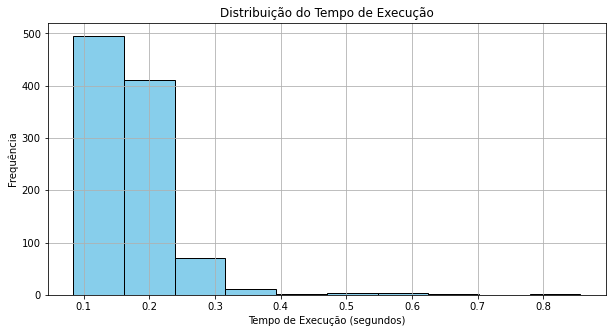

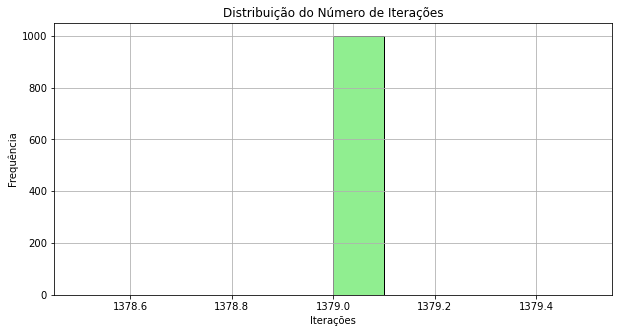

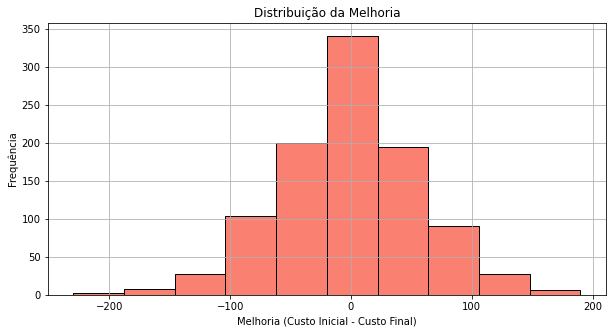

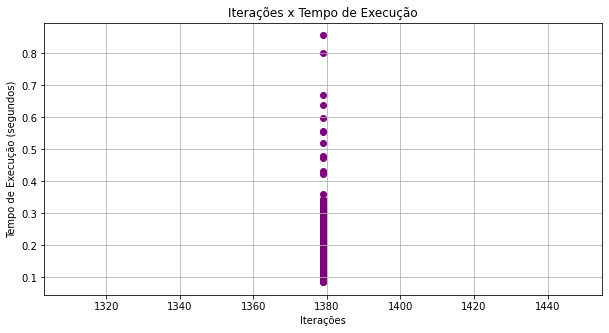

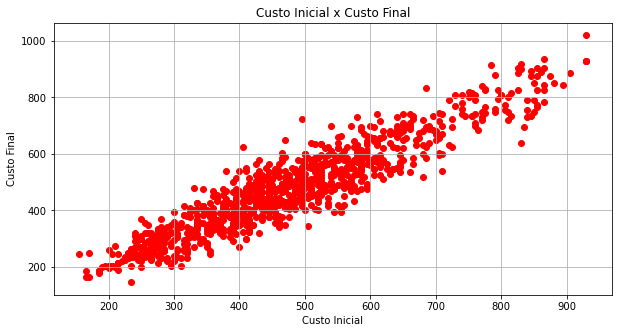

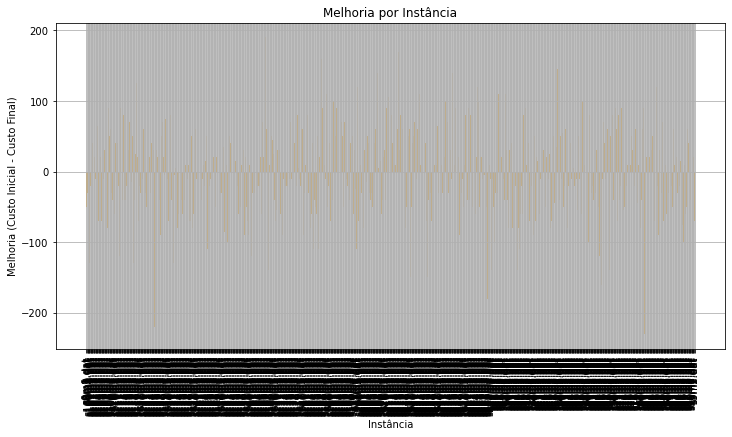

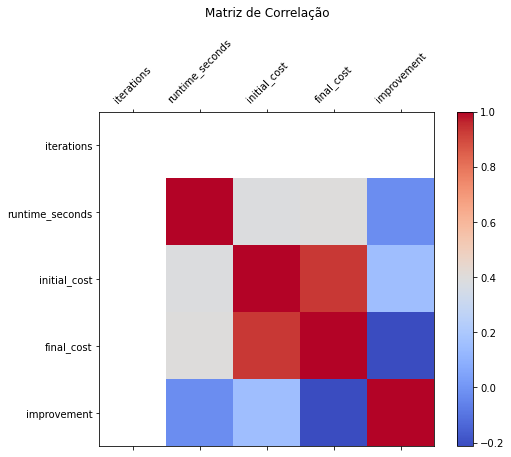

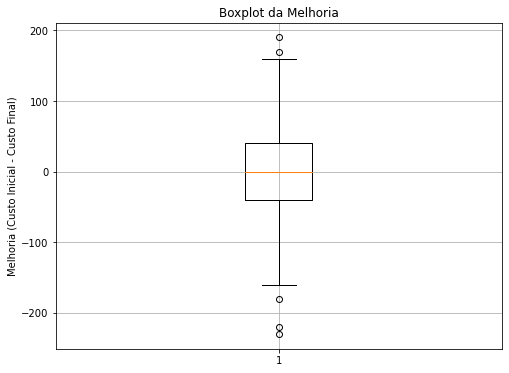

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Carrega os dados do CSV
df = pd.read_csv("metrics_results.csv")

# Exibe as primeiras linhas e estatísticas descritivas
print("Visualização inicial dos dados:")
print(df.head())
print("\nEstatísticas descritivas:")
print(df.describe())

# -------------------------------
# 1. Histogramas
# -------------------------------

# Histograma de runtime_seconds
plt.figure(figsize=(10, 5))
plt.hist(df['runtime_seconds'], bins=10, color='skyblue', edgecolor='black')
plt.xlabel('Tempo de Execução (segundos)')
plt.ylabel('Frequência')
plt.title('Distribuição do Tempo de Execução')
plt.grid(True)
plt.show()

# Histograma de iterações
plt.figure(figsize=(10, 5))
plt.hist(df['iterations'], bins=10, color='lightgreen', edgecolor='black')
plt.xlabel('Iterações')
plt.ylabel('Frequência')
plt.title('Distribuição do Número de Iterações')
plt.grid(True)
plt.show()

# Histograma de melhoria (improvement)
plt.figure(figsize=(10, 5))
plt.hist(df['improvement'], bins=10, color='salmon', edgecolor='black')
plt.xlabel('Melhoria (Custo Inicial - Custo Final)')
plt.ylabel('Frequência')
plt.title('Distribuição da Melhoria')
plt.grid(True)
plt.show()

# -------------------------------
# 2. Gráficos de Dispersão (Scatter Plots)
# -------------------------------

# Iterações vs. Tempo de Execução
plt.figure(figsize=(10, 5))
plt.scatter(df['iterations'], df['runtime_seconds'], color='purple')
plt.xlabel('Iterações')
plt.ylabel('Tempo de Execução (segundos)')
plt.title('Iterações x Tempo de Execução')
plt.grid(True)
plt.show()

# Custo Inicial vs. Custo Final
plt.figure(figsize=(10, 5))
plt.scatter(df['initial_cost'], df['final_cost'], color='red')
plt.xlabel('Custo Inicial')
plt.ylabel('Custo Final')
plt.title('Custo Inicial x Custo Final')
plt.grid(True)
plt.show()

# -------------------------------
# 3. Gráfico de Barras
# -------------------------------

# Melhoria por instância
plt.figure(figsize=(12, 6))
plt.bar(df['instance'], df['improvement'], color='orange')
plt.xlabel('Instância')
plt.ylabel('Melhoria (Custo Inicial - Custo Final)')
plt.title('Melhoria por Instância')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# -------------------------------
# 4. Matriz de Correlação
# -------------------------------

# Calcula a matriz de correlação para as métricas quantitativas
corr = df[['iterations', 'runtime_seconds', 'initial_cost', 'final_cost', 'improvement']].corr()
plt.figure(figsize=(8, 6))
cax = plt.matshow(corr, fignum=1, cmap='coolwarm')
plt.title("Matriz de Correlação", pad=20)
plt.colorbar(cax)
plt.xticks(range(len(corr.columns)), corr.columns, rotation=45)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.show()

# -------------------------------
# 5. Boxplot de Melhoria
# -------------------------------

plt.figure(figsize=(8, 6))
plt.boxplot(df['improvement'], vert=True)
plt.ylabel('Melhoria (Custo Inicial - Custo Final)')
plt.title('Boxplot da Melhoria')
plt.grid(True)
plt.show()
